In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

In [3]:
data = pd.read_csv("G:/M for Masters/Et cetera/Dissertation-LJMU/Research Proposal Submission/Darwin/data.csv")

In [3]:
data.head()

,ID,air_time1,disp_index1,gmrt_in_air1,gmrt_on_paper1,max_x_extension1,max_y_extension1,mean_acc_in_air1,mean_acc_on_paper1,mean_gmrt1,...,mean_jerk_in_air25,mean_jerk_on_paper25,mean_speed_in_air25,mean_speed_on_paper25,num_of_pendown25,paper_time25,pressure_mean25,pressure_var25,total_time25,class
0,id_1,5160,0.000013,120.804174,86.853334,957,6601,0.361800,0.217459,103.828754,...,0.141434,0.024471,5.596487,3.184589,71,40120,1749.278166,296102.7676,144605,P
1,id_2,51980,0.000016,115.318238,83.448681,1694,6998,0.272513,0.144880,99.383459,...,0.049663,0.018368,1.665973,0.950249,129,126700,1504.768272,278744.2850,298640,P
2,id_3,2600,0.000010,229.933997,172.761858,2333,5802,0.387020,0.181342,201.347928,...,0.178194,0.017174,4.000781,2.392521,74,45480,1431.443492,144411.7055,79025,P
3,id_4,2130,0.000010,369.403342,183.193104,1756,8159,0.556879,0.164502,276.298223,...,0.113905,0.019860,4.206746,1.613522,123,67945,1465.843329,230184.7154,181220,P
4,id_5,2310,0.000007,257.997131,111.275889,987,4732,0.266077,0.145104,184.636510,...,0.121782,0.020872,3.319036,1.680629,92,37285,1841.702561,158290.0255,72575,P


In [4]:
data.shape

(174, 452)

In [5]:
data.isnull().sum()

ID                 0
air_time1          0
disp_index1        0
gmrt_in_air1       0
gmrt_on_paper1     0
                  ..
paper_time25       0
pressure_mean25    0
pressure_var25     0
total_time25       0
class              0
Length: 452, dtype: int64

In [6]:
data.dtypes

ID                  object
air_time1            int64
disp_index1        float64
gmrt_in_air1       float64
gmrt_on_paper1     float64
                    ...   
paper_time25         int64
pressure_mean25    float64
pressure_var25     float64
total_time25         int64
class               object
Length: 452, dtype: object

In [7]:
data.describe()

,air_time1,disp_index1,gmrt_in_air1,gmrt_on_paper1,max_x_extension1,max_y_extension1,mean_acc_in_air1,mean_acc_on_paper1,mean_gmrt1,mean_jerk_in_air1,...,mean_gmrt25,mean_jerk_in_air25,mean_jerk_on_paper25,mean_speed_in_air25,mean_speed_on_paper25,num_of_pendown25,paper_time25,pressure_mean25,pressure_var25,total_time25
count,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,...,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,174.000000,1.740000e+02
mean,5664.166667,0.000010,297.666685,200.504413,1977.965517,7323.896552,0.416374,0.179823,249.085549,0.067556,...,221.360646,0.148286,0.019934,4.472643,2.871613,85.839080,43109.712644,1629.585962,163061.767360,1.642033e+05
std,12653.772746,0.000003,183.943181,111.629546,1648.306365,2188.290512,0.381837,0.064693,132.698462,0.074776,...,63.762013,0.062207,0.002388,1.501411,0.852809,27.485518,19092.024337,324.142316,56845.610814,4.969397e+05
min,65.000000,0.000002,28.734515,29.935835,754.000000,561.000000,0.067748,0.096631,41.199445,0.011861,...,69.928033,0.030169,0.014987,1.323565,0.950249,32.000000,15930.000000,474.049462,26984.926660,2.998000e+04
25%,1697.500000,0.000008,174.153023,136.524742,1362.500000,6124.000000,0.218209,0.146647,161.136182,0.029523,...,178.798382,0.107732,0.018301,3.485934,2.401199,66.000000,32803.750000,1499.112088,120099.046800,5.917500e+04
50%,2890.000000,0.000009,255.791452,176.494494,1681.000000,6975.500000,0.275184,0.163659,224.445268,0.039233,...,217.431621,0.140483,0.019488,4.510578,2.830672,81.000000,37312.500000,1729.385010,158236.771800,7.611500e+04
75%,4931.250000,0.000011,358.917885,234.052560,2082.750000,8298.500000,0.442706,0.188879,294.392298,0.071057,...,264.310776,0.199168,0.021134,5.212794,3.335828,101.500000,46533.750000,1865.626974,200921.078475,1.275425e+05
max,109965.000000,0.000028,1168.328276,865.210522,18602.000000,15783.000000,2.772566,0.627350,836.784702,0.543199,...,437.373267,0.375078,0.029227,10.416715,5.602909,209.000000,139575.000000,1999.775983,352981.850000,5.704200e+06


In [9]:
data.info("all")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174 entries, 0 to 173
Data columns (total 452 columns):
 #    Column                 Dtype  
---   ------                 -----  
 0    ID                     object 
 1    air_time1              int64  
 2    disp_index1            float64
 3    gmrt_in_air1           float64
 4    gmrt_on_paper1         float64
 5    max_x_extension1       int64  
 6    max_y_extension1       int64  
 7    mean_acc_in_air1       float64
 8    mean_acc_on_paper1     float64
 9    mean_gmrt1             float64
 10   mean_jerk_in_air1      float64
 11   mean_jerk_on_paper1    float64
 12   mean_speed_in_air1     float64
 13   mean_speed_on_paper1   float64
 14   num_of_pendown1        int64  
 15   paper_time1            int64  
 16   pressure_mean1         float64
 17   pressure_var1          float64
 18   total_time1            int64  
 19   air_time2              int64  
 20   disp_index2            float64
 21   gmrt_in_air2           float64
 22   

In [6]:
pd.value_counts(data['class'])

P    89
H    85
Name: class, dtype: int64

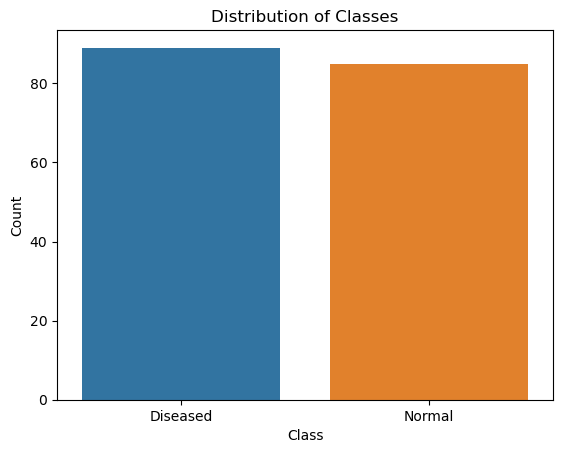

In [7]:
# Mapping class labels to meaningful names
class_mapping = {'P': 'Diseased', 'H': 'Normal'}
data['class'] = data['class'].map(class_mapping)

# Creating a count plot
sns.countplot(x='class', data=data)

# Adding labels and title
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Distribution of Classes')
plt.show()

In [6]:
data.columns

Index(['ID', 'air_time1', 'disp_index1', 'gmrt_in_air1', 'gmrt_on_paper1',
       'max_x_extension1', 'max_y_extension1', 'mean_acc_in_air1',
       'mean_acc_on_paper1', 'mean_gmrt1',
       ...
       'mean_jerk_in_air25', 'mean_jerk_on_paper25', 'mean_speed_in_air25',
       'mean_speed_on_paper25', 'num_of_pendown25', 'paper_time25',
       'pressure_mean25', 'pressure_var25', 'total_time25', 'class'],
      dtype='object', length=452)

In [7]:
cols = data.columns

In [9]:
column_names = data.columns
for col_name in column_names:
    print(col_name)

ID
air_time1
disp_index1
gmrt_in_air1
gmrt_on_paper1
max_x_extension1
max_y_extension1
mean_acc_in_air1
mean_acc_on_paper1
mean_gmrt1
mean_jerk_in_air1
mean_jerk_on_paper1
mean_speed_in_air1
mean_speed_on_paper1
num_of_pendown1
paper_time1
pressure_mean1
pressure_var1
total_time1
air_time2
disp_index2
gmrt_in_air2
gmrt_on_paper2
max_x_extension2
max_y_extension2
mean_acc_in_air2
mean_acc_on_paper2
mean_gmrt2
mean_jerk_in_air2
mean_jerk_on_paper2
mean_speed_in_air2
mean_speed_on_paper2
num_of_pendown2
paper_time2
pressure_mean2
pressure_var2
total_time2
air_time3
disp_index3
gmrt_in_air3
gmrt_on_paper3
max_x_extension3
max_y_extension3
mean_acc_in_air3
mean_acc_on_paper3
mean_gmrt3
mean_jerk_in_air3
mean_jerk_on_paper3
mean_speed_in_air3
mean_speed_on_paper3
num_of_pendown3
paper_time3
pressure_mean3
pressure_var3
total_time3
air_time4
disp_index4
gmrt_in_air4
gmrt_on_paper4
max_x_extension4
max_y_extension4
mean_acc_in_air4
mean_acc_on_paper4
mean_gmrt4
mean_jerk_in_air4
mean_jerk_on_p

In [ ]:
data = data.drop(columns=['ID'])

In [8]:
data.shape

(174, 451)

In [9]:
data['class'].value_counts()

P    89
H    85
Name: class, dtype: int64

<Axes: >

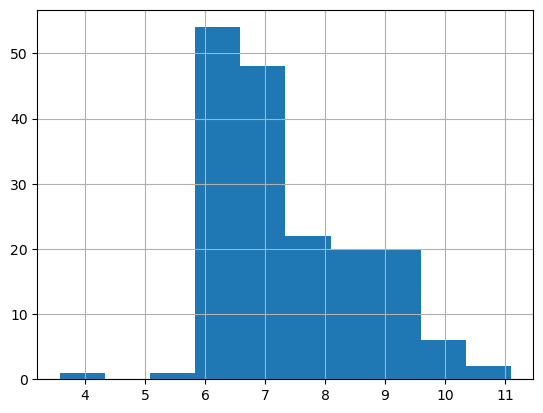

In [14]:
data['air_time5'].hist()

In [5]:
# Select numeric variables
numeric_data = data.select_dtypes(include='number')

# Select categorical variables
categorical_data = data.select_dtypes(exclude='number')

In [6]:
print("Shape of Numeric Data", numeric_data.shape)
print("Shape of Categorical Data", categorical_data.shape)

Shape of Numeric Data (174, 450)
Shape of Categorical Data (174, 1)


In [13]:
type(data)

pandas.core.frame.DataFrame

In [14]:
data.shape

(174, 451)

In [8]:
data["class"] = [1 if i == "P" else 0 for i in data["class"]]

In [9]:
correlation = data.corr().abs()['class'].drop('class')
print(correlation.sort_values(ascending=False))

gmrt_in_air7           0.462846
mean_gmrt7             0.457210
disp_index23           0.449566
mean_speed_in_air7     0.447509
paper_time9            0.445284
                         ...   
max_y_extension12      0.003908
mean_speed_in_air13    0.003197
total_time7            0.001822
num_of_pendown18       0.001013
pressure_var7          0.000542
Name: class, Length: 450, dtype: float64


In [10]:
variances = data.var()
threshold = 0.3
low_variance = variances[variances <= threshold].index
filtered_data = data.drop(columns = low_variance)
print("Column count before variance threshold: ",data.shape[1])
print("Column count after  variance threshold: ",filtered_data.shape[1])

Column count before variance threshold:  451
Column count after  variance threshold:  332


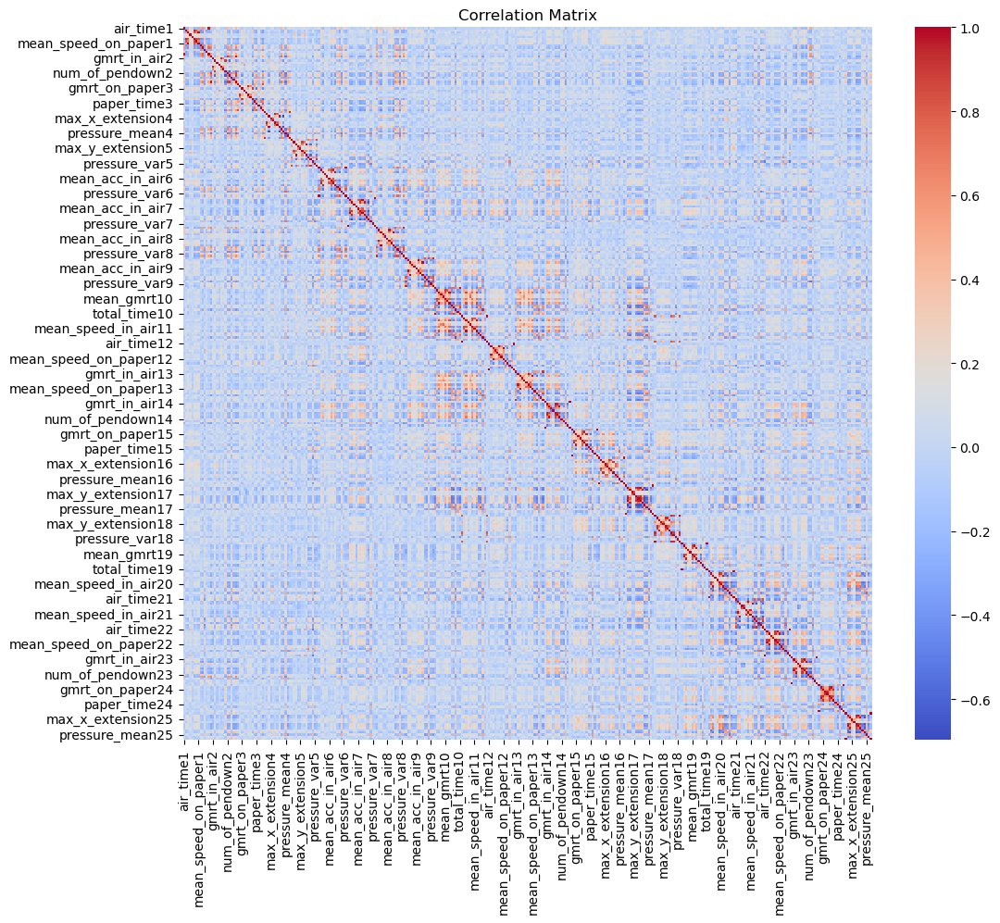

In [11]:
correlation_matrix = filtered_data.corr()

# Plotting the heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [12]:
# Extracting upper triangle of the correlation matrix
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Finding the top correlated features
top_correlations = upper_triangle.unstack().sort_values(ascending=False).dropna()

# Display the top correlated features
print("Top Correlations:")
print(top_correlations.head(20))  # Adjust the number as per your preference


Top Correlations:
total_time19           air_time19         0.999992
total_time14           air_time14         0.999728
total_time22           air_time22         0.999412
total_time25           air_time25         0.999294
total_time11           air_time11         0.998010
total_time12           air_time12         0.996805
mean_speed_on_paper8   gmrt_on_paper8     0.996254
total_time15           air_time15         0.995795
total_time7            air_time7          0.995395
total_time17           air_time17         0.991785
mean_speed_in_air17    gmrt_in_air17      0.990772
mean_speed_on_paper5   gmrt_on_paper5     0.990230
mean_speed_on_paper12  gmrt_on_paper12    0.989997
mean_speed_on_paper9   gmrt_on_paper9     0.989501
mean_speed_in_air7     gmrt_in_air7       0.989095
mean_gmrt21            gmrt_in_air21      0.988968
mean_speed_on_paper4   gmrt_on_paper4     0.988750
total_time23           air_time23         0.988343
total_time24           air_time24         0.987239
mean_speed_on

In [13]:
# Assuming 'class' is your target variable
target_variable = 'class'

# Add 'class' back to the filtered data
filtered_data_with_class = filtered_data.copy()
filtered_data_with_class[target_variable] = data[target_variable]

# Calculate the correlations with the target variable
target_correlations = filtered_data_with_class.corr()[target_variable].abs().sort_values(ascending=False)

# Assuming 'class' is your target variable
top_target_correlations = target_correlations.head(10)

# Display the top 10 correlations with the target variable
print("Top 10 Correlations with Target Variable:")
print(top_target_correlations)

Top 10 Correlations with Target Variable:
class                 1.000000
gmrt_in_air7          0.462846
mean_gmrt7            0.457210
mean_speed_in_air7    0.447509
paper_time9           0.445284
air_time16            0.440471
mean_gmrt17           0.439019
total_time9           0.429092
total_time3           0.423238
total_time16          0.421090
Name: class, dtype: float64


In [27]:
filtered_data_with_class.shape

(174, 333)

In [14]:
import pandas as pd
import numpy as np

# Assuming 'filtered_data_with_class' is your DataFrame with 'class' column added
# Compute the correlation matrix
correlation_matrix = filtered_data_with_class.corr().abs()

# Create a mask for the upper triangle
upper_triangle = correlation_matrix.where(np.triu(np.ones(correlation_matrix.shape), k=1).astype(bool))

# Set the correlation threshold (you can experiment with different values)
correlation_threshold = 0.95

# Find features with correlation above the threshold
to_drop = [column for column in upper_triangle.columns if any(upper_triangle[column] > correlation_threshold)]

# Drop the highly correlated features
new_data = filtered_data_with_class.drop(to_drop, axis=1)

# Print the features to be dropped
print(f"Features to drop: {to_drop}")

# Display the new DataFrame
new_data.head()



Features to drop: ['mean_speed_on_paper1', 'total_time1', 'total_time2', 'mean_speed_on_paper4', 'mean_speed_on_paper5', 'mean_speed_on_paper6', 'total_time6', 'mean_speed_in_air7', 'mean_speed_on_paper7', 'total_time7', 'mean_gmrt8', 'mean_speed_on_paper8', 'mean_gmrt9', 'mean_speed_on_paper9', 'mean_speed_on_paper10', 'total_time10', 'mean_speed_on_paper11', 'total_time11', 'mean_gmrt12', 'mean_speed_on_paper12', 'total_time12', 'mean_gmrt13', 'mean_speed_on_paper13', 'mean_gmrt14', 'mean_speed_in_air14', 'mean_speed_on_paper14', 'total_time14', 'mean_speed_in_air15', 'mean_speed_on_paper15', 'total_time15', 'total_time16', 'mean_gmrt17', 'mean_speed_in_air17', 'total_time17', 'mean_speed_on_paper18', 'total_time18', 'mean_speed_in_air19', 'mean_speed_on_paper19', 'total_time19', 'mean_speed_on_paper20', 'total_time20', 'mean_gmrt21', 'mean_speed_on_paper21', 'mean_speed_in_air22', 'mean_speed_on_paper22', 'total_time22', 'mean_speed_in_air23', 'mean_speed_on_paper23', 'total_time23'

,air_time1,gmrt_in_air1,gmrt_on_paper1,max_x_extension1,max_y_extension1,mean_gmrt1,mean_speed_in_air1,num_of_pendown1,paper_time1,pressure_mean1,...,gmrt_in_air25,gmrt_on_paper25,max_x_extension25,max_y_extension25,mean_gmrt25,num_of_pendown25,paper_time25,pressure_mean25,pressure_var25,class
0,5160,120.804174,86.853334,957,6601,103.828754,1.828076,22,10730,1679.232060,...,279.628181,219.829989,10066,13235,249.729085,71,40120,1749.278166,296102.7676,1
1,51980,115.318238,83.448681,1694,6998,99.383459,1.817744,11,12460,1723.171348,...,86.117902,68.398886,7365,15282,77.258394,129,126700,1504.768272,278744.2850,1
2,2600,229.933997,172.761858,2333,5802,201.347928,3.378343,10,6080,1520.253289,...,215.379542,171.954494,7688,14127,193.667018,74,45480,1431.443492,144411.7055,1
3,2130,369.403342,183.193104,1756,8159,276.298223,5.082499,10,5595,1913.995532,...,207.557650,118.573956,6397,14913,163.065803,123,67945,1465.843329,230184.7154,1
4,2310,257.997131,111.275889,987,4732,184.636510,3.804656,8,4080,1819.121324,...,167.510556,126.678802,4624,15532,147.094679,92,37285,1841.702561,158290.0255,1


In [15]:
import pandas as pd
import numpy as np
from scipy.stats import shapiro
from scipy.special import boxcox1p
from sklearn.preprocessing import PowerTransformer
from scipy.special import boxcox1p
from sklearn.preprocessing import PowerTransformer

# Assume your dataset is stored in a variable 'data'
# Exclude the 'class' column from the analysis
target_variable = 'class'
columns_to_transform = [col for col in new_data.columns if col != target_variable]

# Define a function to apply Box-Cox transformation only to non-normally distributed columns
def apply_box_cox_if_needed(column_data):
    stat, p = shapiro(column_data)
    alpha = 0.05
    
    if p > alpha:
        # Data is normally distributed, no transformation needed
        return column_data
    else:
        # Data is not normally distributed, apply Box-Cox transformation
        transformed_data = boxcox1p(column_data, 0)  # Set the lambda parameter to 0
        return transformed_data

# Apply the Box-Cox transformation only to non-normally distributed columns
for column in columns_to_transform:
    new_data[column] = apply_box_cox_if_needed(new_data[column])

# You can also use sklearn's PowerTransformer for an alternative approach
# power_transformer = PowerTransformer(method='box-cox', standardize=False)
# data[columns_to_transform] = power_transformer.fit_transform(data[columns_to_transform])



In [16]:
new_data.shape

(174, 278)

Transform or Remove Outliers: After identifying outliers, you can choose one of the following methods to handle them:

a. Winsorization: In winsorization, you replace the outliers with a predefined percentile value. For example, you can replace values below the 5th percentile with the 5th percentile value and values above the 95th percentile with the 95th percentile value.

b. Log Transformation: For positively skewed data, applying a log transformation can make the distribution more normal and reduce the impact of outliers.

c. Box-Cox Transformation: The Box-Cox transformation is useful for handling data that does not follow a normal distribution. It can help mitigate the impact of outliers.

d. Robust Scaler: You can use the RobustScaler from scikit-learn to scale your features while being robust to outliers.

e. Clipping: Clip the data by setting a lower and upper bound for each feature to limit the effect of outliers.

air_time1: Not normally distributed (p-value: 5.4516080126632005e-05)


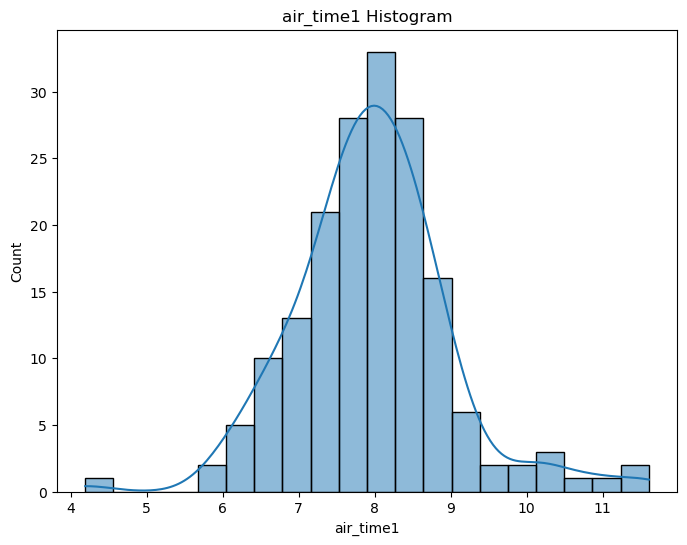

gmrt_in_air1: Normally distributed (p-value: 0.057341672480106354)


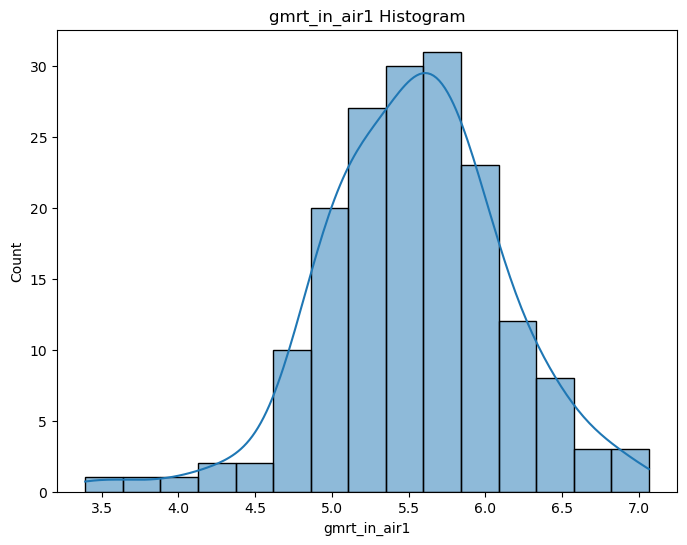

gmrt_on_paper1: Normally distributed (p-value: 0.0702226310968399)


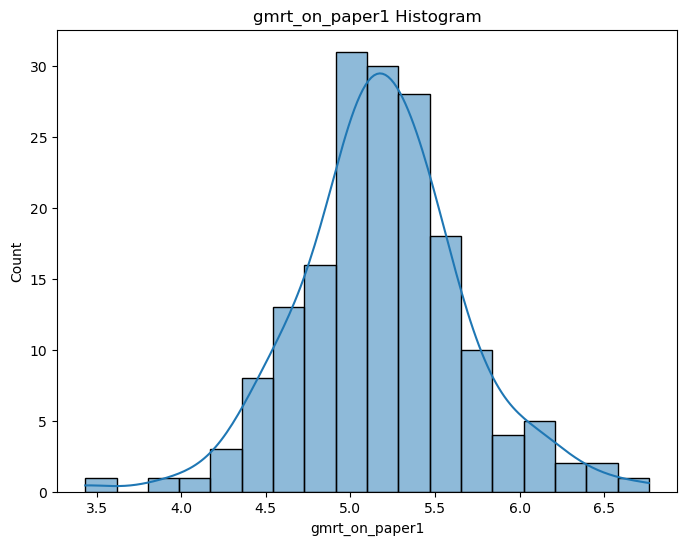

max_x_extension1: Not normally distributed (p-value: 7.548619507247167e-10)


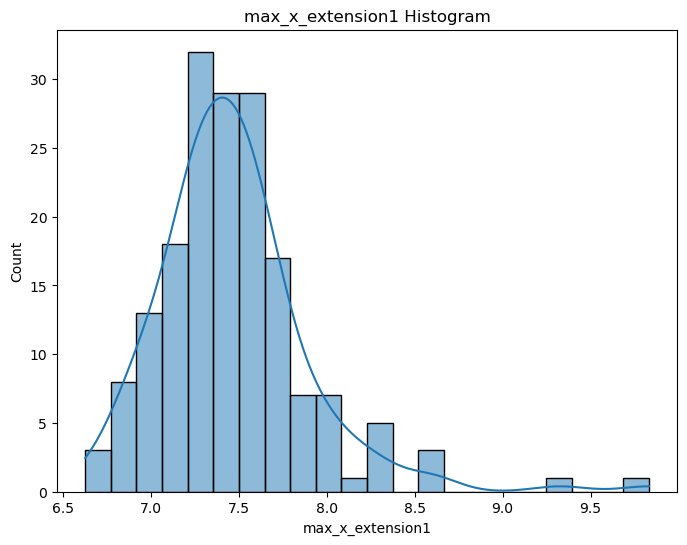

max_y_extension1: Not normally distributed (p-value: 1.332422128359767e-13)


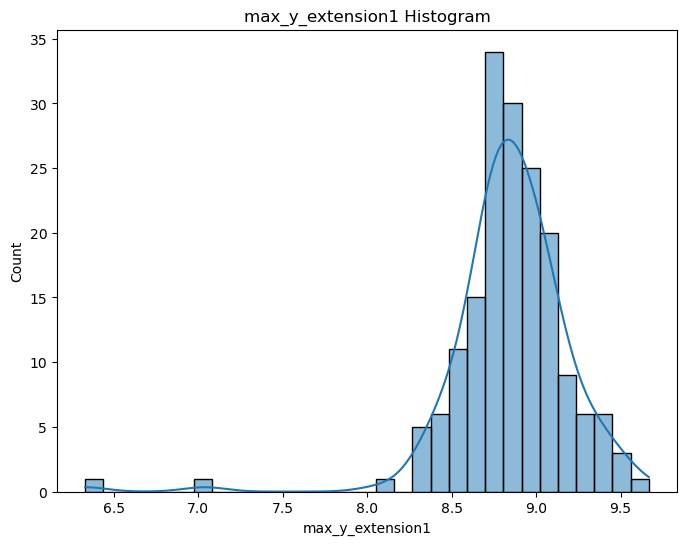

mean_gmrt1: Normally distributed (p-value: 0.18065765500068665)


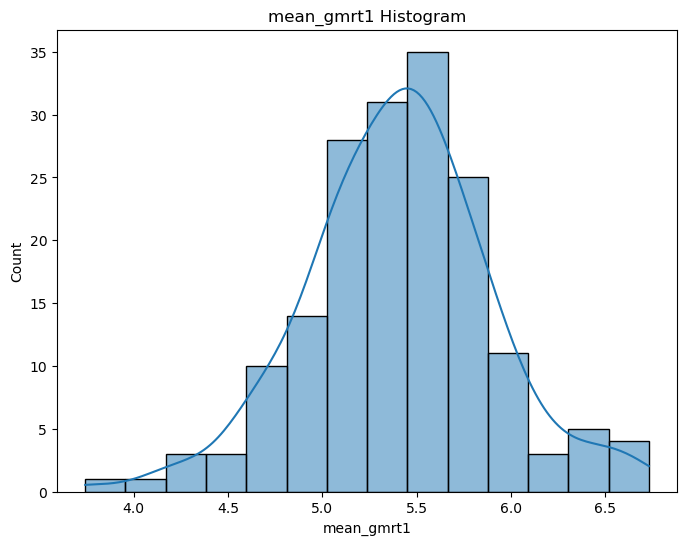

mean_speed_in_air1: Not normally distributed (p-value: 0.002628128044307232)


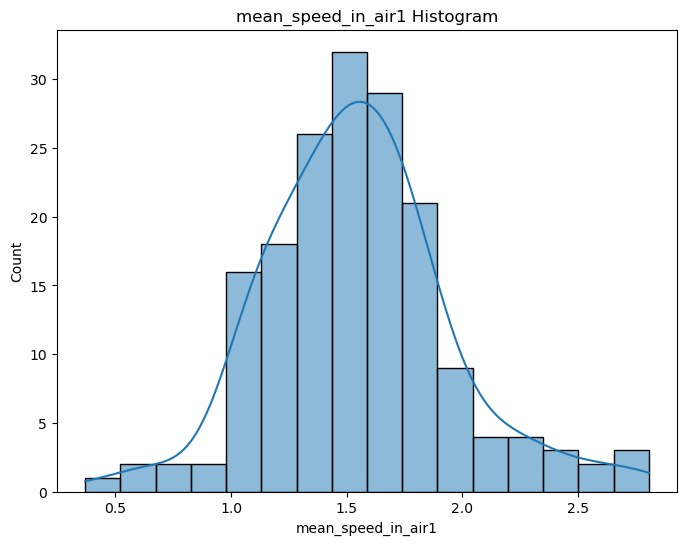

num_of_pendown1: Not normally distributed (p-value: 0.03727042302489281)


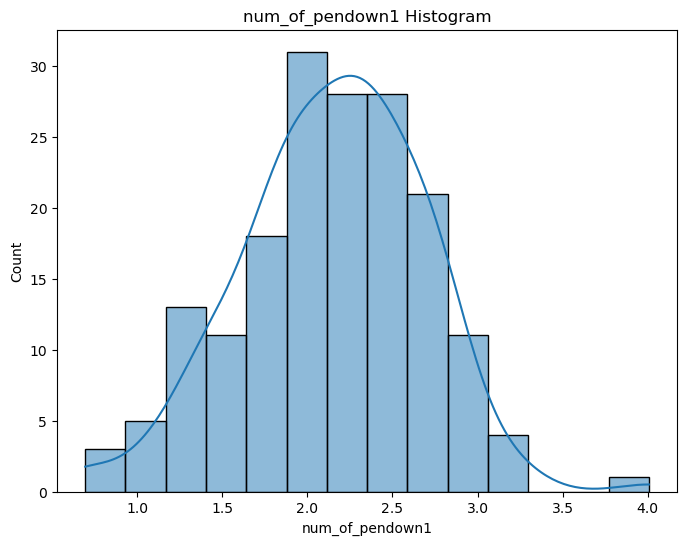

paper_time1: Not normally distributed (p-value: 8.511134979016788e-07)


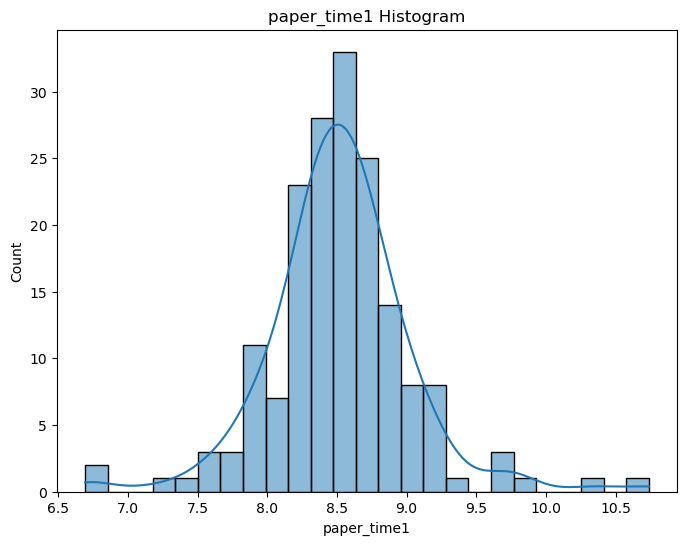

pressure_mean1: Not normally distributed (p-value: 6.814674828126491e-14)


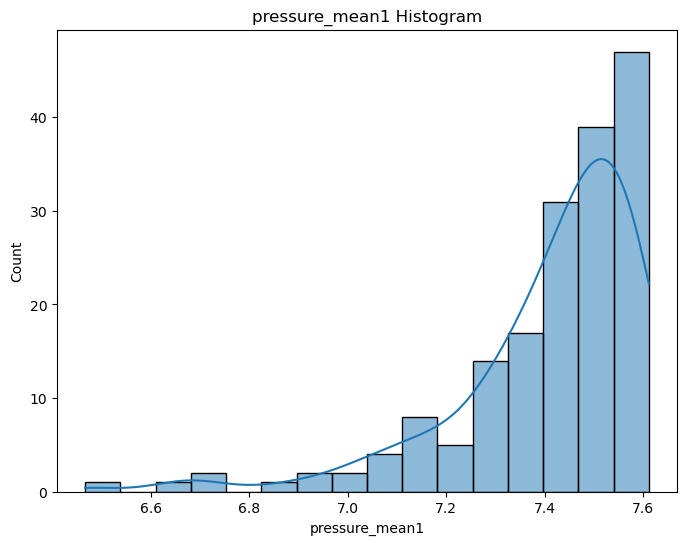

pressure_var1: Not normally distributed (p-value: 1.1656831702566706e-05)


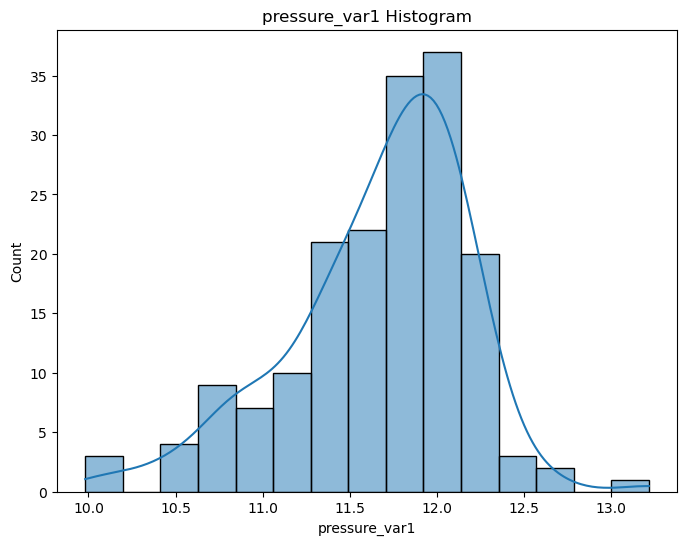

air_time2: Not normally distributed (p-value: 0.007202865555882454)


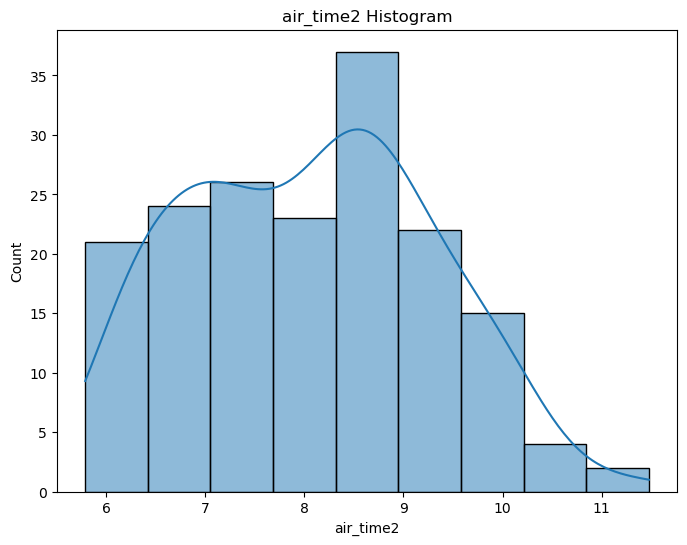

gmrt_in_air2: Not normally distributed (p-value: 1.4878706679155584e-05)


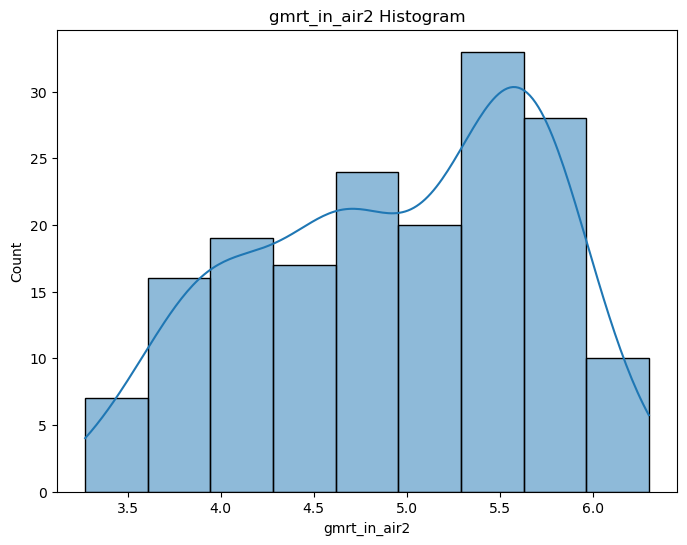

gmrt_on_paper2: Not normally distributed (p-value: 2.046007113731818e-11)


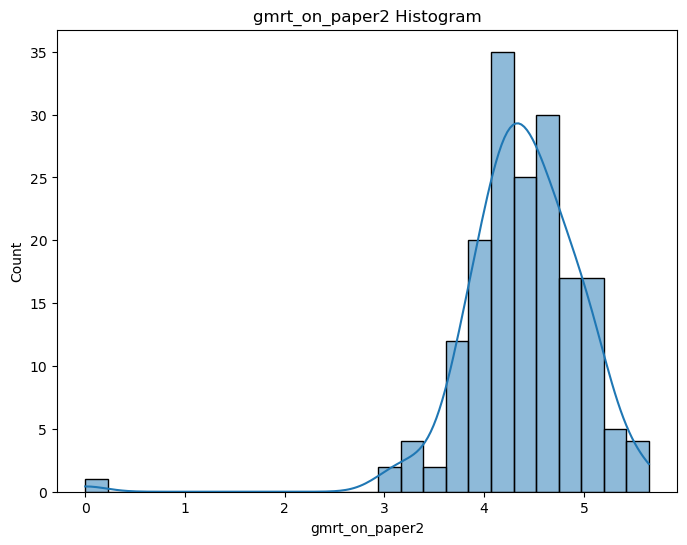

max_x_extension2: Not normally distributed (p-value: 2.3357484349451063e-11)


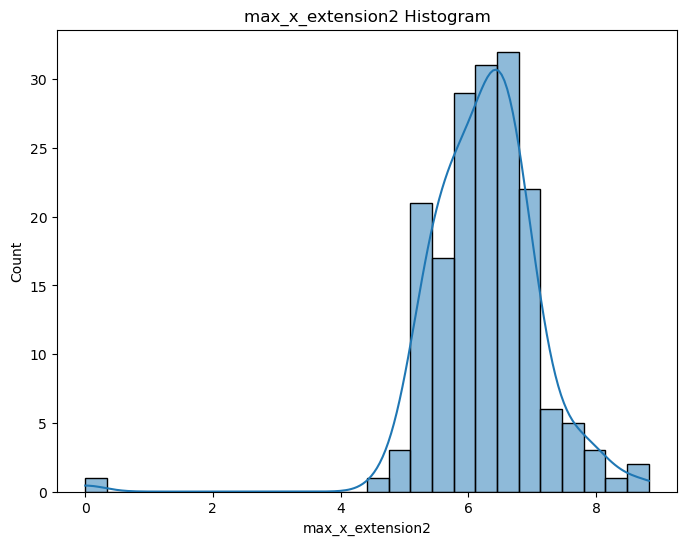

max_y_extension2: Not normally distributed (p-value: 1.830527656441053e-27)


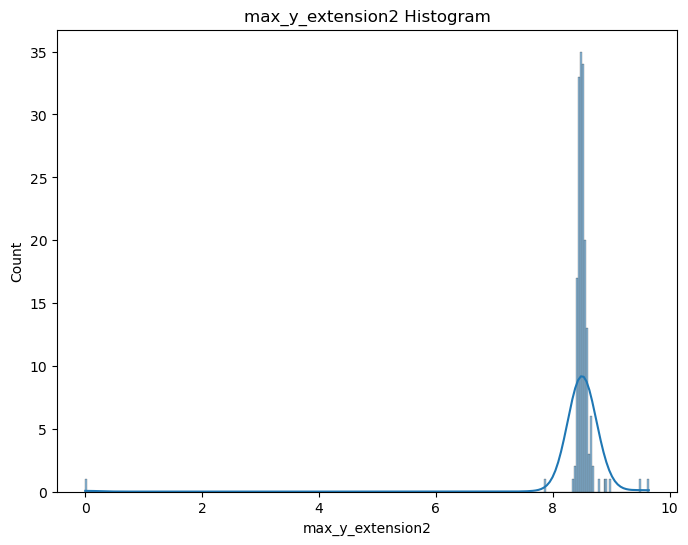

mean_gmrt2: Not normally distributed (p-value: 0.013223972171545029)


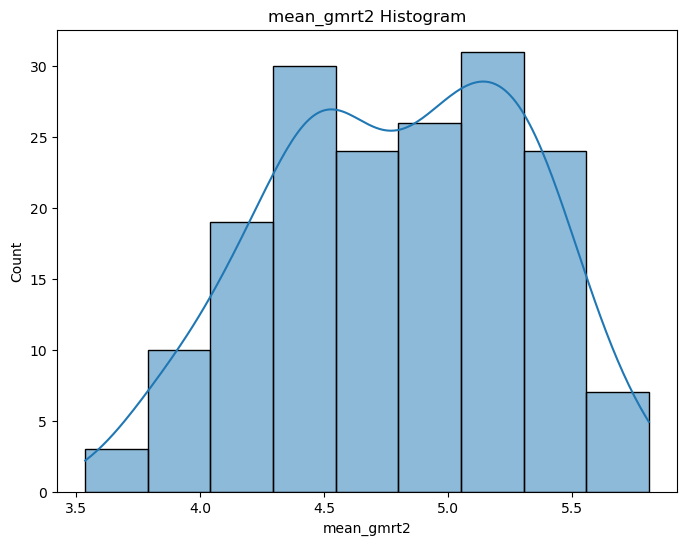

mean_speed_in_air2: Not normally distributed (p-value: 0.04283406585454941)


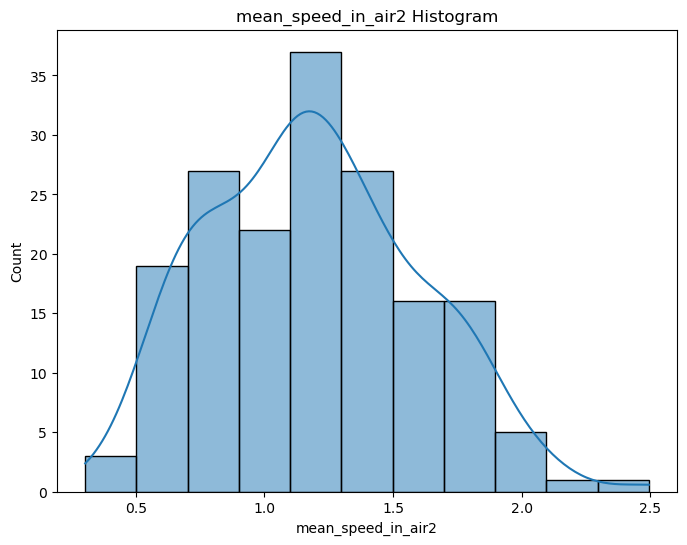

mean_speed_on_paper2: Normally distributed (p-value: 0.25253400206565857)


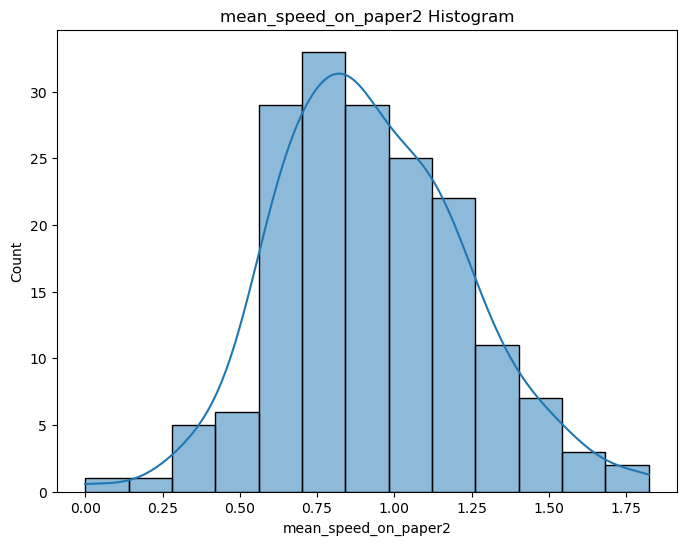

num_of_pendown2: Not normally distributed (p-value: 1.113683312237157e-10)


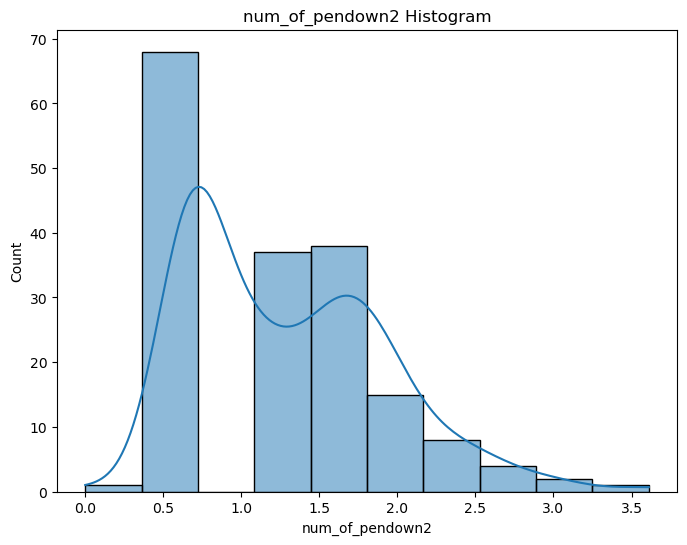

paper_time2: Not normally distributed (p-value: 2.750060497247708e-20)


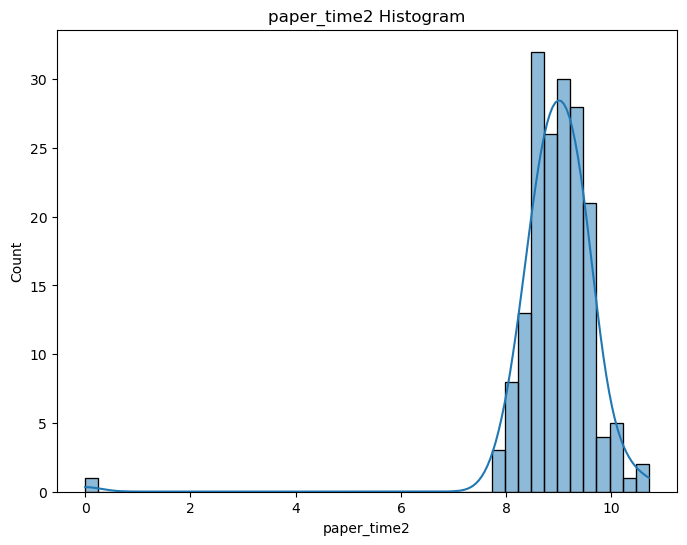

pressure_mean2: Not normally distributed (p-value: 2.2306035874975413e-26)


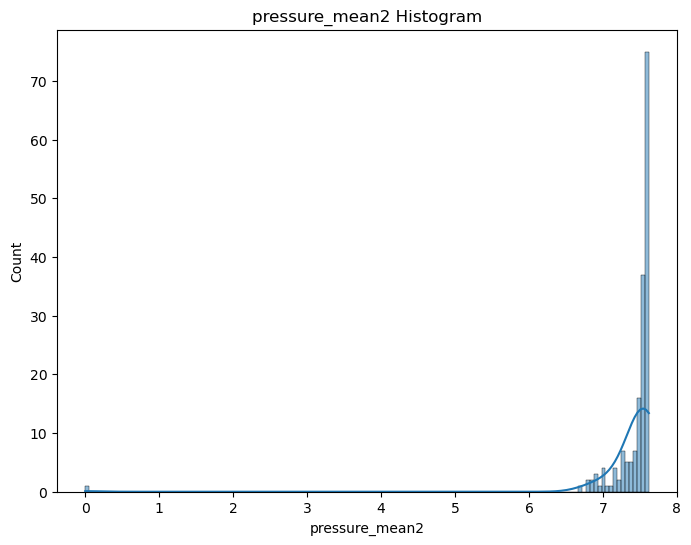

pressure_var2: Not normally distributed (p-value: 7.308962102254265e-18)


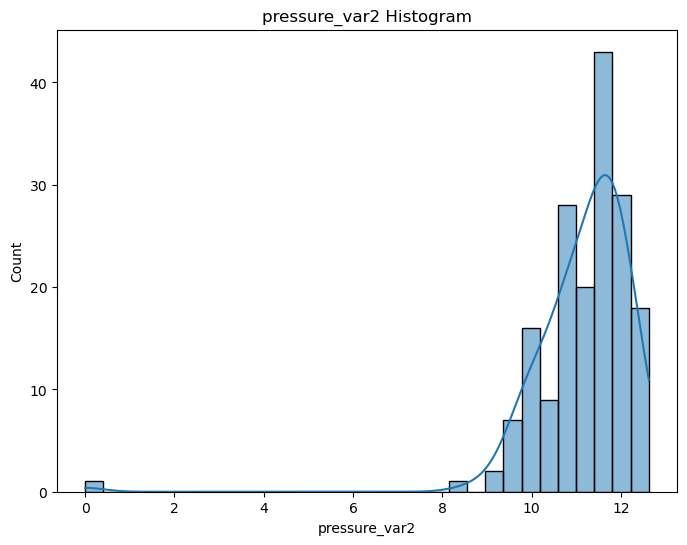

air_time3: Not normally distributed (p-value: 3.194918826920912e-05)


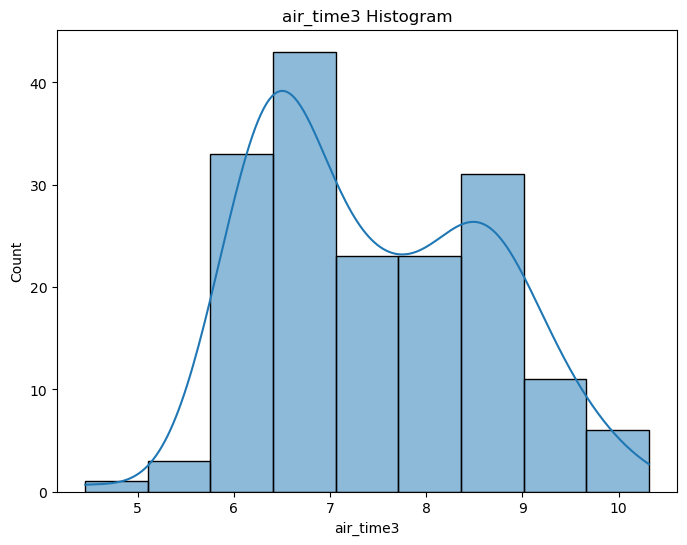

gmrt_in_air3: Not normally distributed (p-value: 0.004750903695821762)


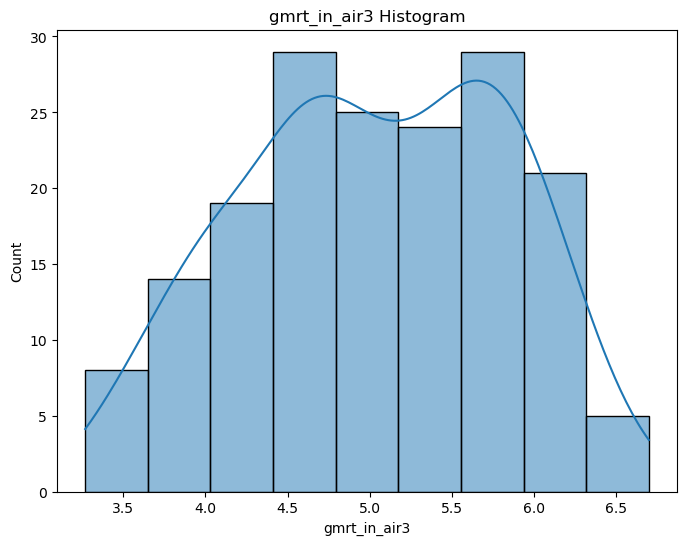

gmrt_on_paper3: Not normally distributed (p-value: 1.1355686326871694e-16)


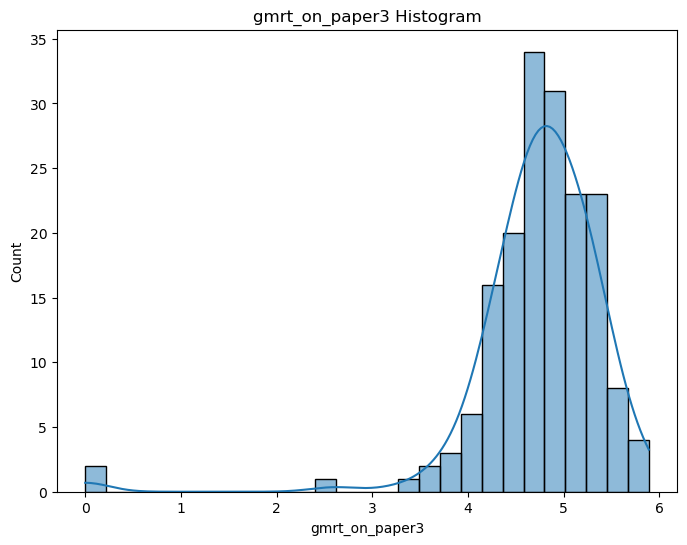

max_x_extension3: Not normally distributed (p-value: 1.2386550644592465e-26)


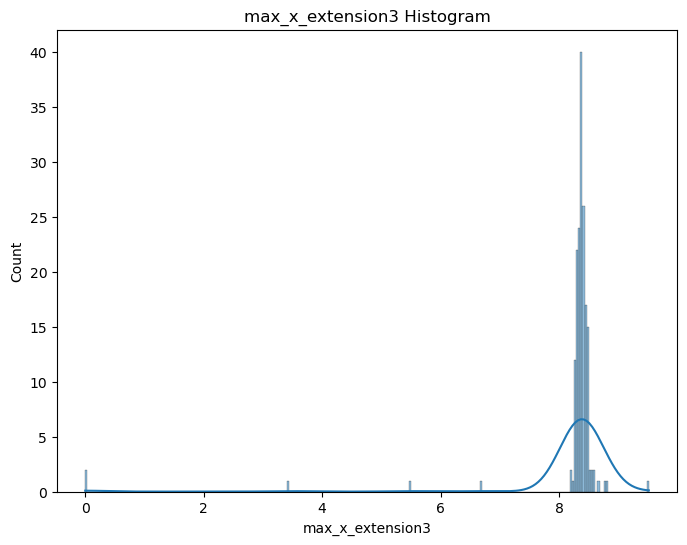

max_y_extension3: Not normally distributed (p-value: 1.0378468050242784e-11)


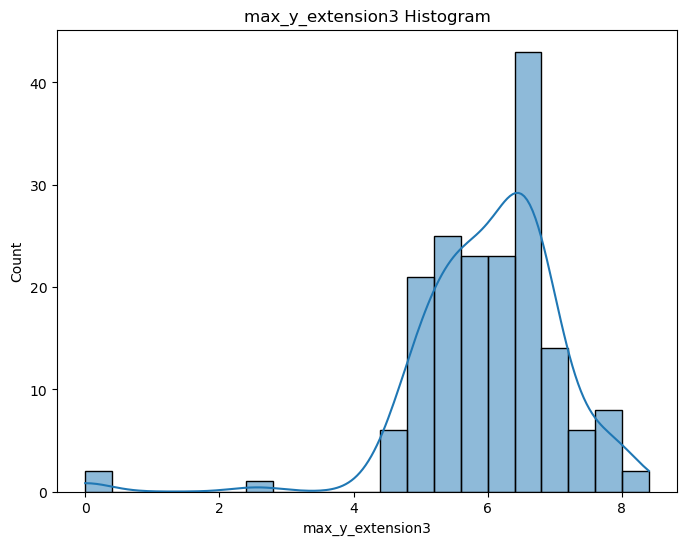

mean_gmrt3: Not normally distributed (p-value: 0.008587611839175224)


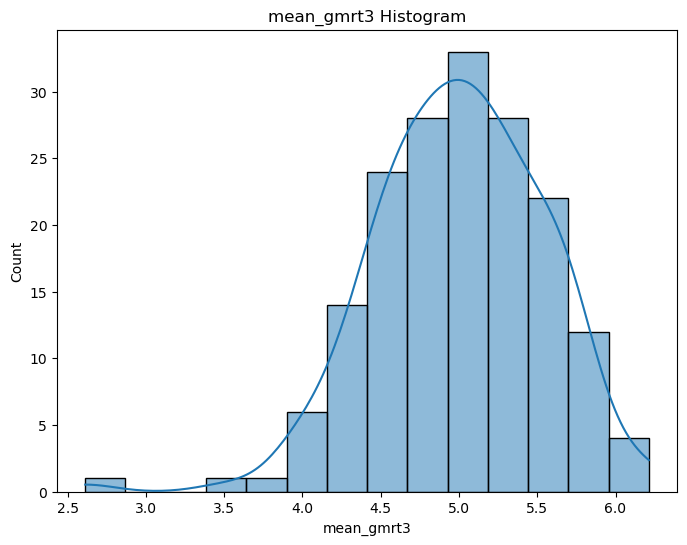

mean_speed_in_air3: Not normally distributed (p-value: 0.006499945651739836)


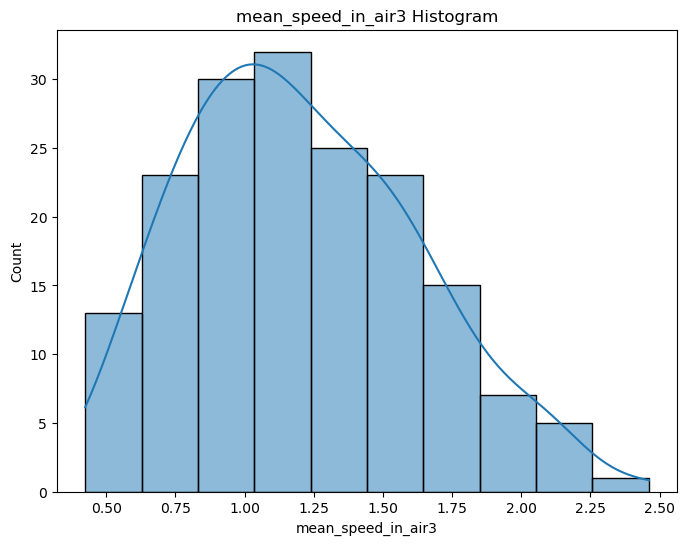

mean_speed_on_paper3: Normally distributed (p-value: 0.1257176697254181)


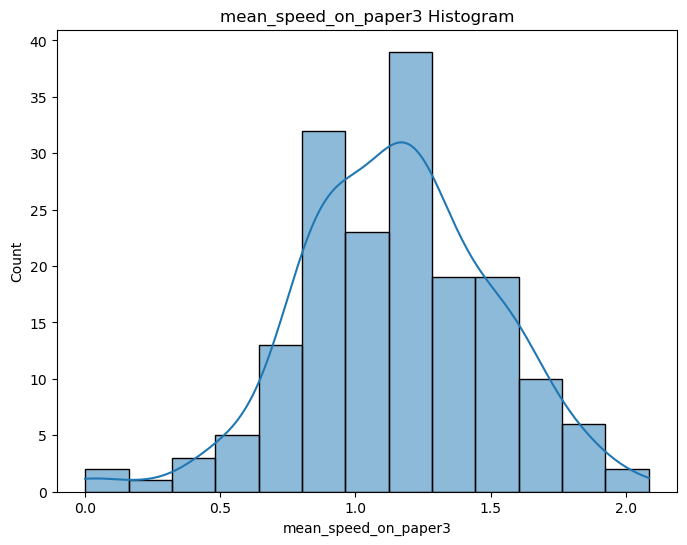

num_of_pendown3: Not normally distributed (p-value: 1.1439017322343453e-13)


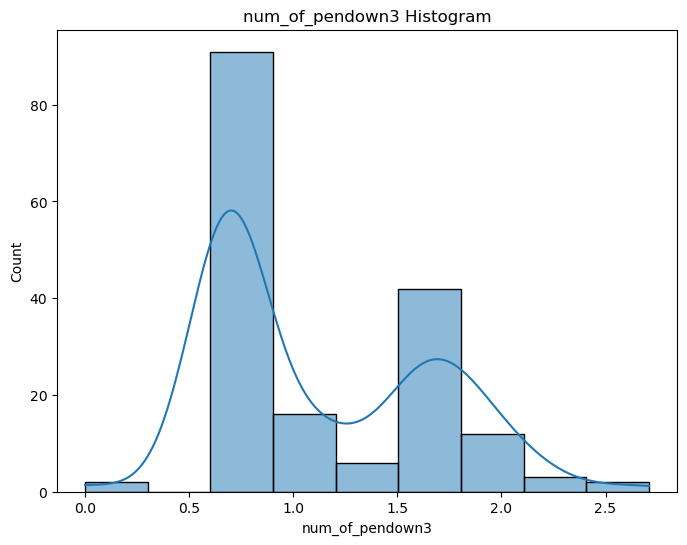

paper_time3: Not normally distributed (p-value: 6.371712582746214e-22)


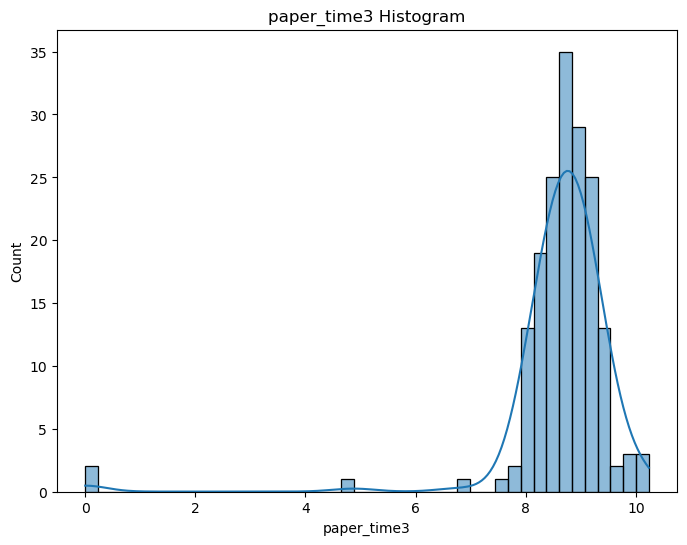

pressure_mean3: Not normally distributed (p-value: 1.930274688267378e-26)


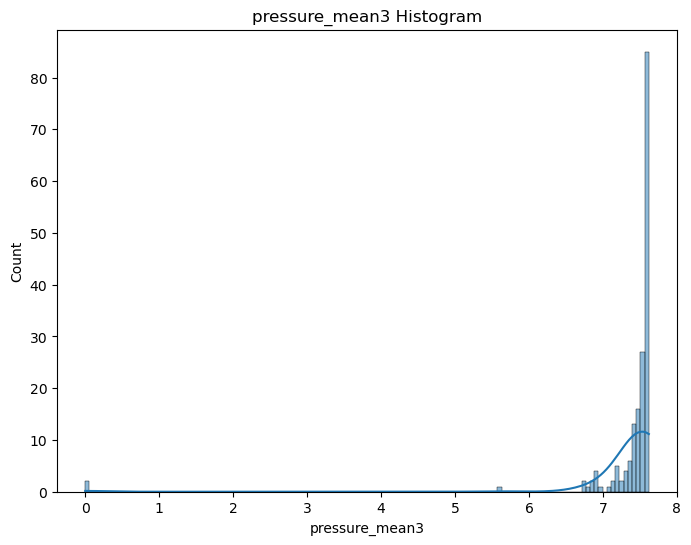

pressure_var3: Not normally distributed (p-value: 5.77221042476737e-20)


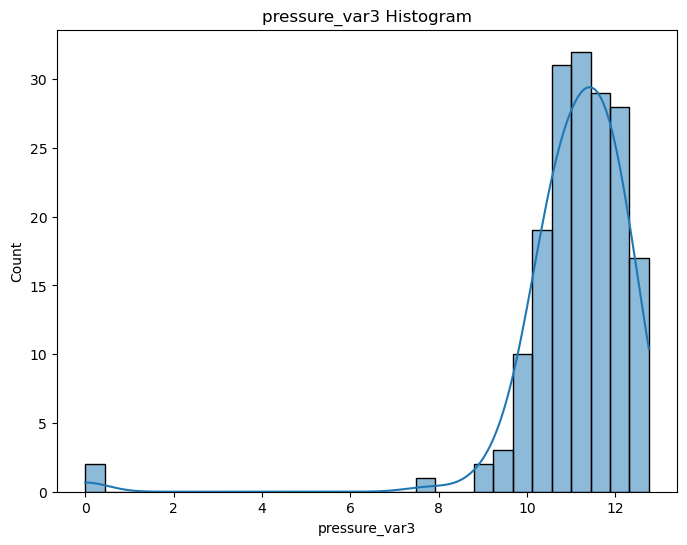

total_time3: Not normally distributed (p-value: 0.0015734012704342604)


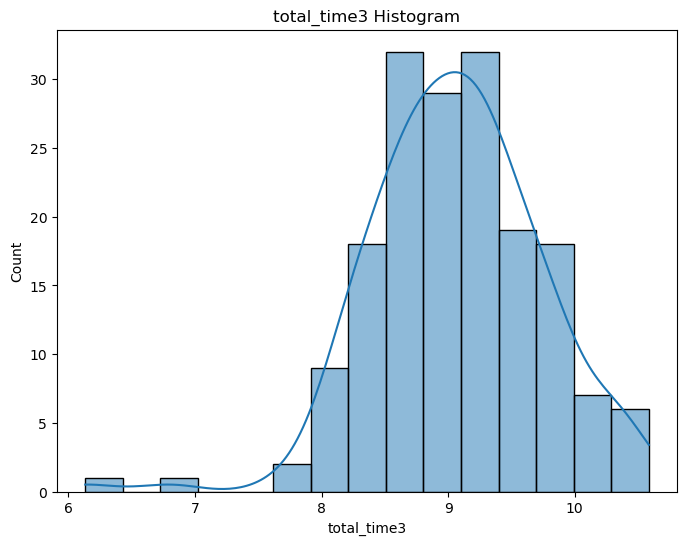

air_time4: Not normally distributed (p-value: 0.0001756747078616172)


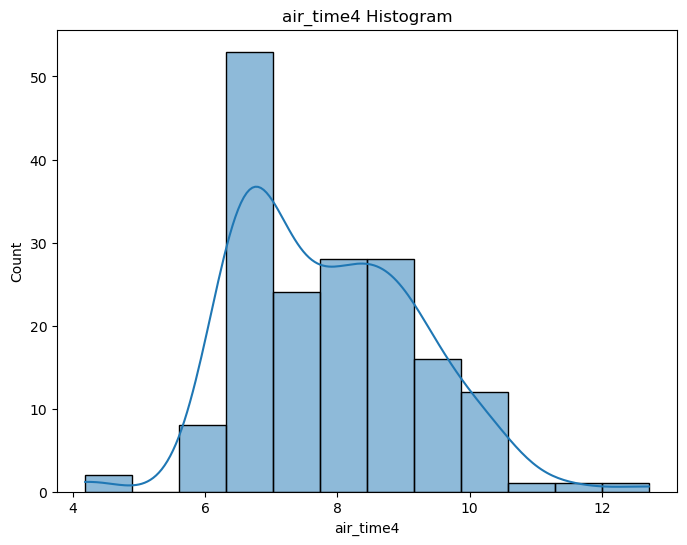

gmrt_in_air4: Normally distributed (p-value: 0.4931311309337616)


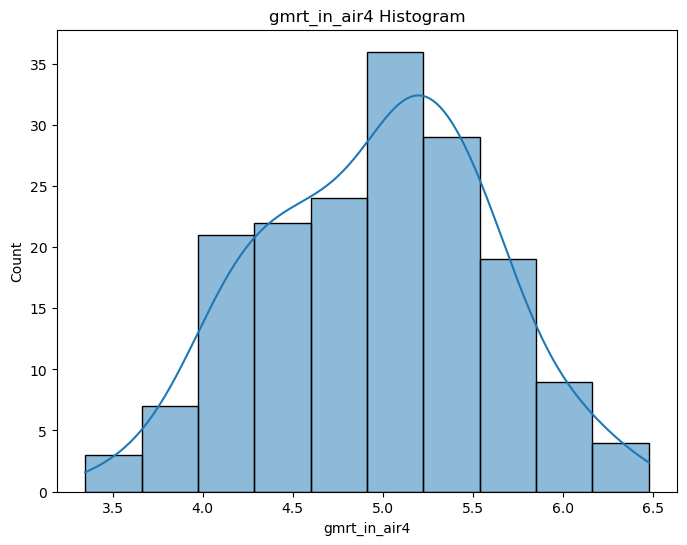

gmrt_on_paper4: Normally distributed (p-value: 0.3757934272289276)


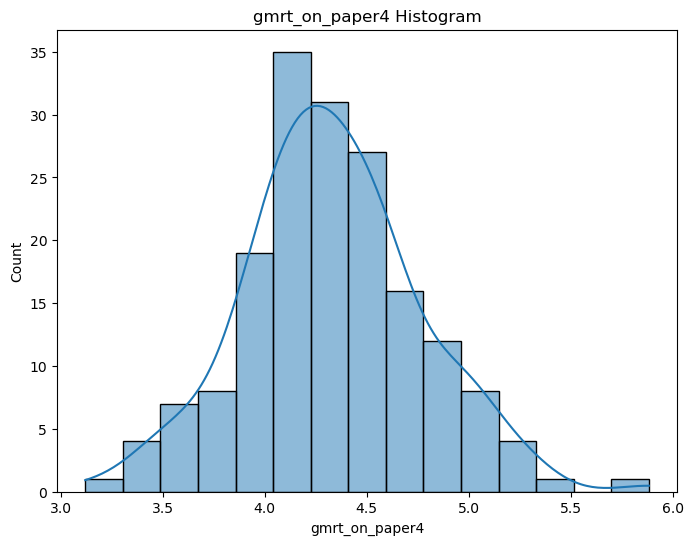

max_x_extension4: Not normally distributed (p-value: 2.402216937450922e-16)


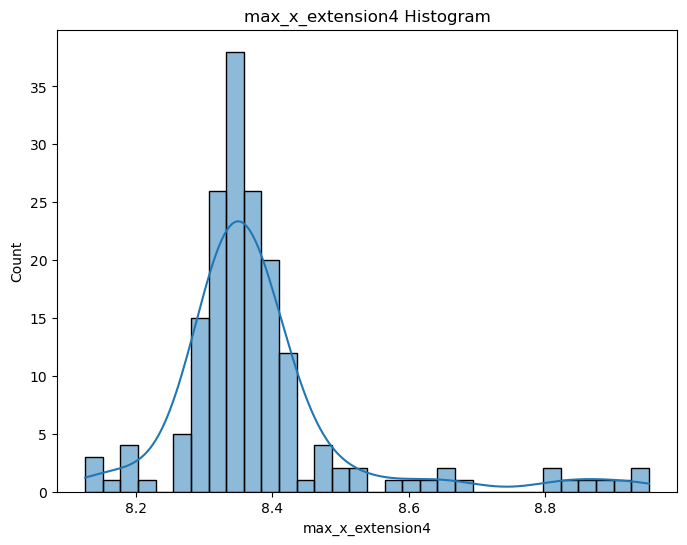

max_y_extension4: Not normally distributed (p-value: 1.6719935104408123e-18)


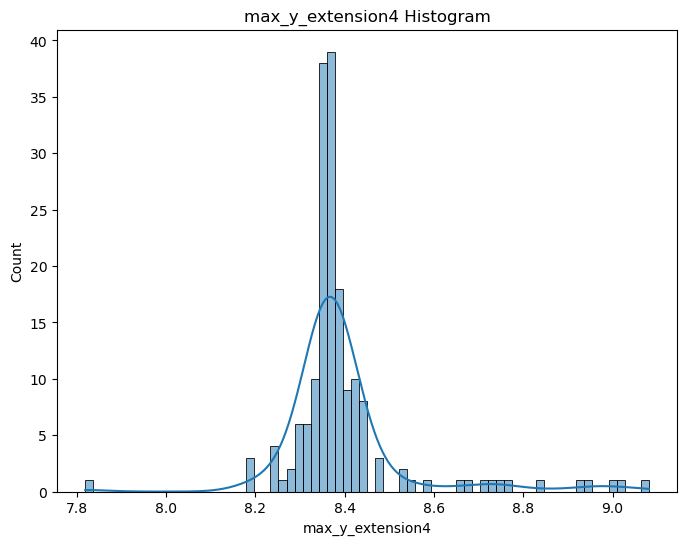

mean_gmrt4: Normally distributed (p-value: 0.2466377466917038)


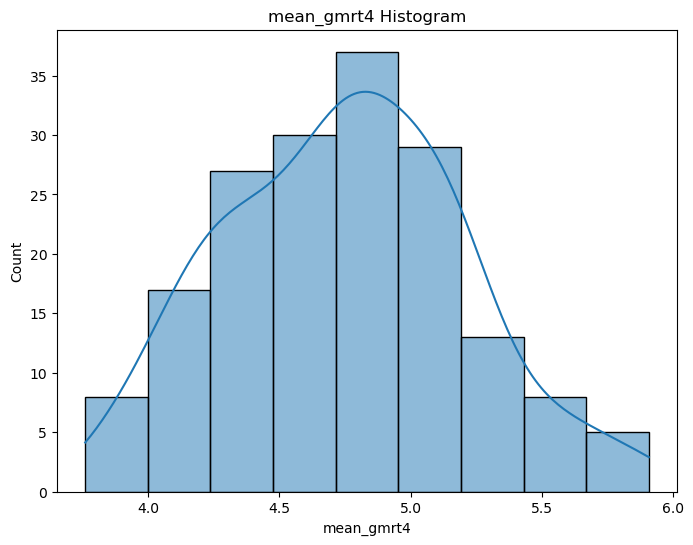

mean_speed_in_air4: Not normally distributed (p-value: 1.9553908714442514e-06)


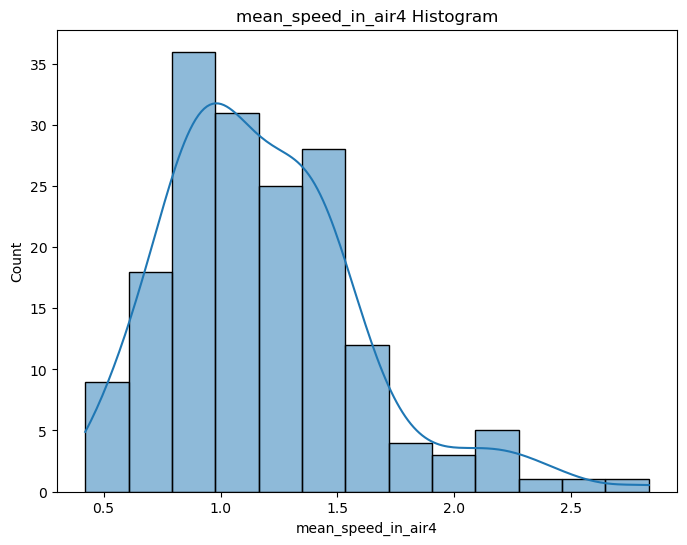

num_of_pendown4: Not normally distributed (p-value: 7.668549768715532e-14)


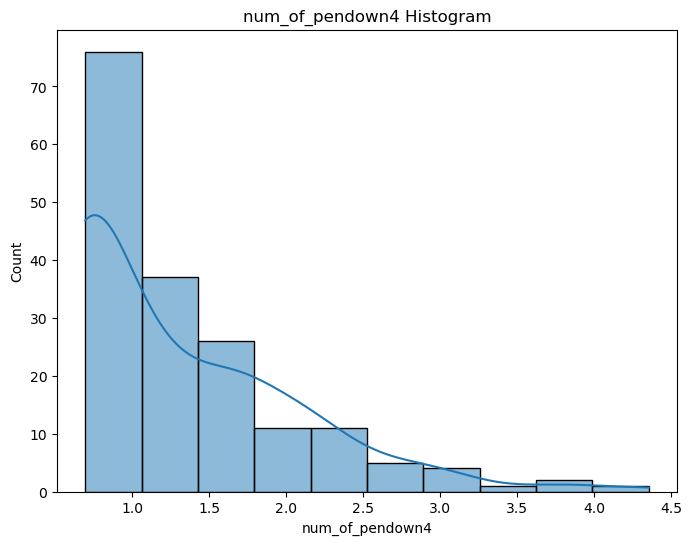

paper_time4: Not normally distributed (p-value: 0.005059011746197939)


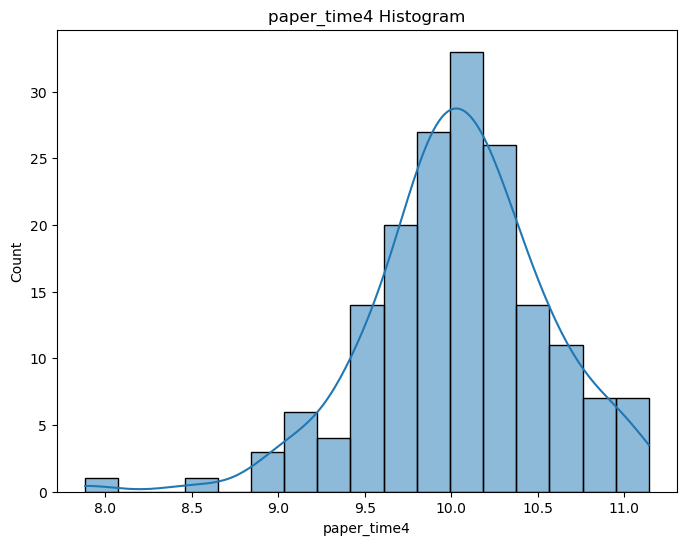

pressure_mean4: Not normally distributed (p-value: 6.836564963910162e-22)


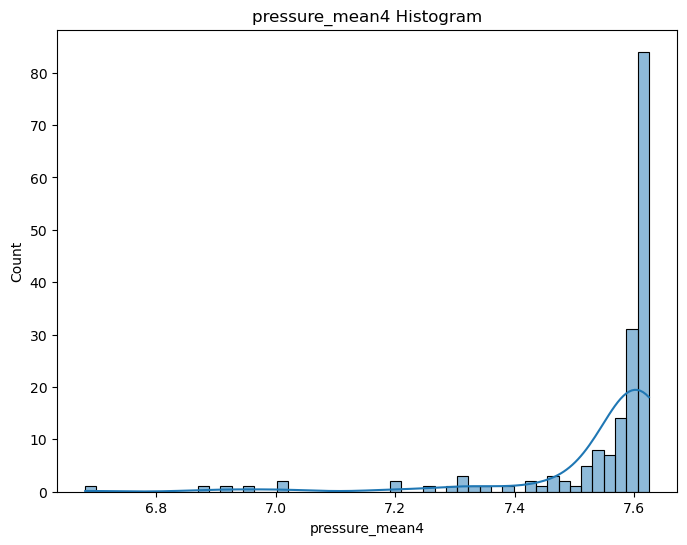

pressure_var4: Not normally distributed (p-value: 0.0027248815167695284)


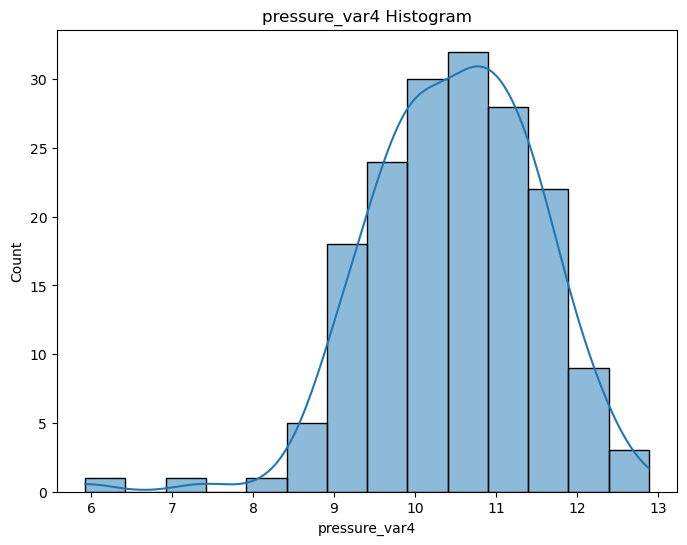

total_time4: Not normally distributed (p-value: 0.0008658308070152998)


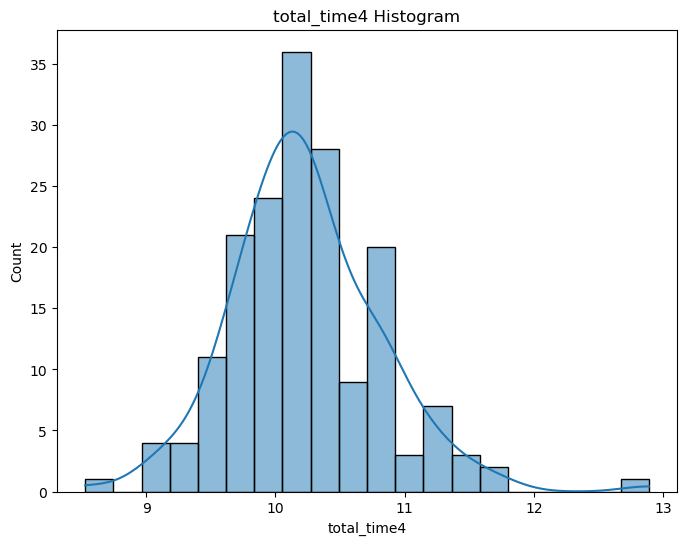

air_time5: Not normally distributed (p-value: 1.5699577193828418e-09)


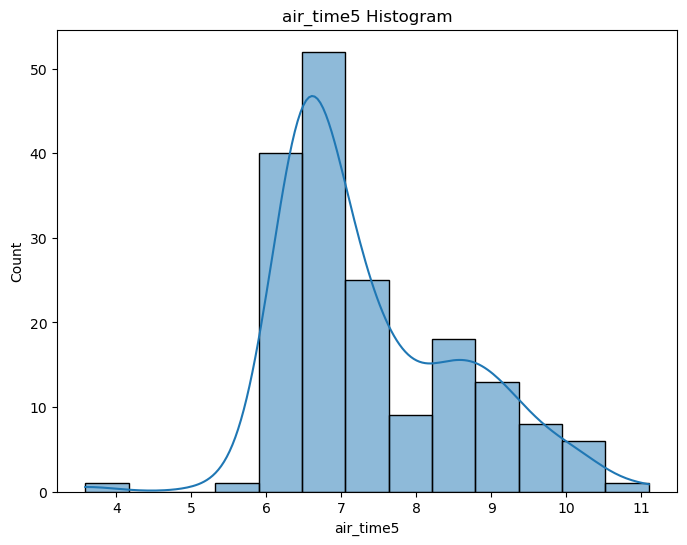

gmrt_in_air5: Not normally distributed (p-value: 1.7192953657985122e-11)


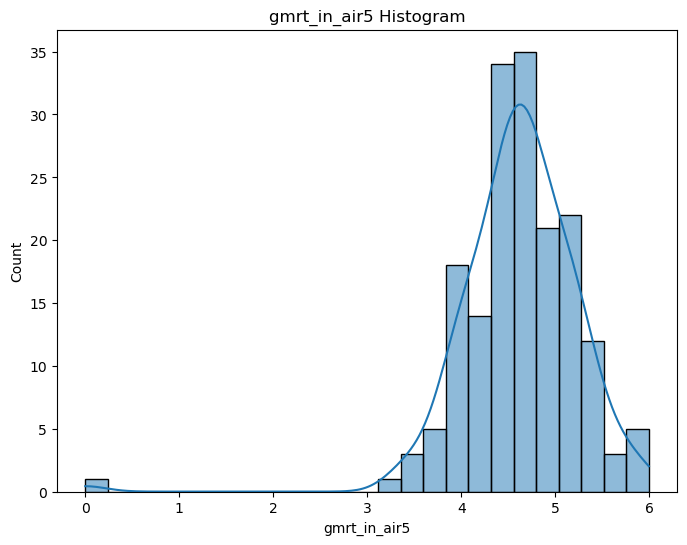

gmrt_on_paper5: Not normally distributed (p-value: 7.504296019495999e-15)


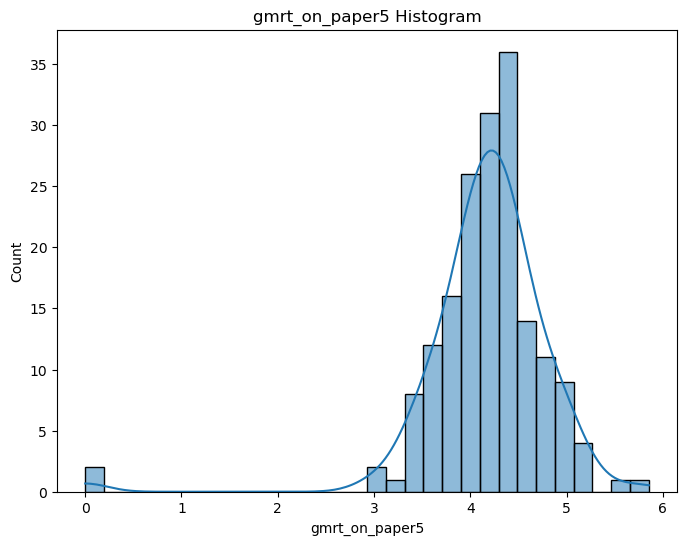

max_x_extension5: Not normally distributed (p-value: 2.3788518138551554e-26)


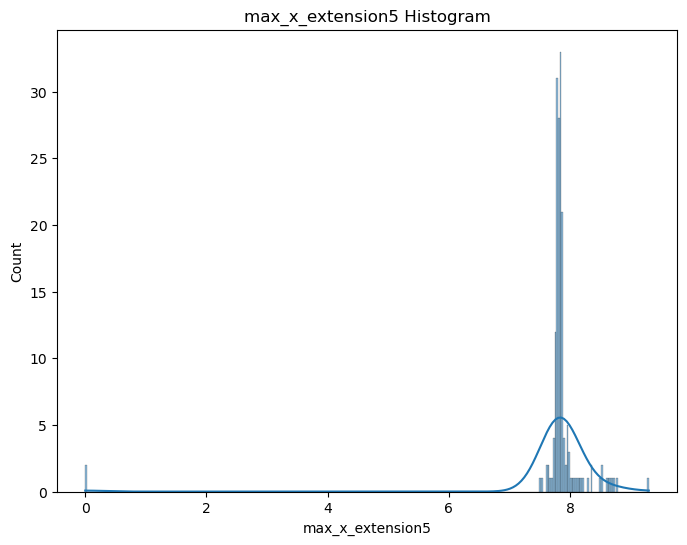

max_y_extension5: Not normally distributed (p-value: 2.2375957917164358e-26)


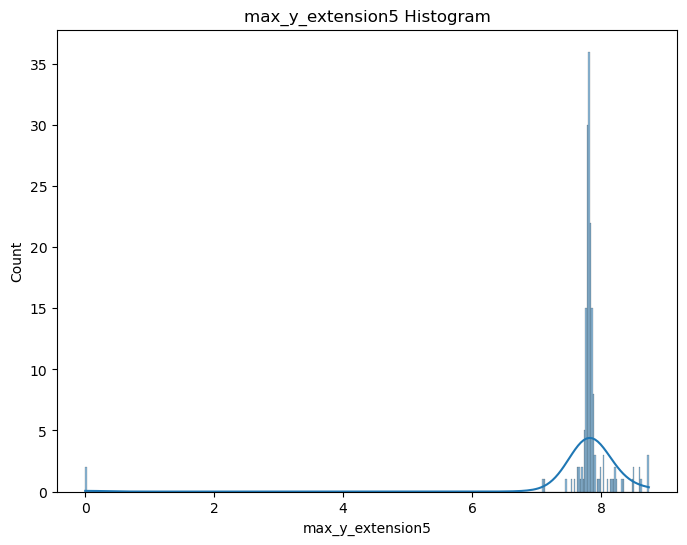

mean_gmrt5: Not normally distributed (p-value: 0.005409533623605967)


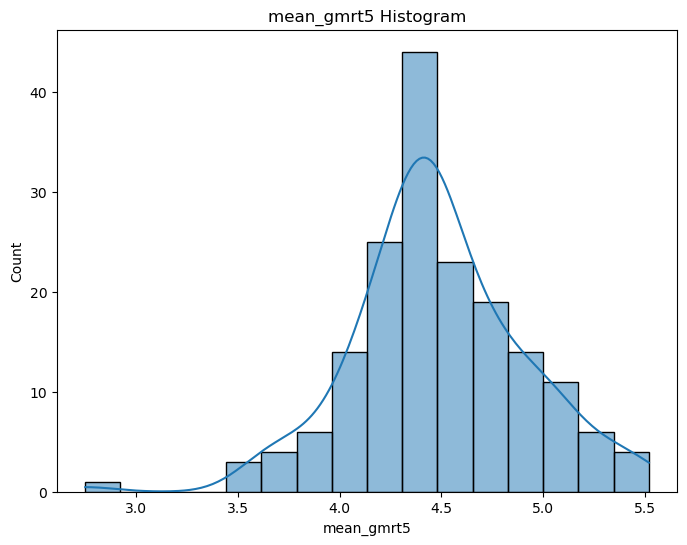

mean_speed_in_air5: Not normally distributed (p-value: 3.111996193183586e-06)


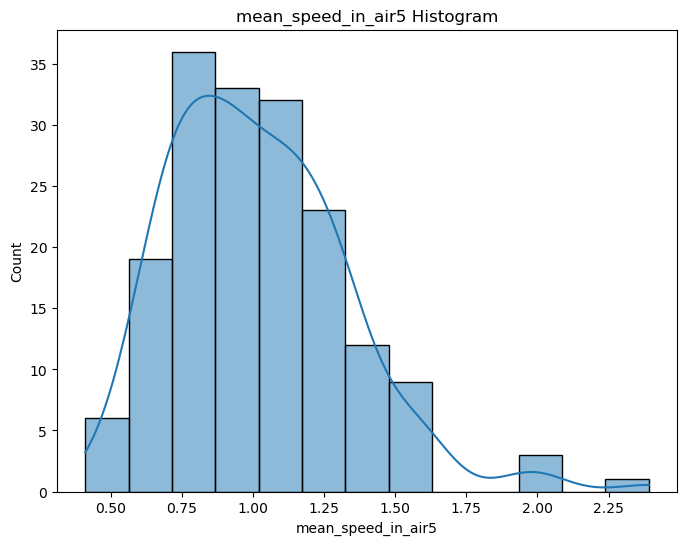

num_of_pendown5: Not normally distributed (p-value: 2.309032143005957e-15)


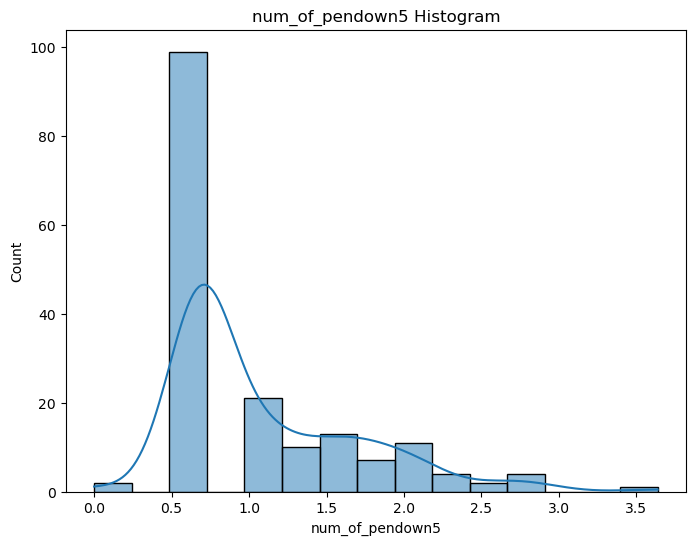

paper_time5: Not normally distributed (p-value: 1.5149965137508973e-22)


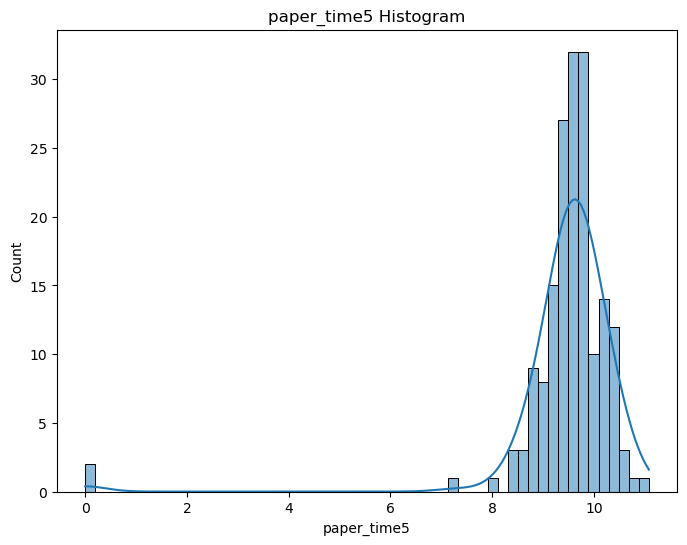

pressure_mean5: Not normally distributed (p-value: 2.0798527692515914e-27)


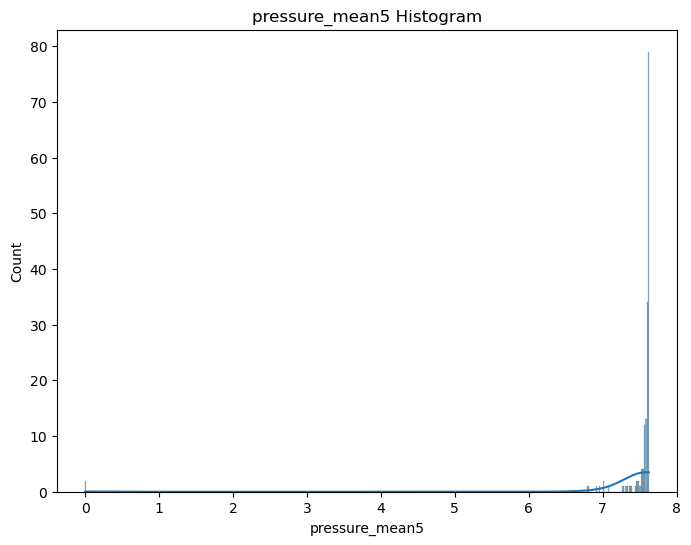

pressure_var5: Not normally distributed (p-value: 5.629228352629064e-18)


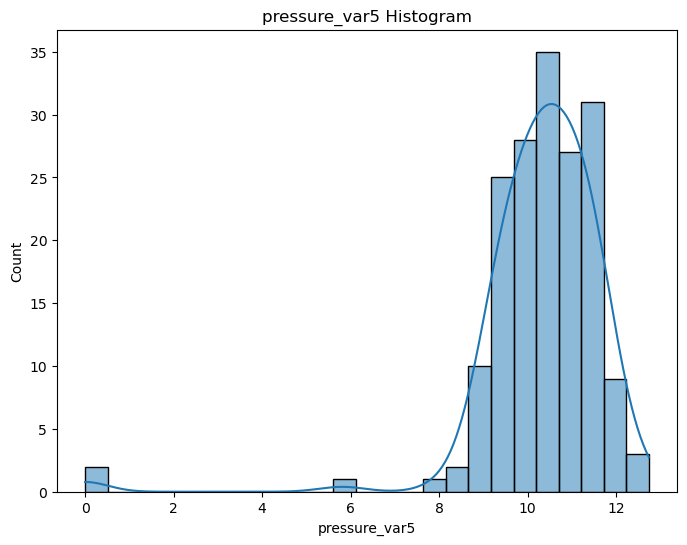

total_time5: Not normally distributed (p-value: 1.1245532283155057e-09)


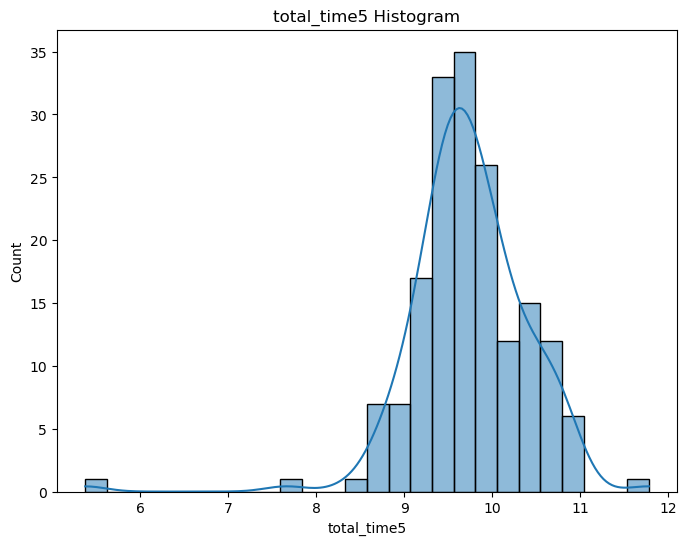

air_time6: Normally distributed (p-value: 0.05716954544186592)


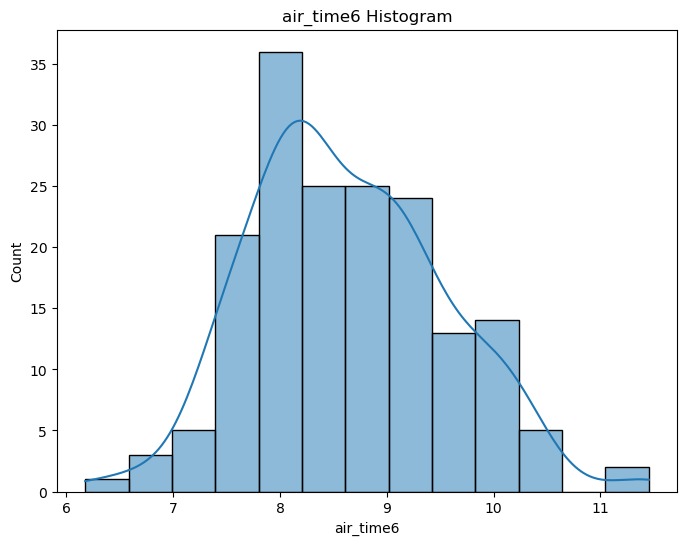

gmrt_in_air6: Normally distributed (p-value: 0.2989577651023865)


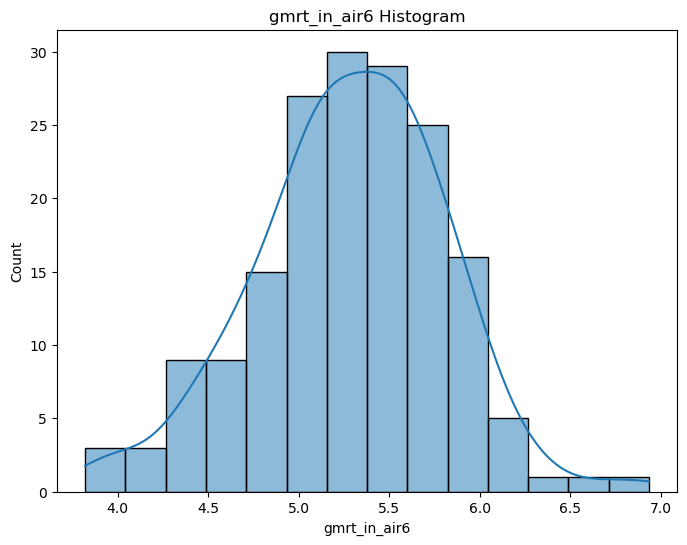

gmrt_on_paper6: Not normally distributed (p-value: 0.0005582704325206578)


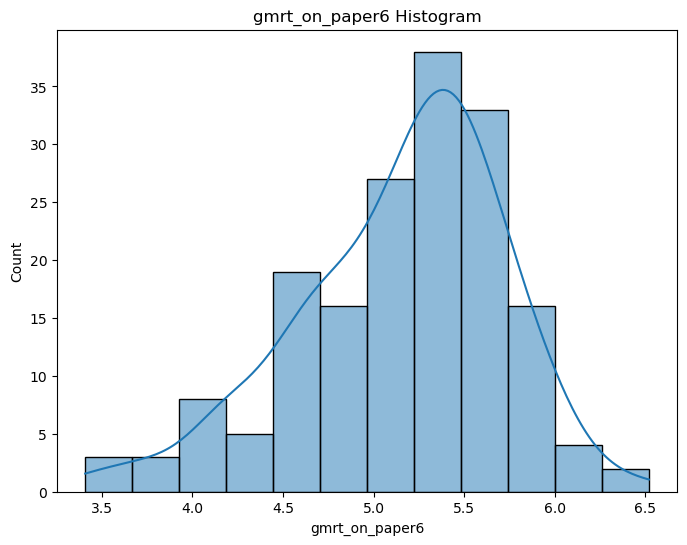

max_x_extension6: Not normally distributed (p-value: 7.611096752846436e-10)


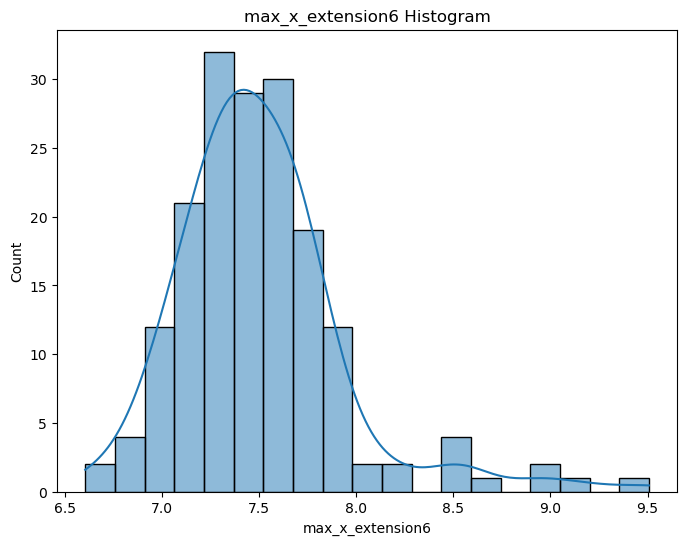

max_y_extension6: Not normally distributed (p-value: 3.0541316391463624e-06)


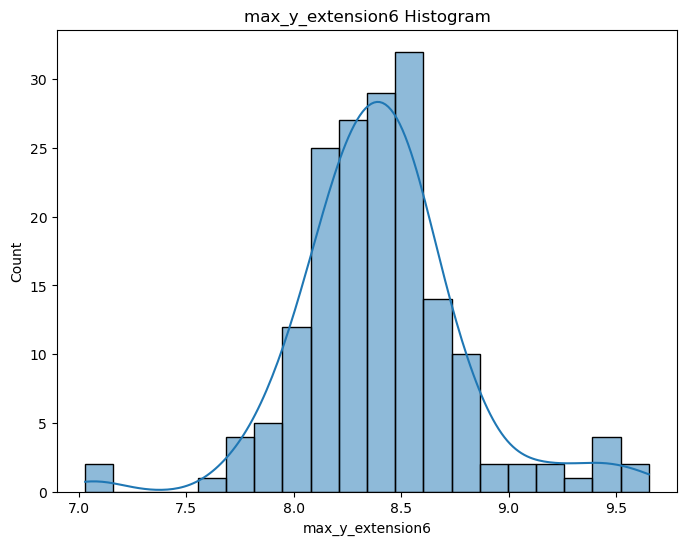

mean_acc_in_air6: Not normally distributed (p-value: 2.411651156553063e-10)


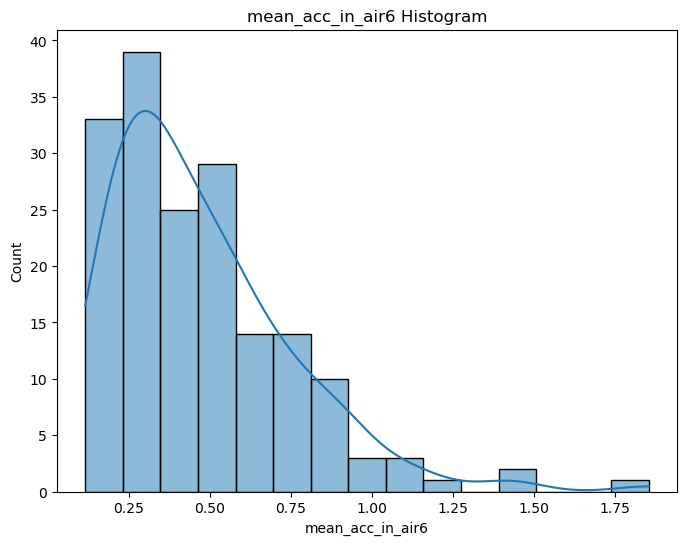

mean_gmrt6: Not normally distributed (p-value: 0.005374602973461151)


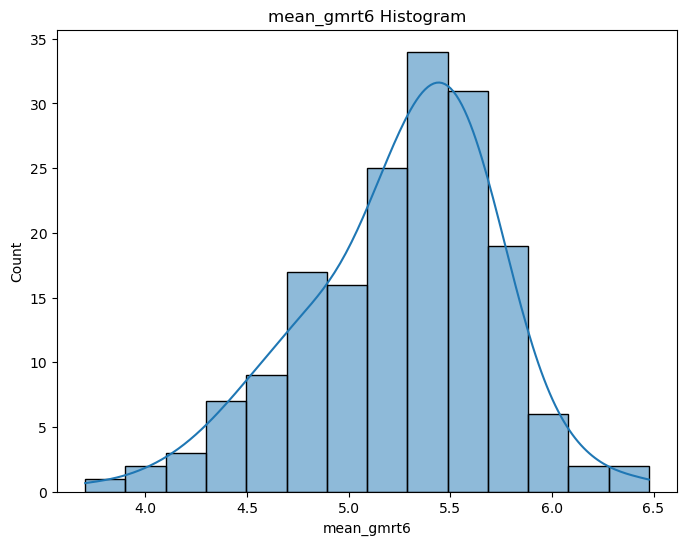

mean_speed_in_air6: Normally distributed (p-value: 0.5656395554542542)


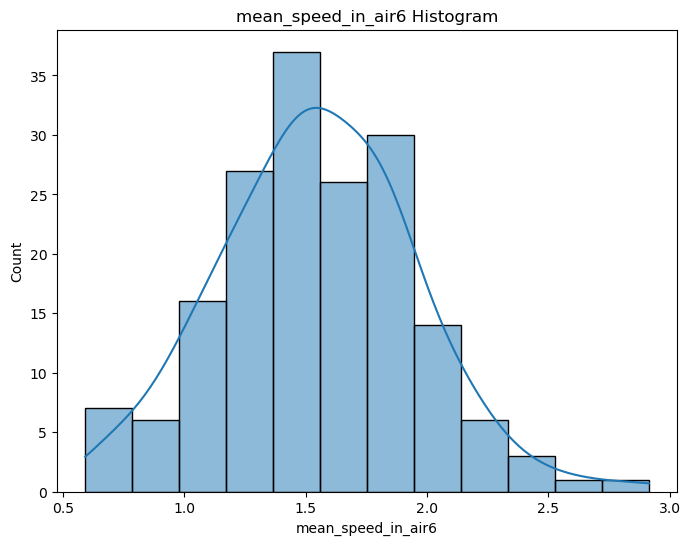

num_of_pendown6: Not normally distributed (p-value: 1.2338174926185275e-10)


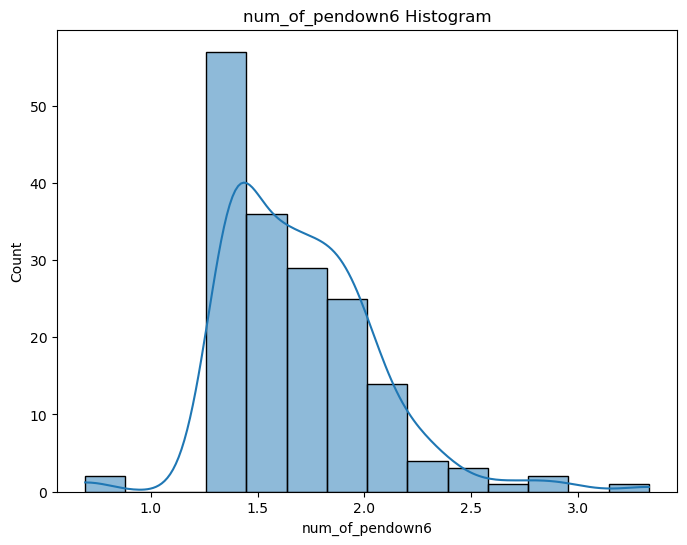

paper_time6: Not normally distributed (p-value: 4.817247045707518e-09)


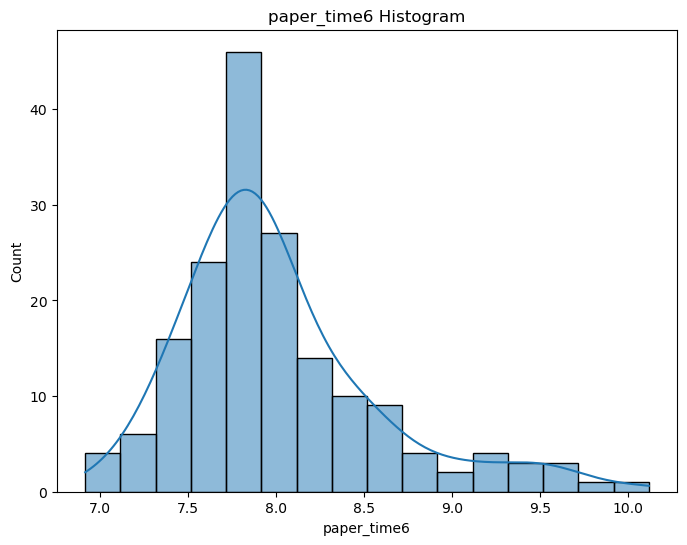

pressure_mean6: Not normally distributed (p-value: 3.192496030261224e-16)


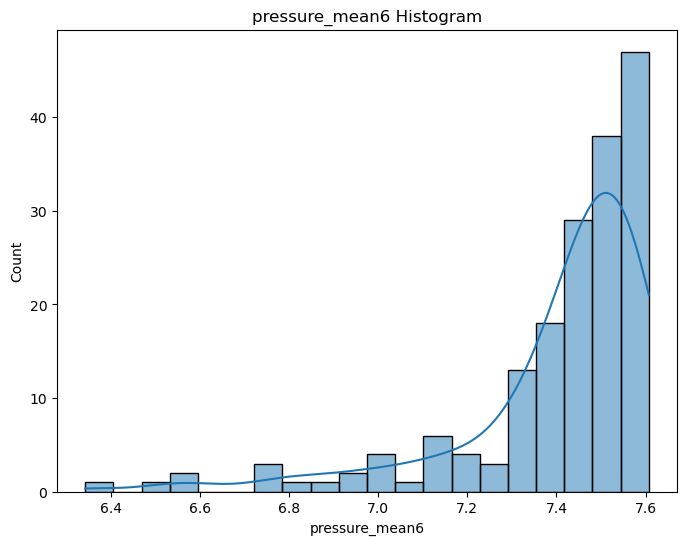

pressure_var6: Not normally distributed (p-value: 0.02279060147702694)


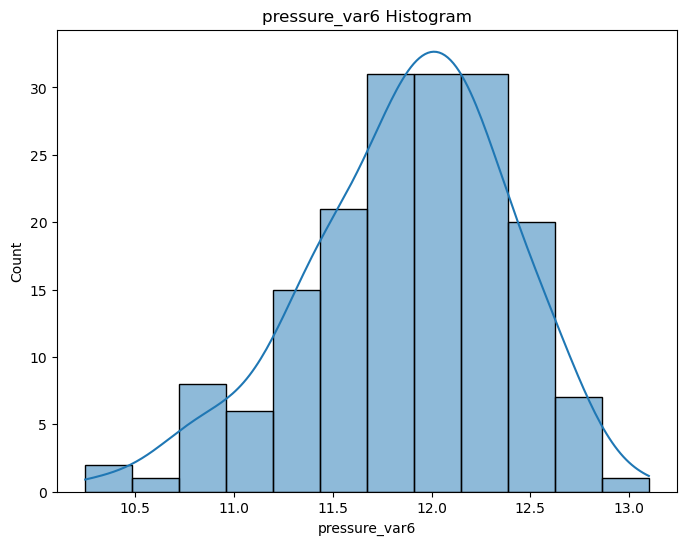

air_time7: Not normally distributed (p-value: 7.125673384678066e-10)


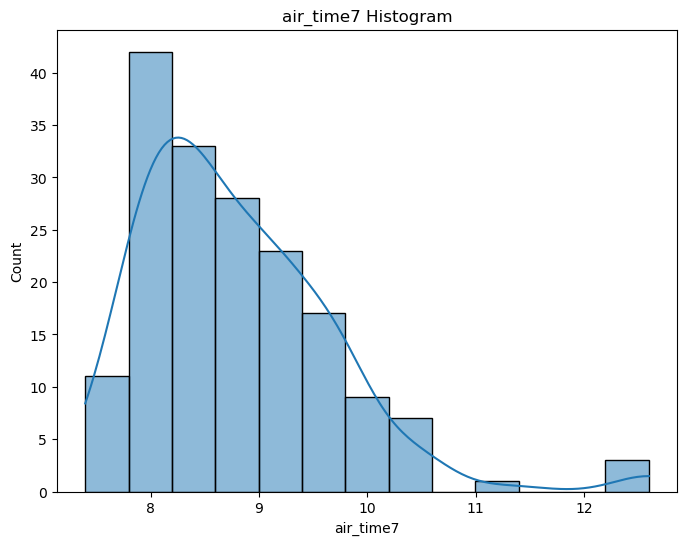

gmrt_in_air7: Normally distributed (p-value: 0.7590720057487488)


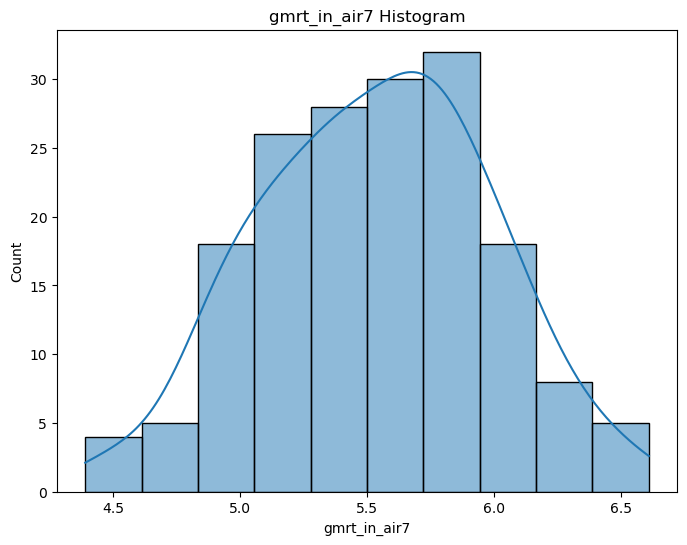

gmrt_on_paper7: Not normally distributed (p-value: 1.0008337994804606e-05)


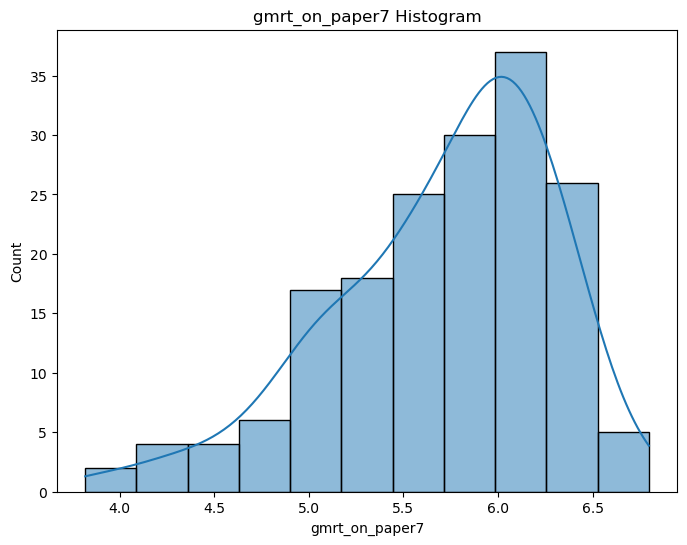

max_x_extension7: Not normally distributed (p-value: 2.1002918515478086e-07)


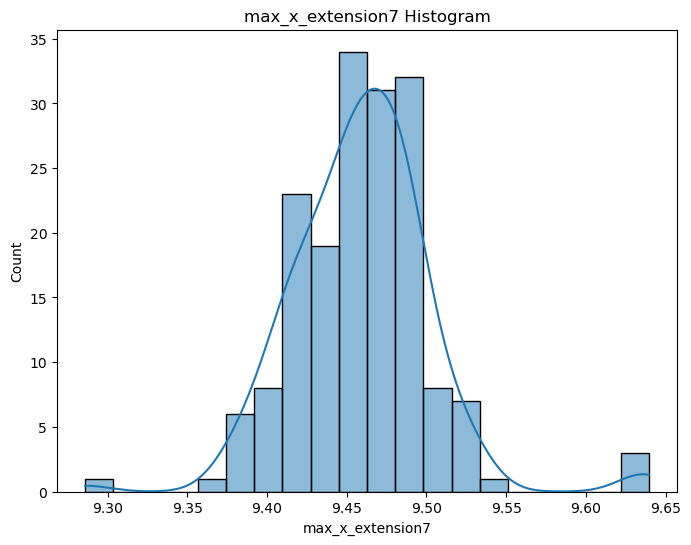

max_y_extension7: Not normally distributed (p-value: 1.1985154202420745e-08)


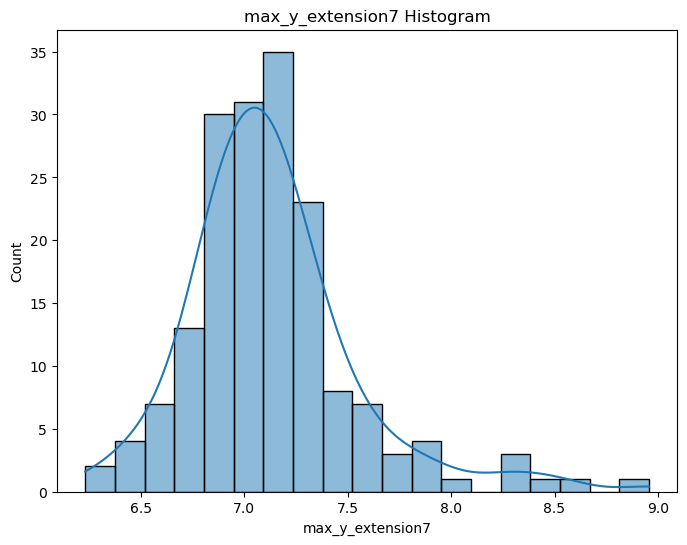

mean_acc_in_air7: Not normally distributed (p-value: 0.0018518698634579778)


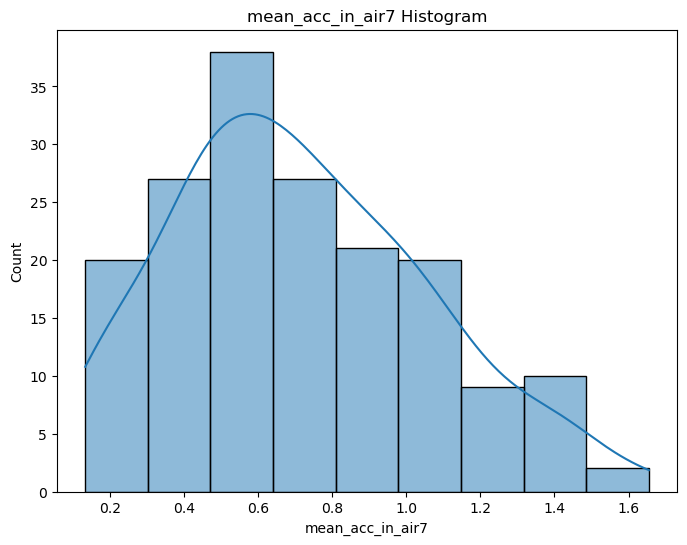

mean_gmrt7: Not normally distributed (p-value: 0.00039791627204976976)


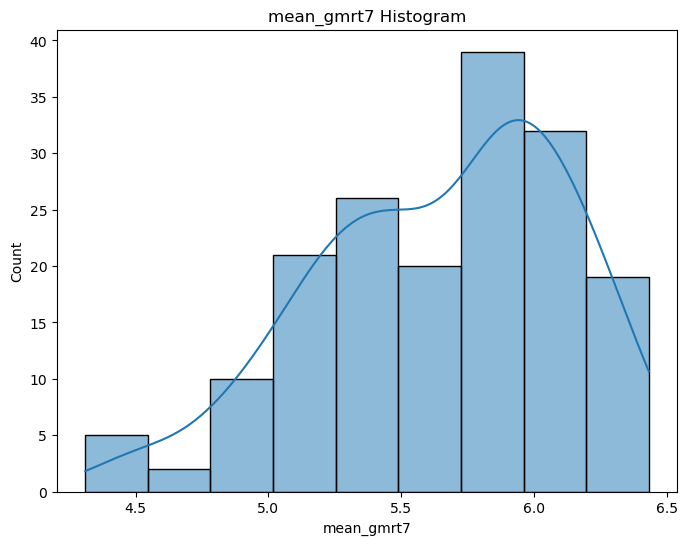

num_of_pendown7: Not normally distributed (p-value: 2.5192908452984e-18)


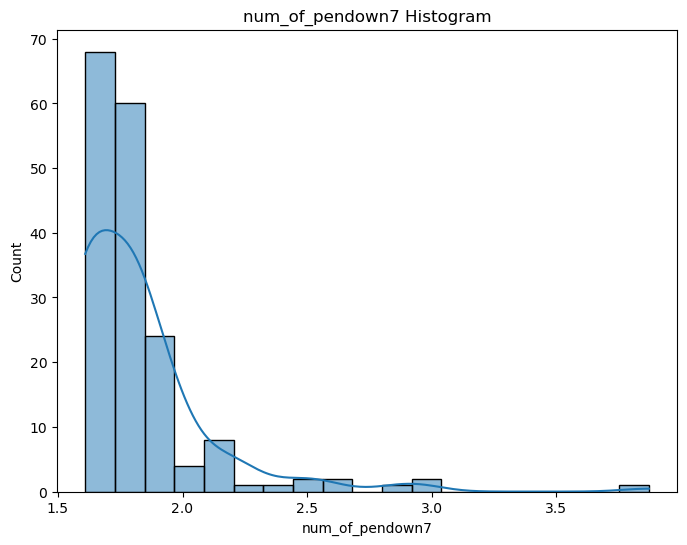

paper_time7: Not normally distributed (p-value: 1.5614590154200414e-07)


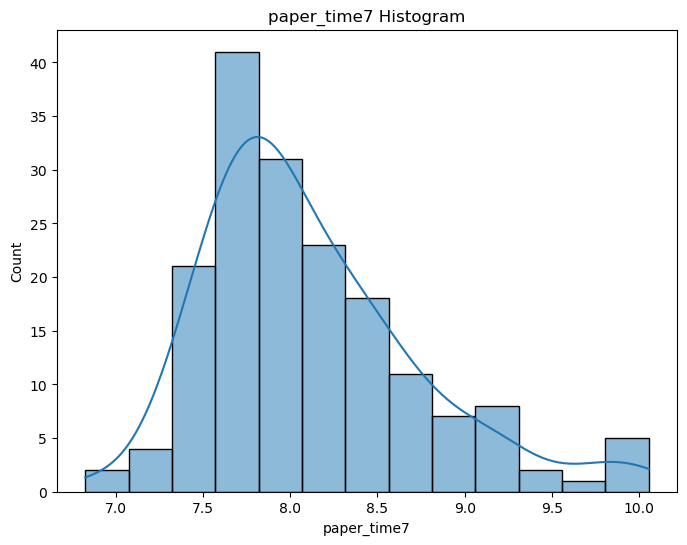

pressure_mean7: Not normally distributed (p-value: 7.065525991266236e-17)


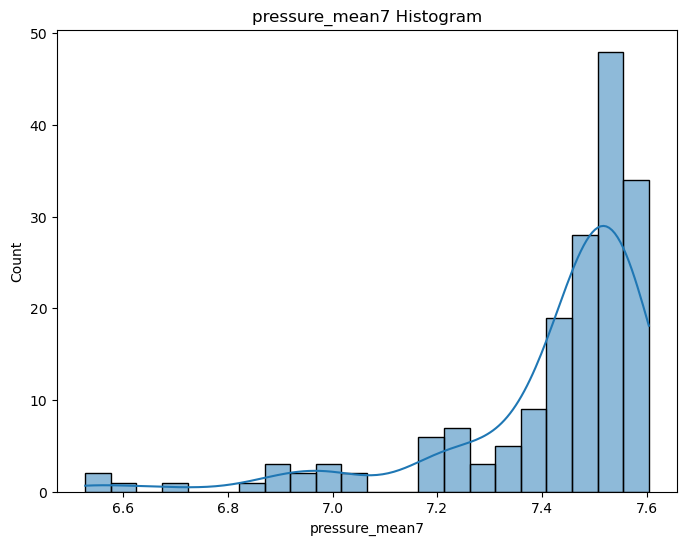

pressure_var7: Not normally distributed (p-value: 0.004014765843749046)


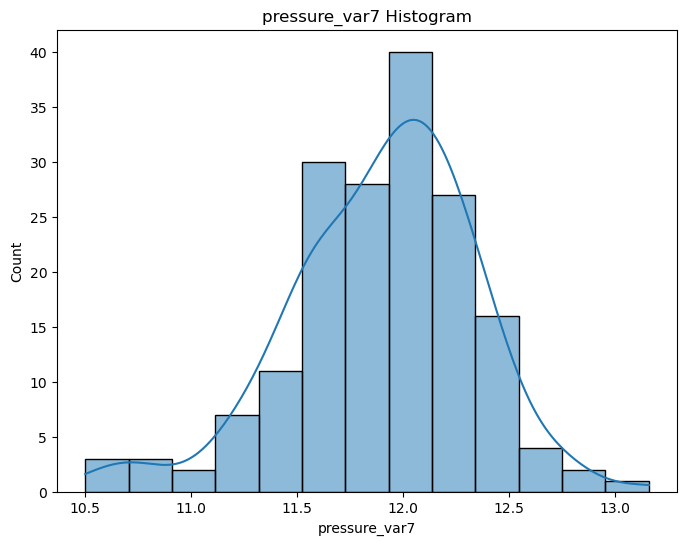

air_time8: Not normally distributed (p-value: 0.0004605647991411388)


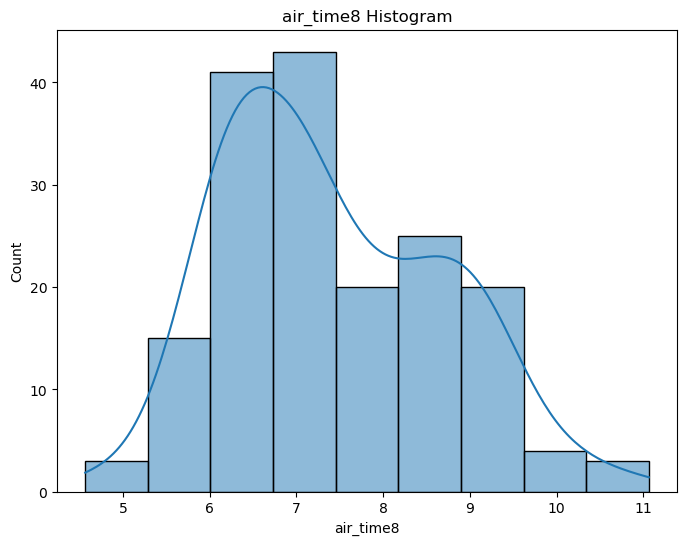

gmrt_in_air8: Normally distributed (p-value: 0.11564657837152481)


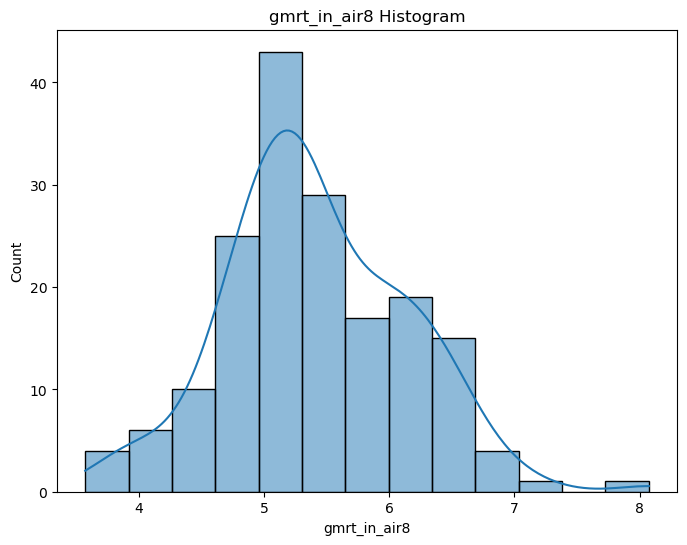

gmrt_on_paper8: Normally distributed (p-value: 0.39749547839164734)


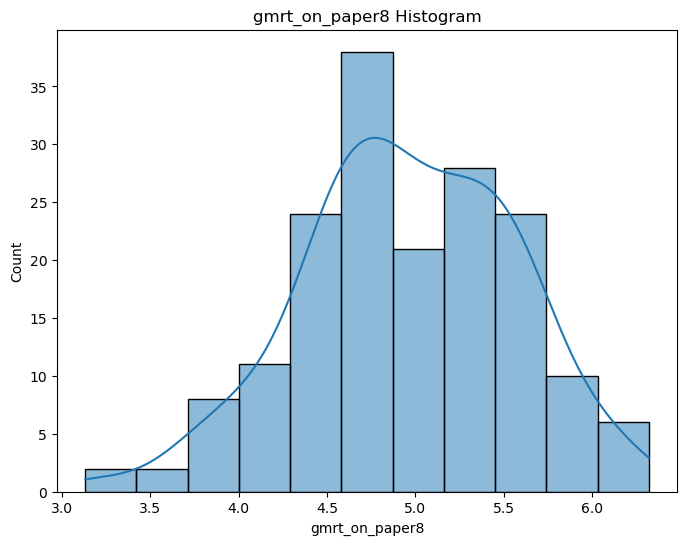

max_x_extension8: Not normally distributed (p-value: 2.696657793421764e-05)


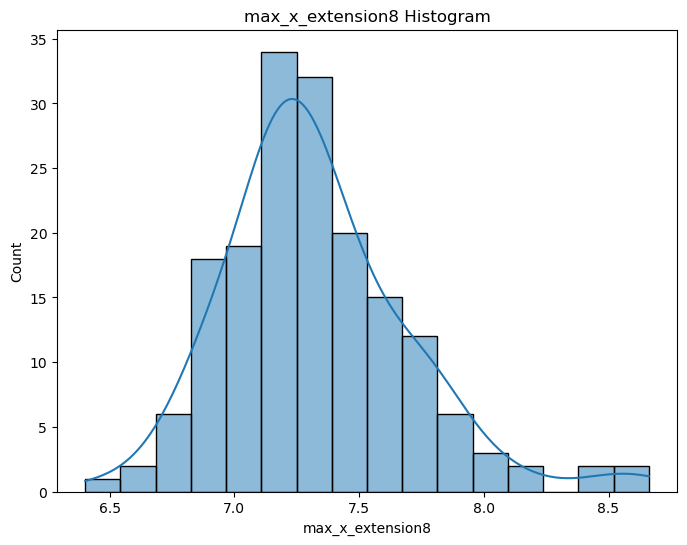

max_y_extension8: Normally distributed (p-value: 0.11824897676706314)


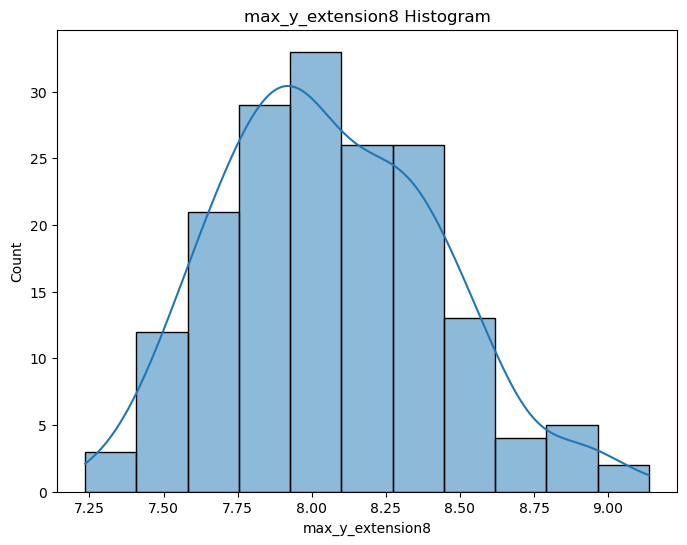

mean_acc_in_air8: Not normally distributed (p-value: 2.3084044051516674e-19)


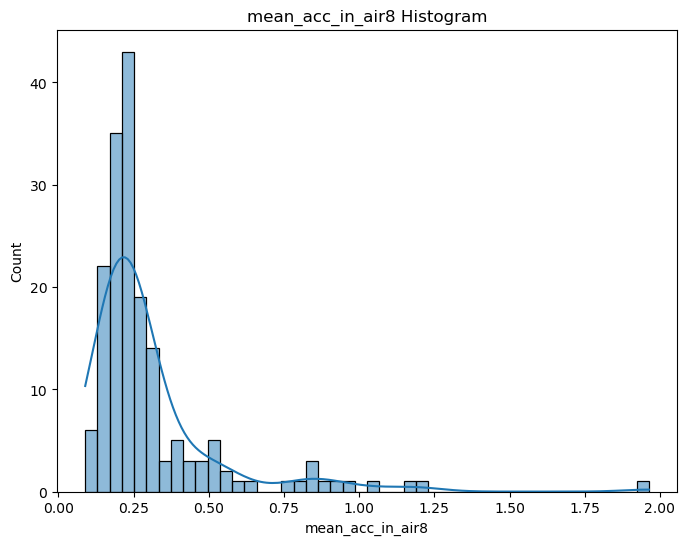

mean_speed_in_air8: Not normally distributed (p-value: 0.0010446568485349417)


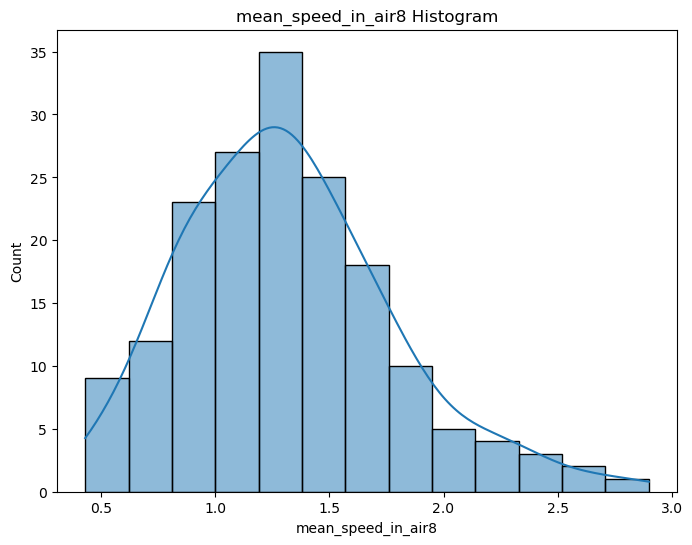

num_of_pendown8: Not normally distributed (p-value: 3.3863763049622107e-18)


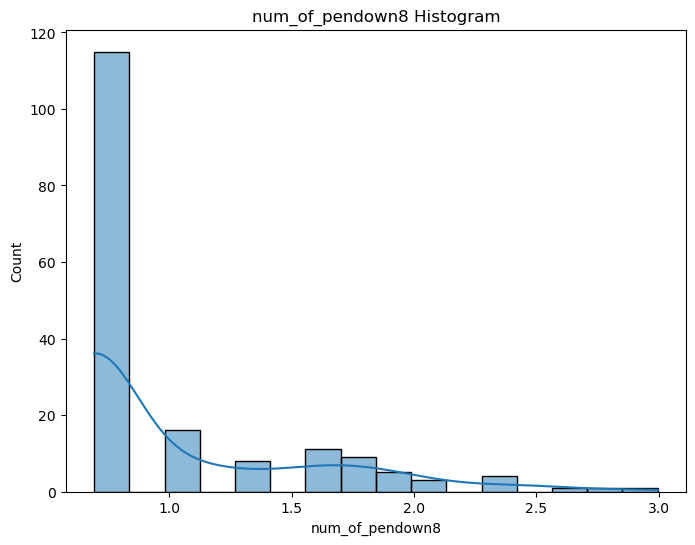

paper_time8: Not normally distributed (p-value: 2.5851744794636033e-05)


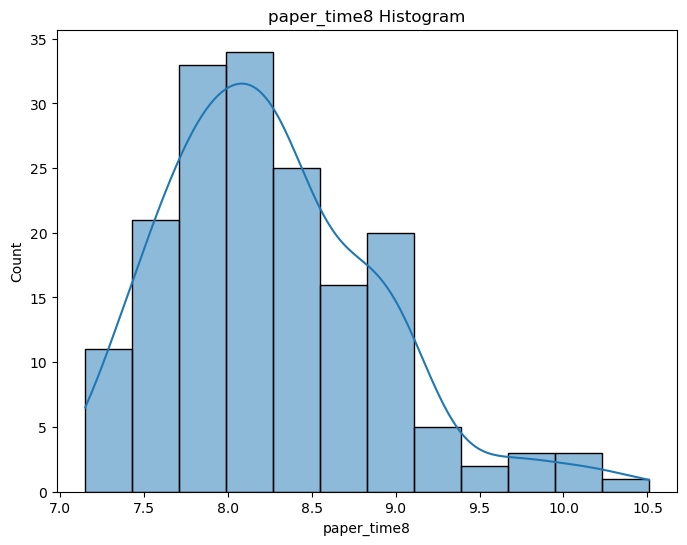

pressure_mean8: Not normally distributed (p-value: 9.912963480108454e-19)


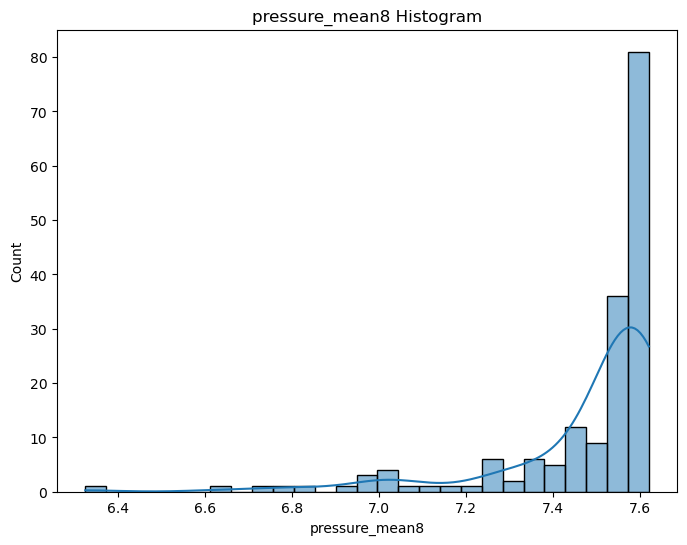

pressure_var8: Normally distributed (p-value: 0.559200644493103)


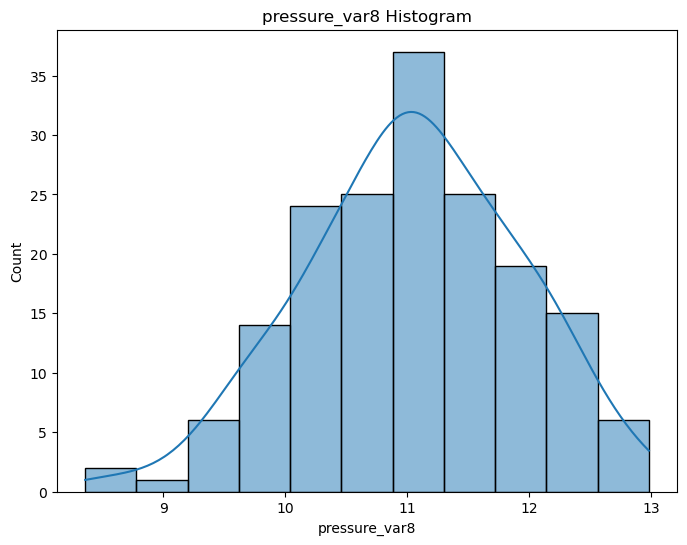

total_time8: Not normally distributed (p-value: 3.0258464903454296e-05)


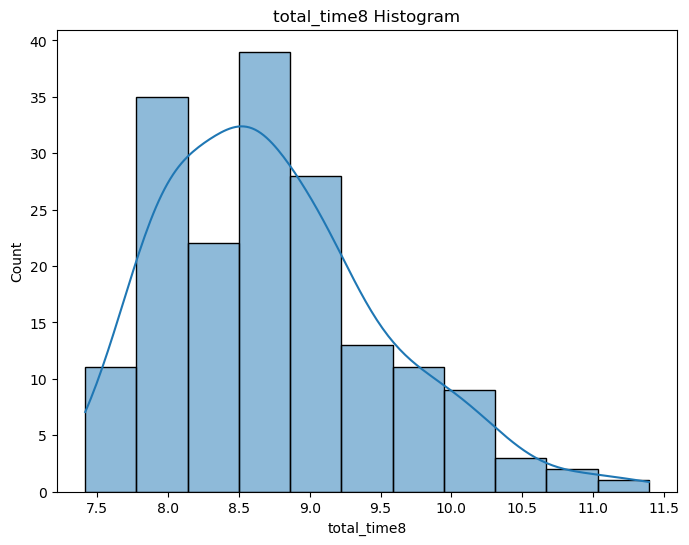

air_time9: Normally distributed (p-value: 0.08293572813272476)


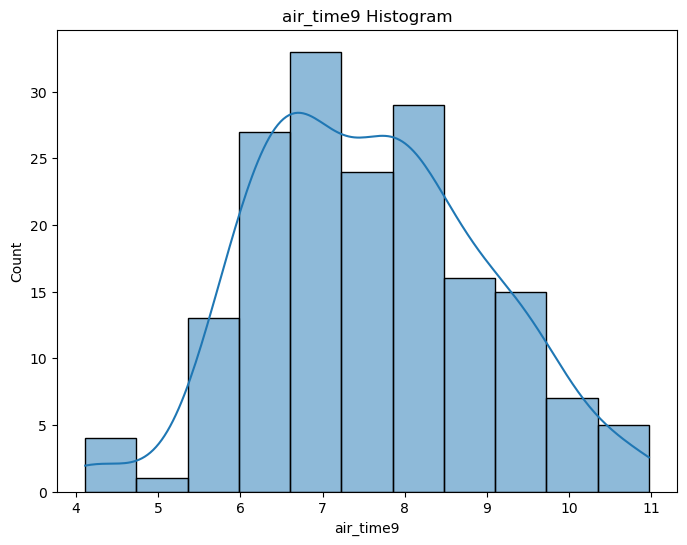

gmrt_in_air9: Normally distributed (p-value: 0.12289290130138397)


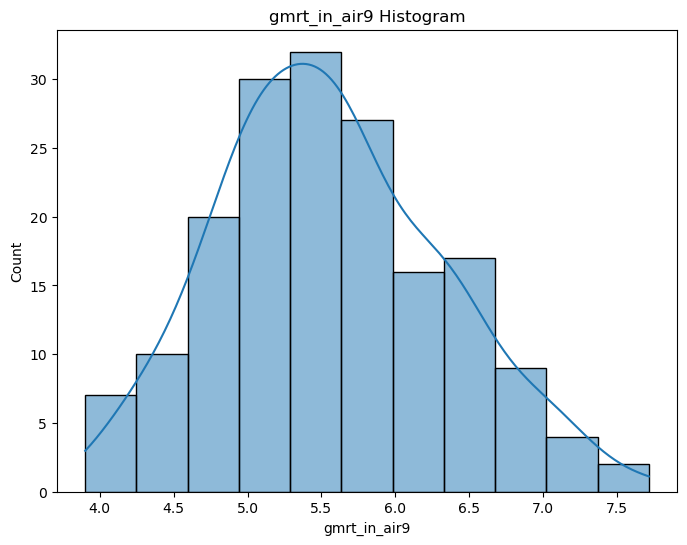

gmrt_on_paper9: Normally distributed (p-value: 0.7181360721588135)


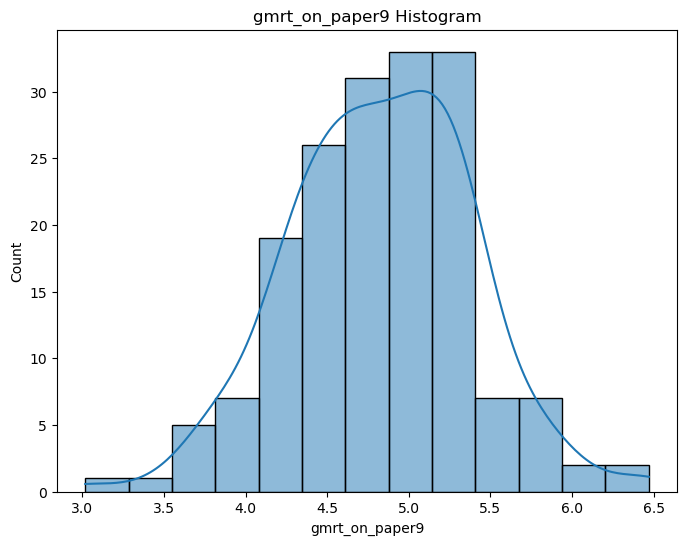

max_x_extension9: Not normally distributed (p-value: 1.245662133442238e-07)


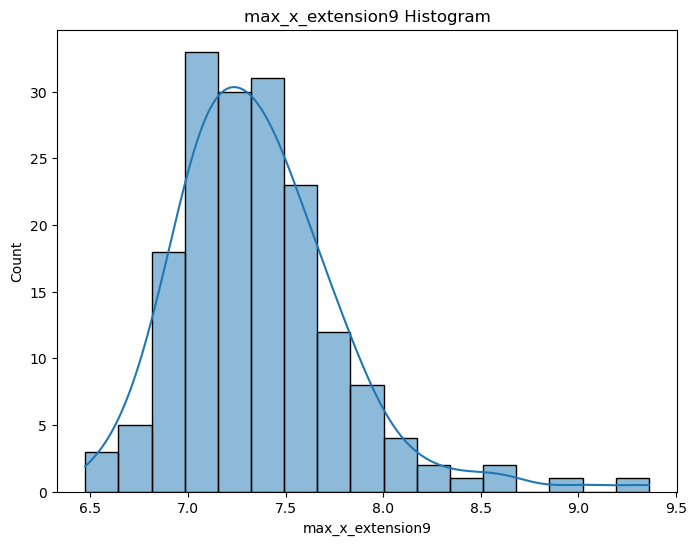

max_y_extension9: Normally distributed (p-value: 0.09793242812156677)


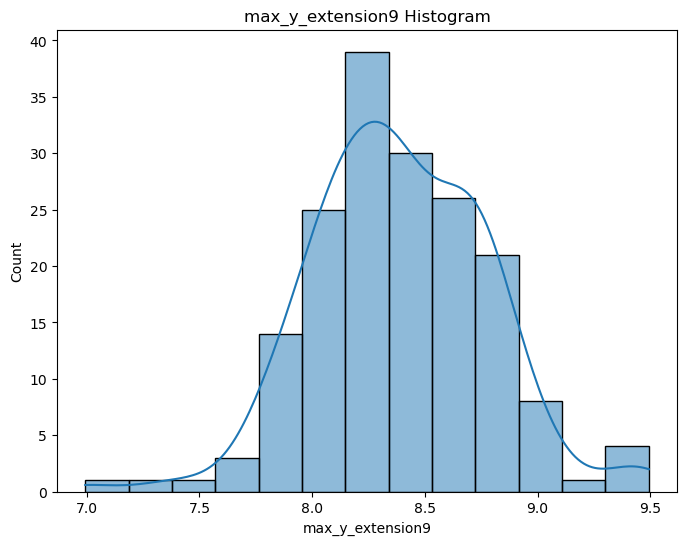

mean_acc_in_air9: Not normally distributed (p-value: 3.8979495669156574e-19)


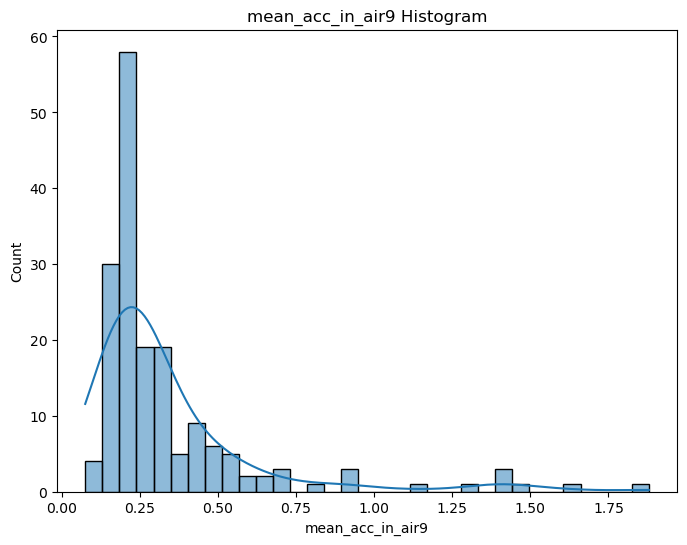

mean_speed_in_air9: Not normally distributed (p-value: 1.678958687989507e-05)


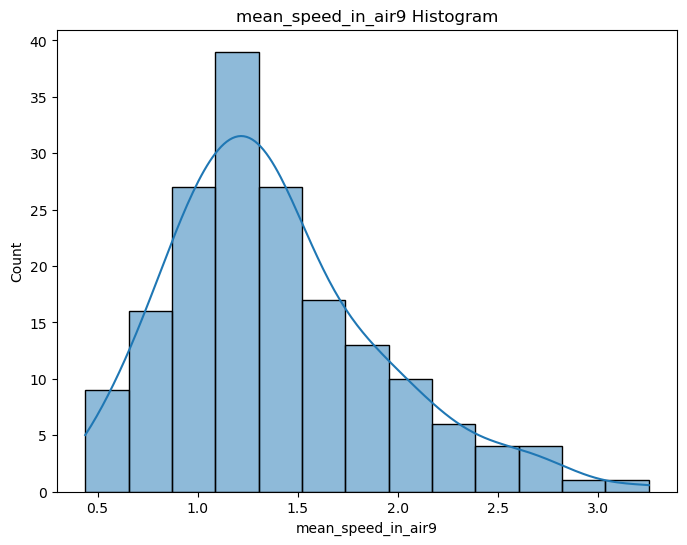

num_of_pendown9: Not normally distributed (p-value: 4.41466414680537e-15)


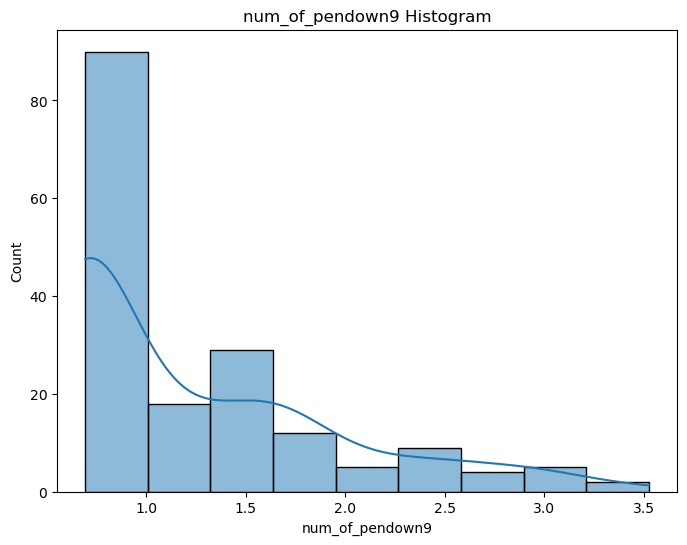

paper_time9: Not normally distributed (p-value: 0.01666390523314476)


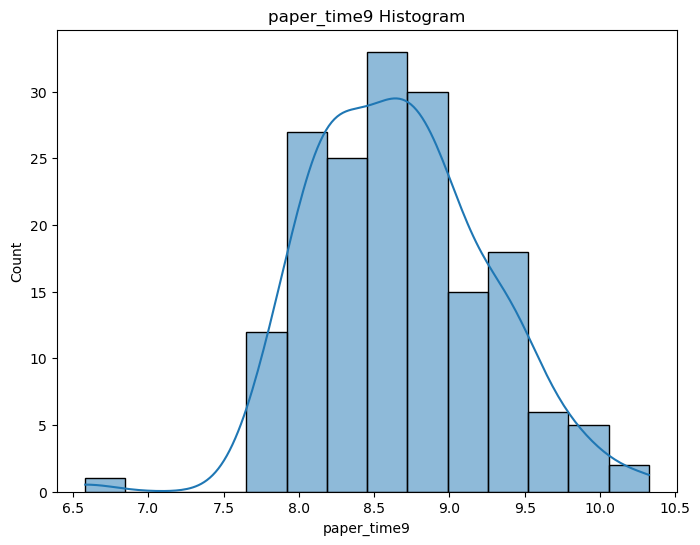

pressure_mean9: Not normally distributed (p-value: 2.7927519995199086e-19)


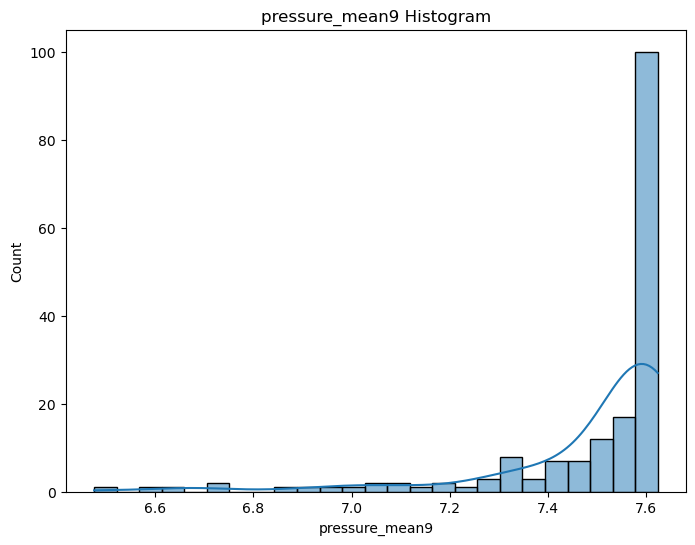

pressure_var9: Not normally distributed (p-value: 0.004460291936993599)


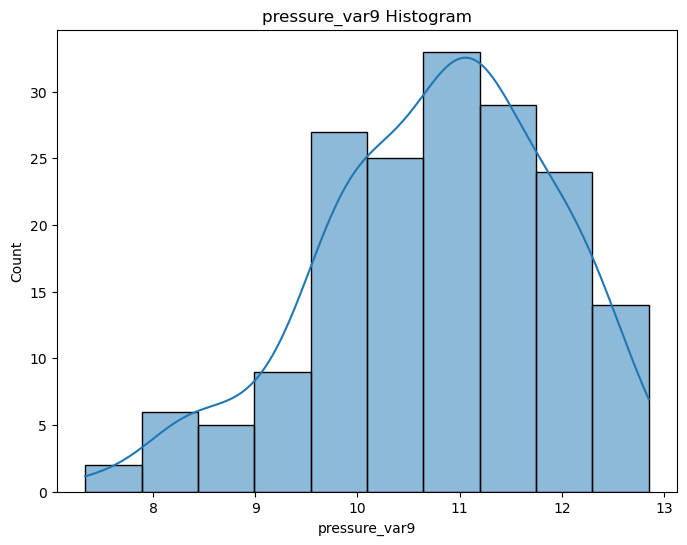

total_time9: Not normally distributed (p-value: 0.00012160659389337525)


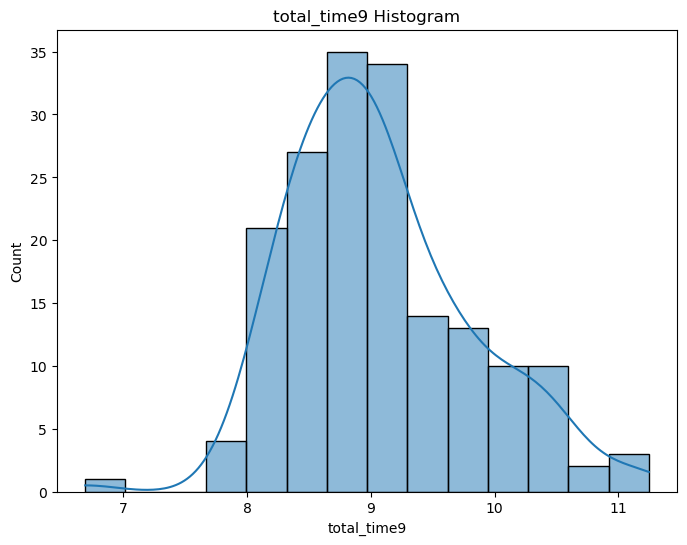

air_time10: Not normally distributed (p-value: 0.0012427459005266428)


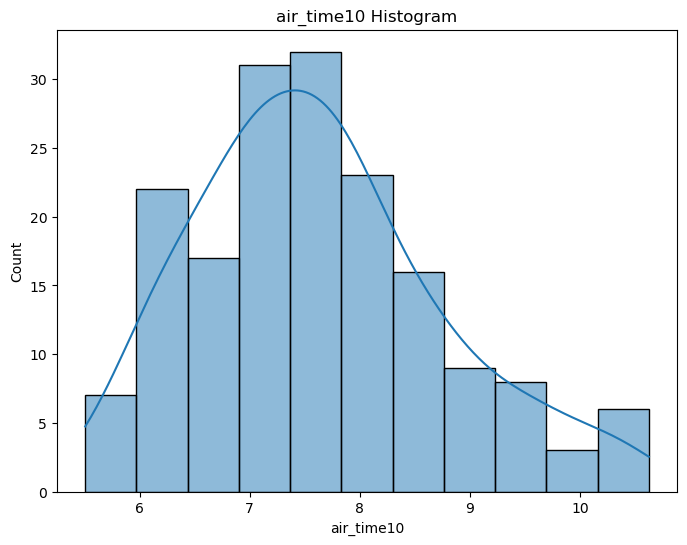

gmrt_in_air10: Normally distributed (p-value: 0.4081997871398926)


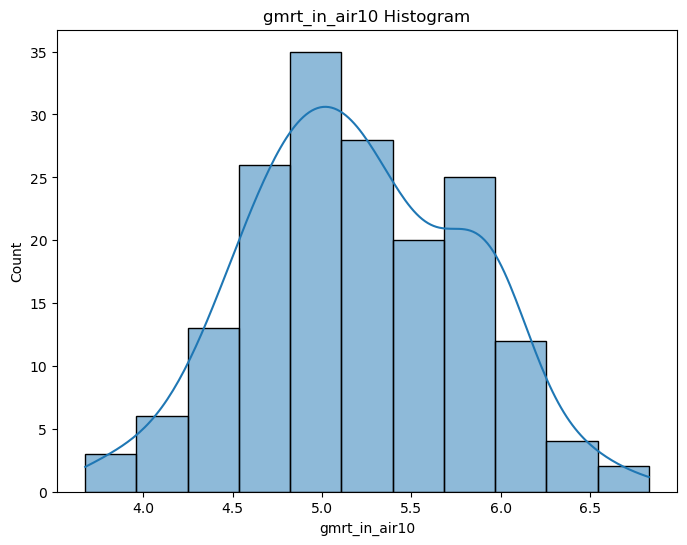

gmrt_on_paper10: Not normally distributed (p-value: 0.0023462981916964054)


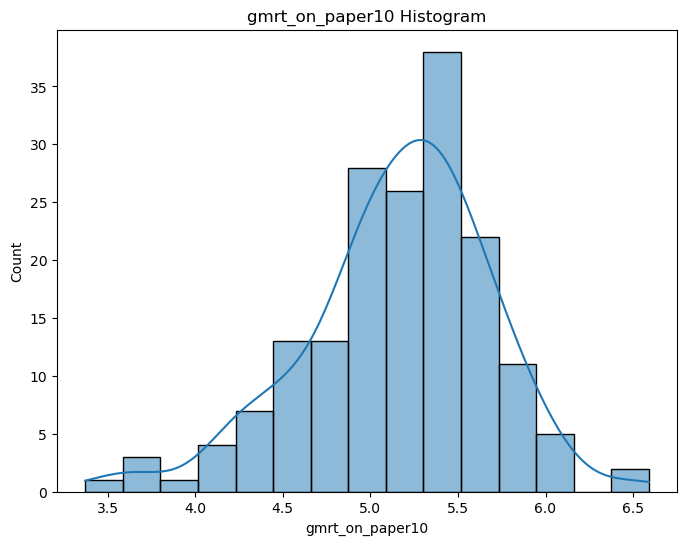

max_x_extension10: Not normally distributed (p-value: 1.2938346571900183e-06)


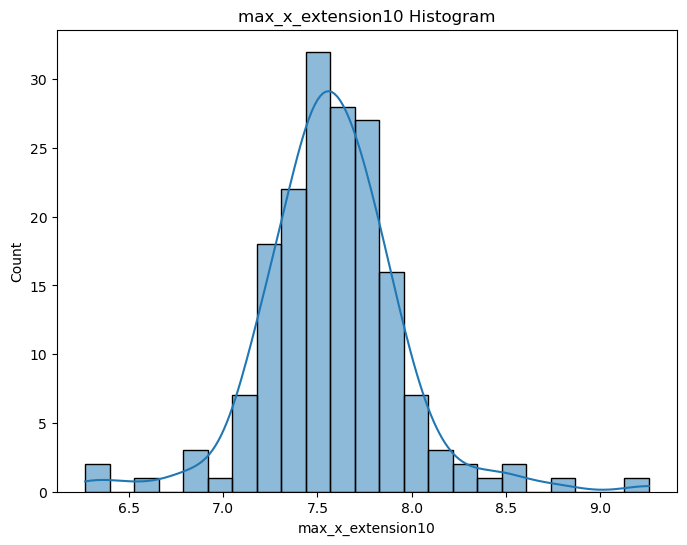

max_y_extension10: Not normally distributed (p-value: 0.010952007956802845)


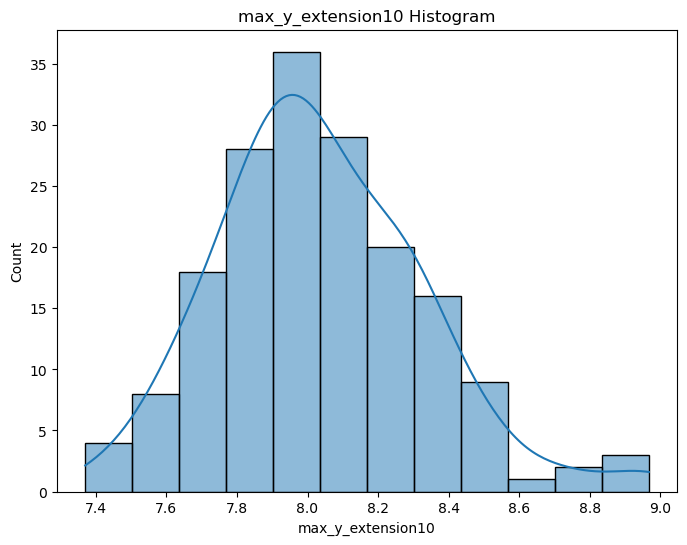

mean_gmrt10: Normally distributed (p-value: 0.415311336517334)


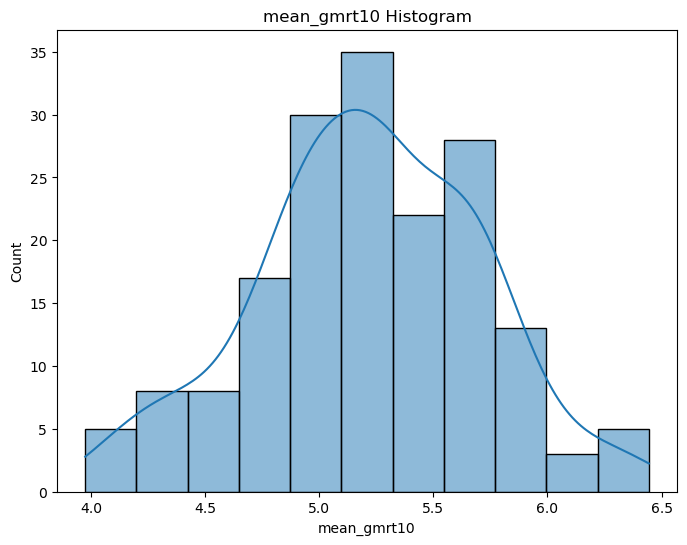

mean_speed_in_air10: Not normally distributed (p-value: 0.0031196135096251965)


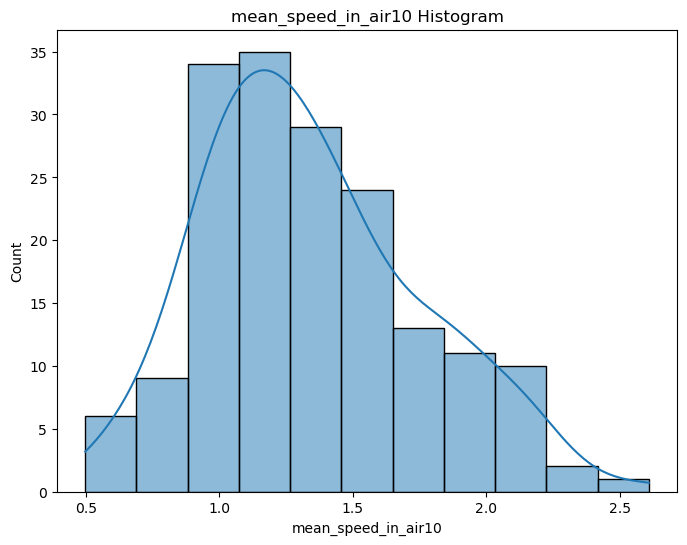

num_of_pendown10: Not normally distributed (p-value: 0.0008265133947134018)


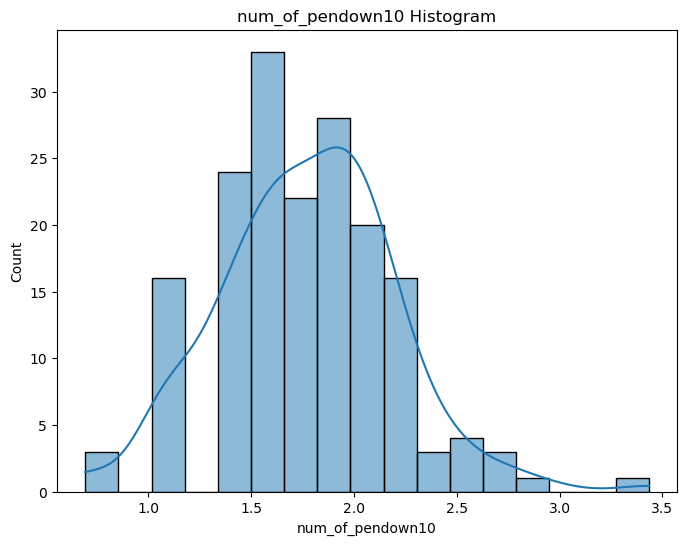

paper_time10: Not normally distributed (p-value: 3.2114504389113563e-09)


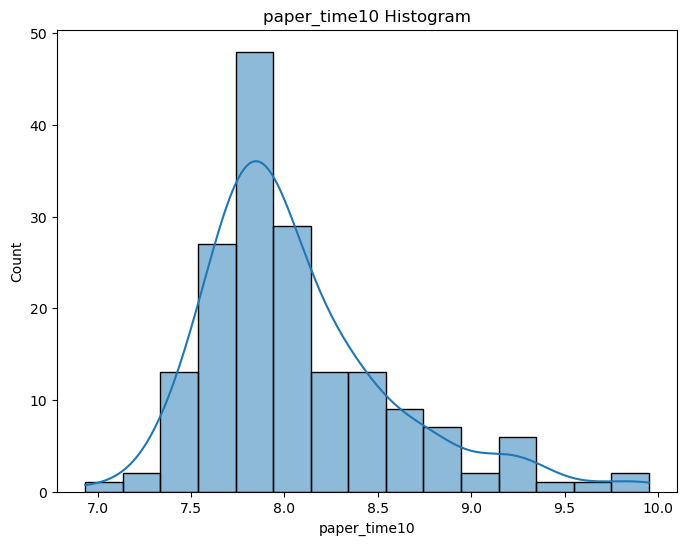

pressure_mean10: Not normally distributed (p-value: 4.773890925615038e-16)


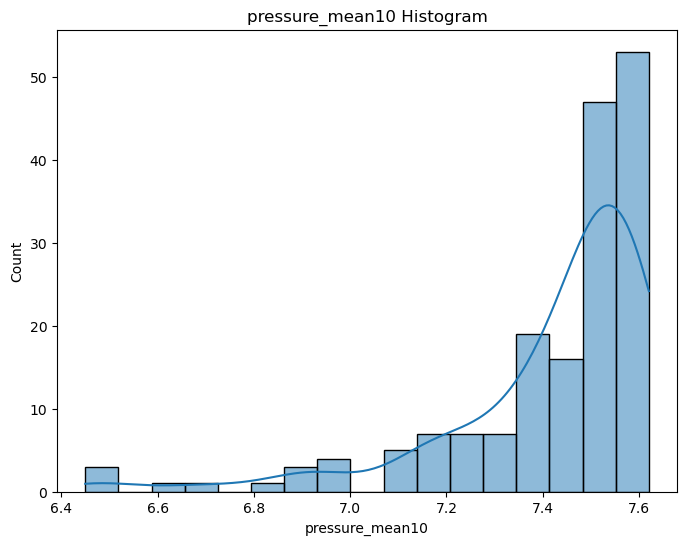

pressure_var10: Not normally distributed (p-value: 4.906136837234953e-06)


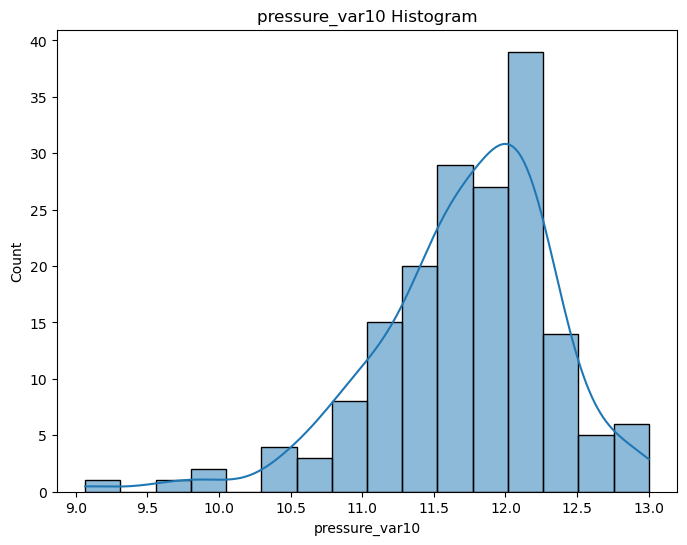

air_time11: Not normally distributed (p-value: 2.9945611004222883e-06)


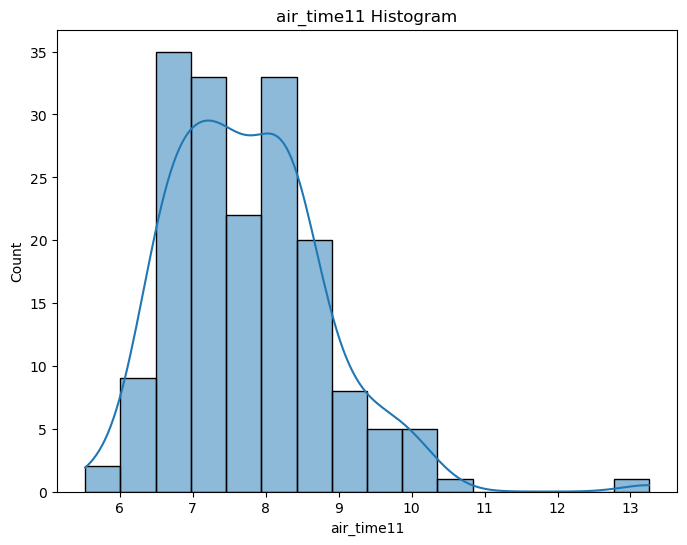

gmrt_in_air11: Normally distributed (p-value: 0.49564066529273987)


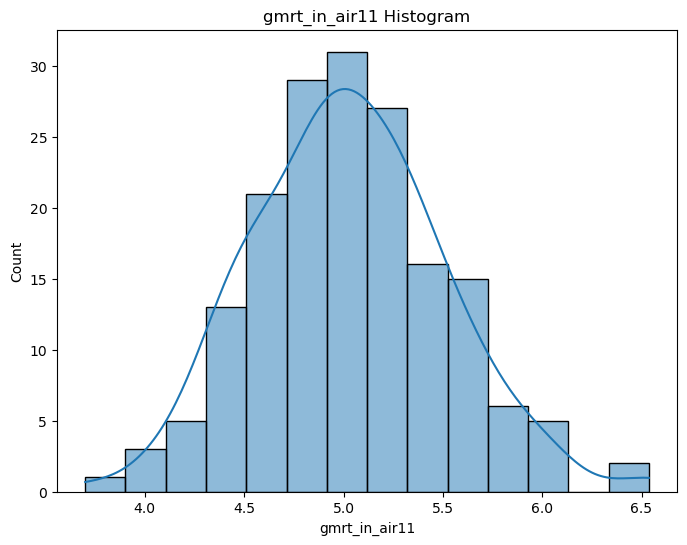

gmrt_on_paper11: Not normally distributed (p-value: 1.0113697499036789e-05)


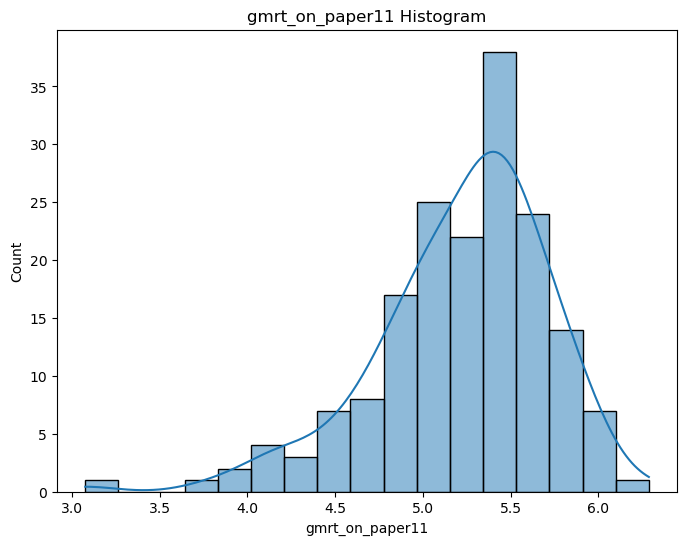

max_x_extension11: Not normally distributed (p-value: 2.2549218670064874e-07)


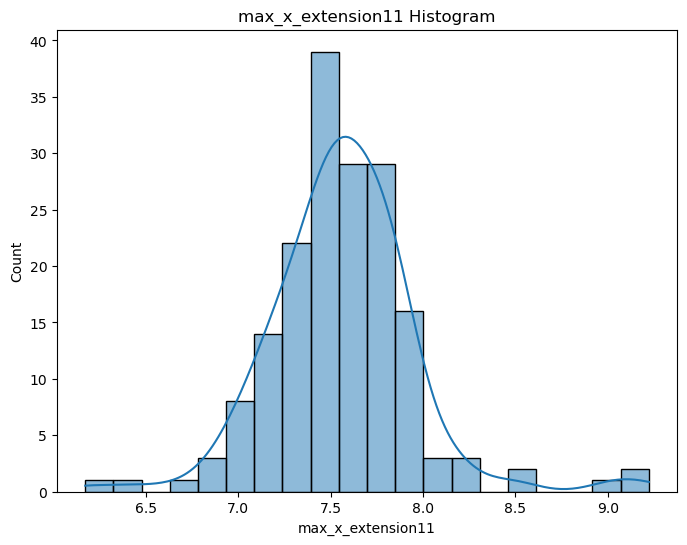

max_y_extension11: Not normally distributed (p-value: 4.3141881733710363e-10)


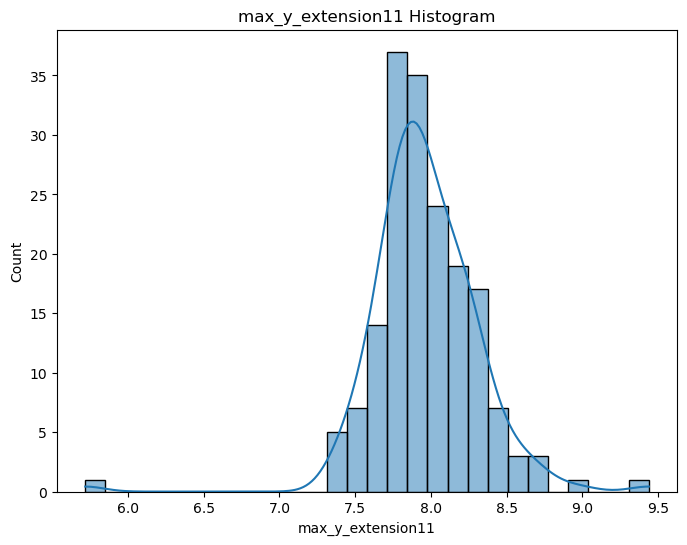

mean_gmrt11: Normally distributed (p-value: 0.09973996132612228)


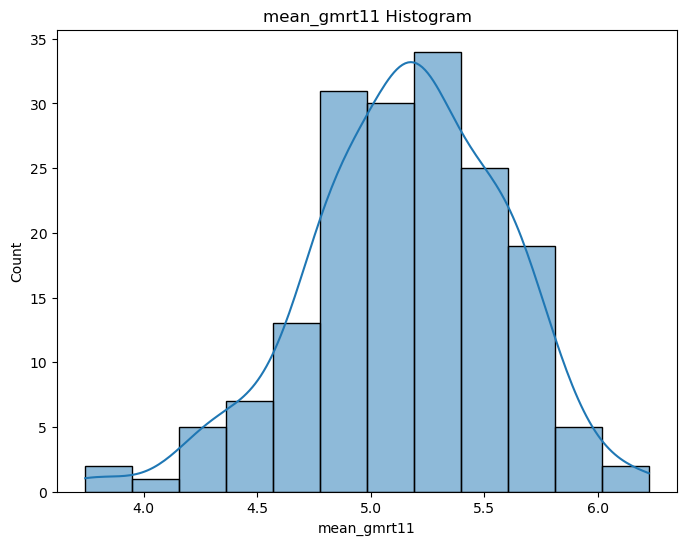

mean_speed_in_air11: Not normally distributed (p-value: 0.0029531000182032585)


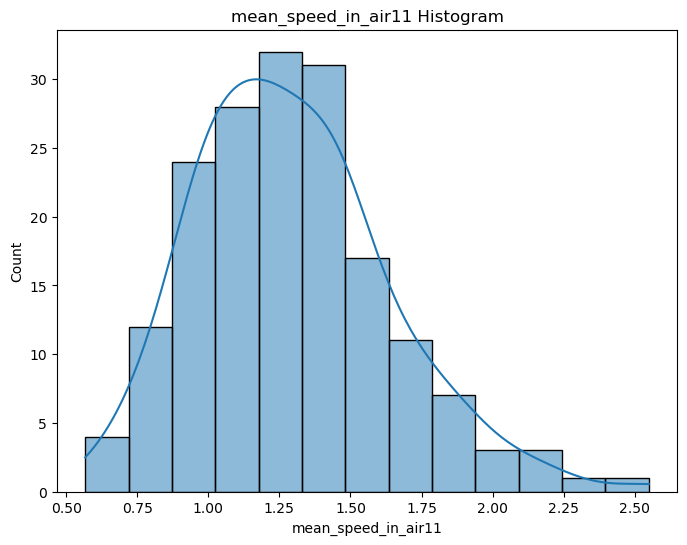

num_of_pendown11: Not normally distributed (p-value: 0.00036150170490145683)


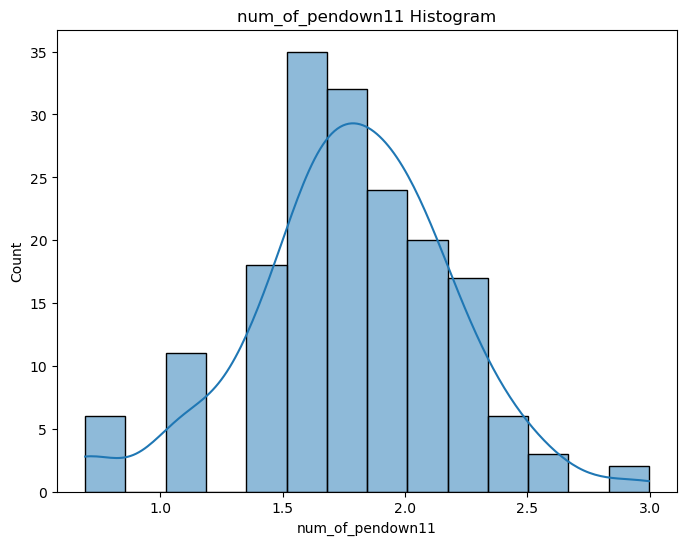

paper_time11: Not normally distributed (p-value: 1.4750264121232703e-08)


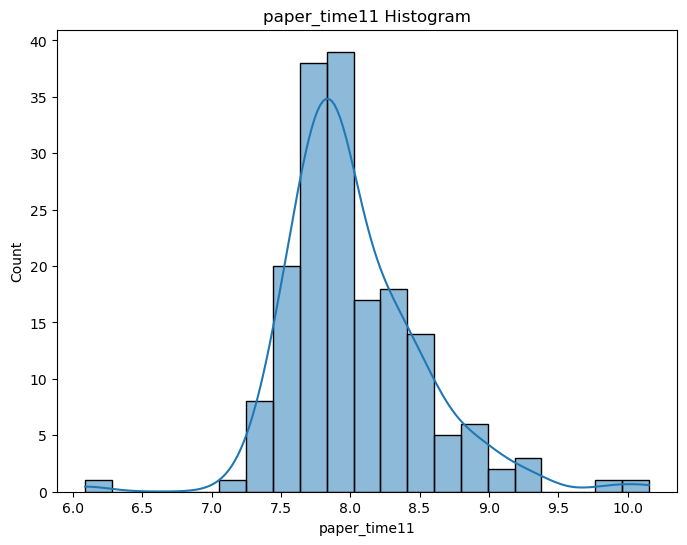

pressure_mean11: Not normally distributed (p-value: 1.8905299753863766e-18)


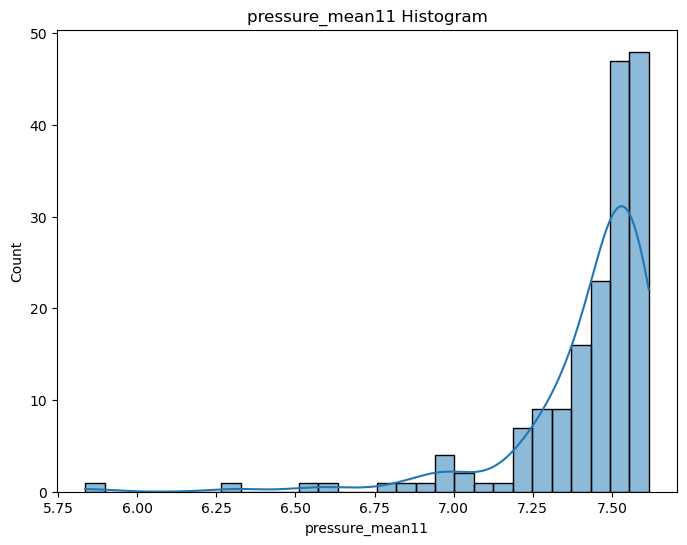

pressure_var11: Not normally distributed (p-value: 1.2389920200917004e-09)


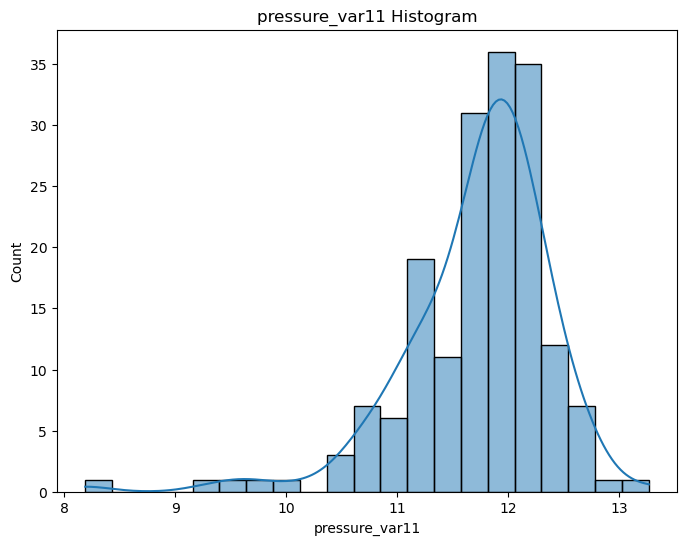

air_time12: Not normally distributed (p-value: 2.626629047597362e-08)


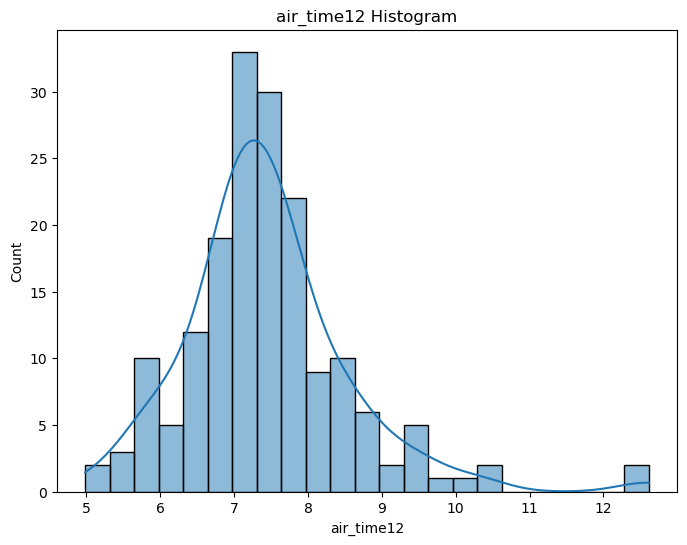

gmrt_in_air12: Not normally distributed (p-value: 0.005422566551715136)


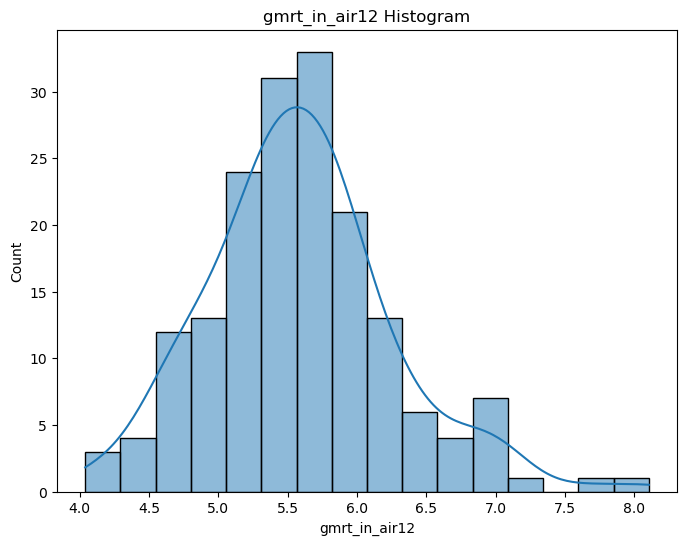

gmrt_on_paper12: Not normally distributed (p-value: 3.9343498077493155e-12)


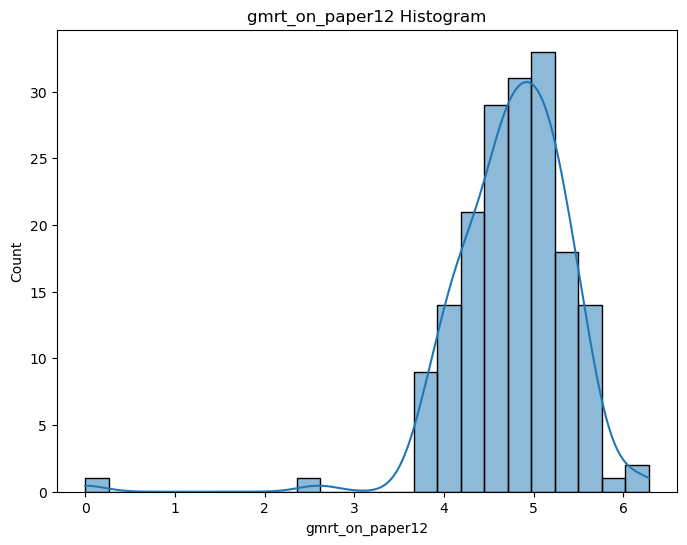

max_x_extension12: Not normally distributed (p-value: 2.4595284936075156e-19)


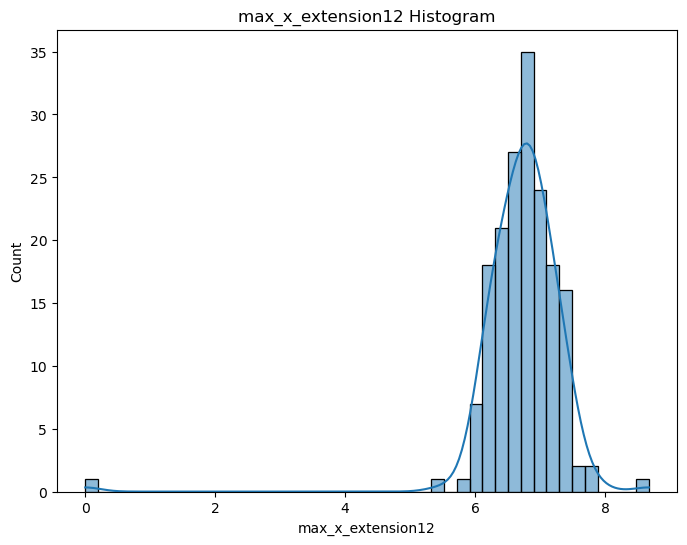

max_y_extension12: Not normally distributed (p-value: 4.454006884060533e-24)


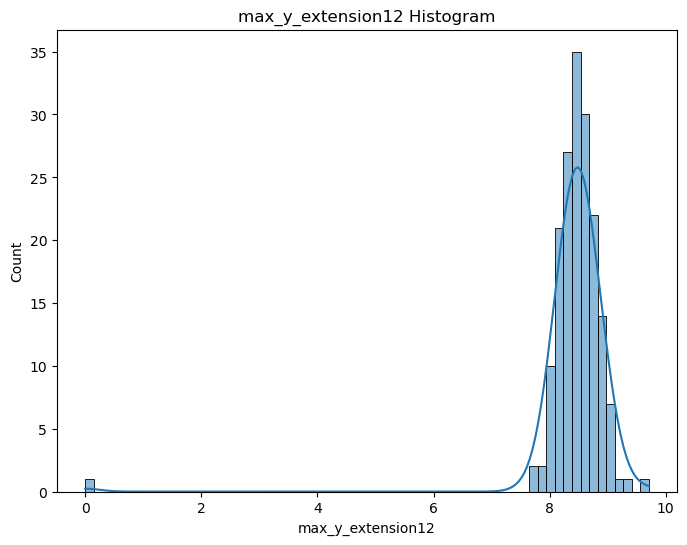

mean_speed_in_air12: Not normally distributed (p-value: 0.007097810506820679)


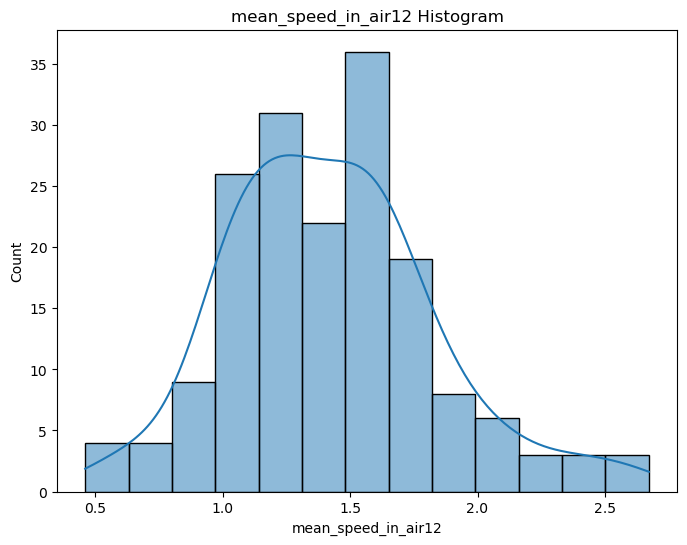

num_of_pendown12: Not normally distributed (p-value: 1.9027505913982168e-05)


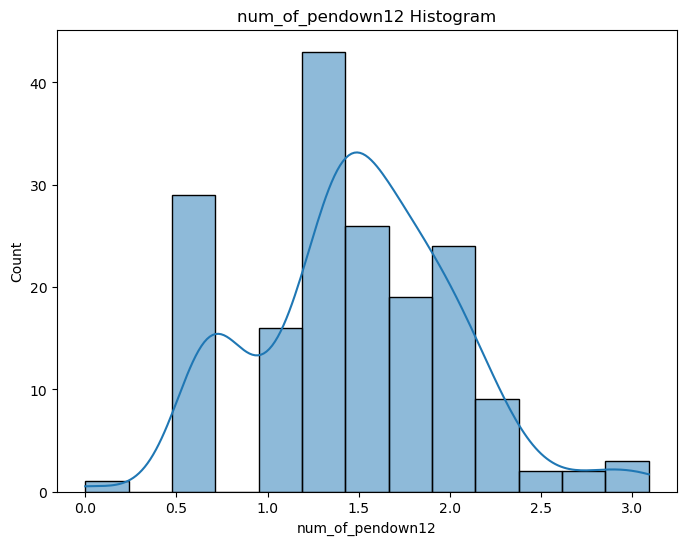

paper_time12: Not normally distributed (p-value: 3.118828357978288e-21)


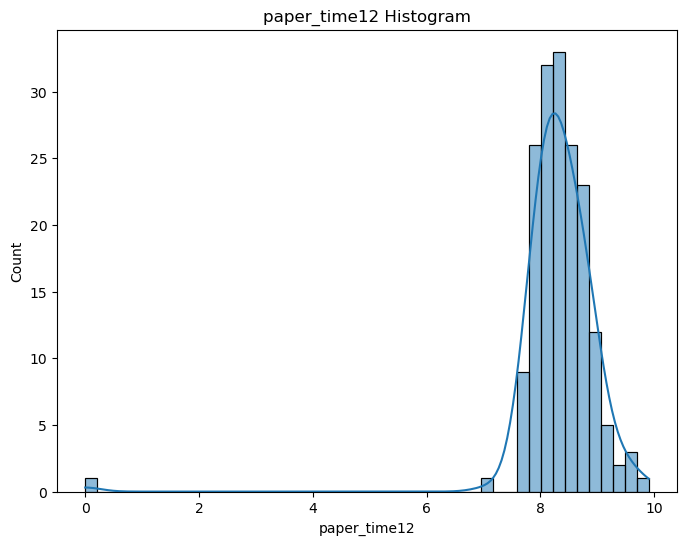

pressure_mean12: Not normally distributed (p-value: 3.39028966940988e-26)


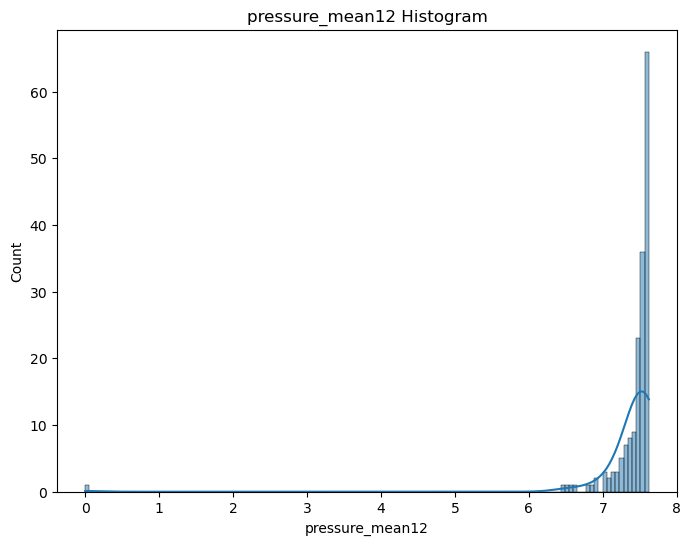

pressure_var12: Not normally distributed (p-value: 1.2921652012511097e-18)


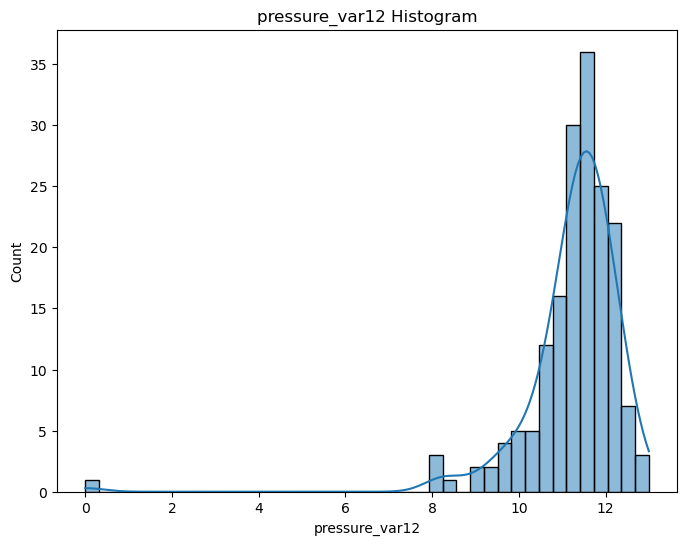

air_time13: Not normally distributed (p-value: 0.01795203424990177)


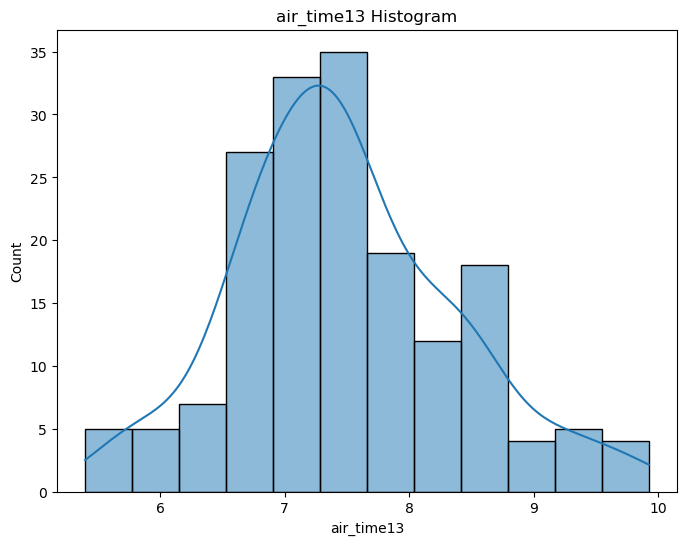

gmrt_in_air13: Normally distributed (p-value: 0.1848195195198059)


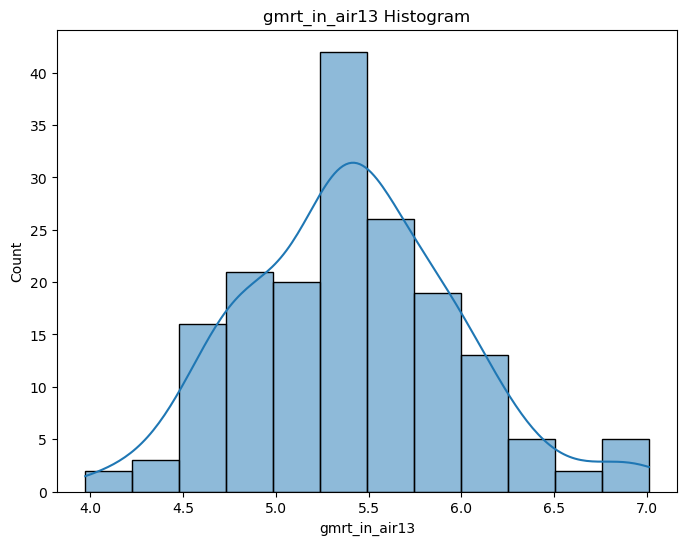

gmrt_on_paper13: Normally distributed (p-value: 0.0530671551823616)


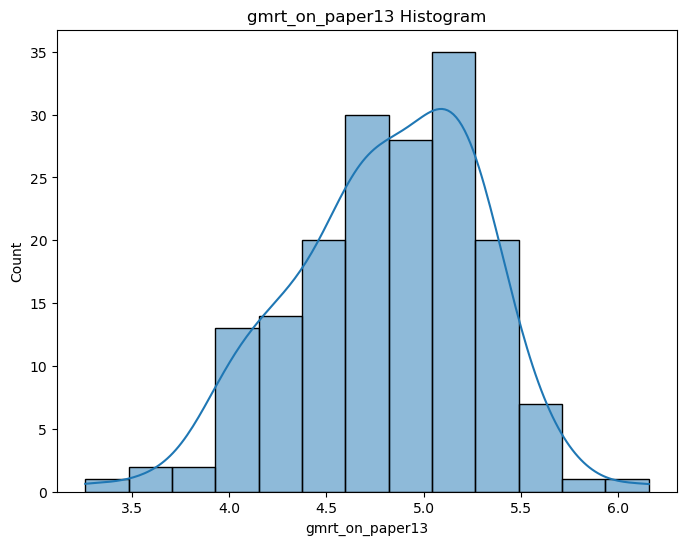

max_x_extension13: Not normally distributed (p-value: 1.7526748763430078e-07)


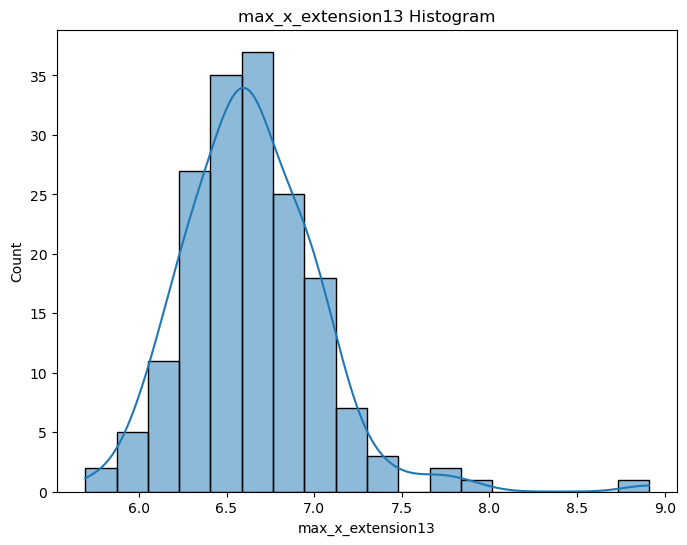

max_y_extension13: Normally distributed (p-value: 0.5768507122993469)


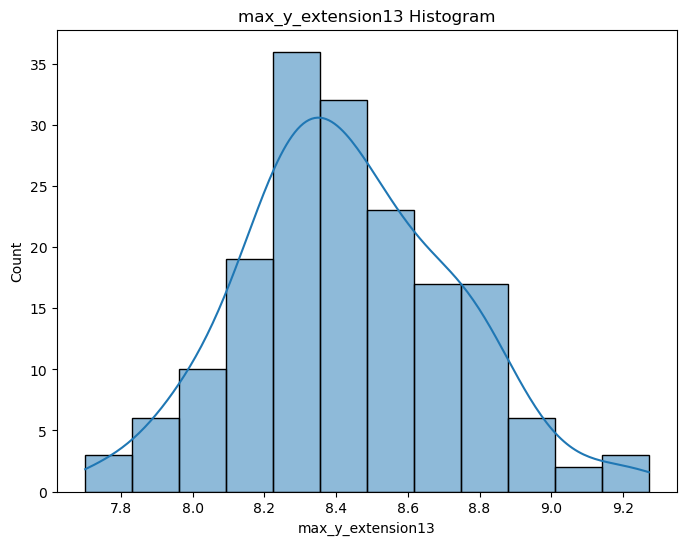

mean_acc_in_air13: Not normally distributed (p-value: 8.177553579932548e-21)


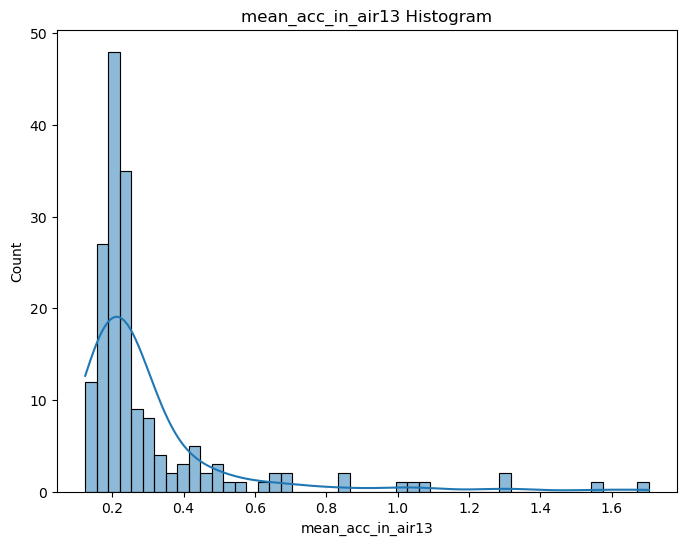

mean_speed_in_air13: Not normally distributed (p-value: 0.00013942619261797518)


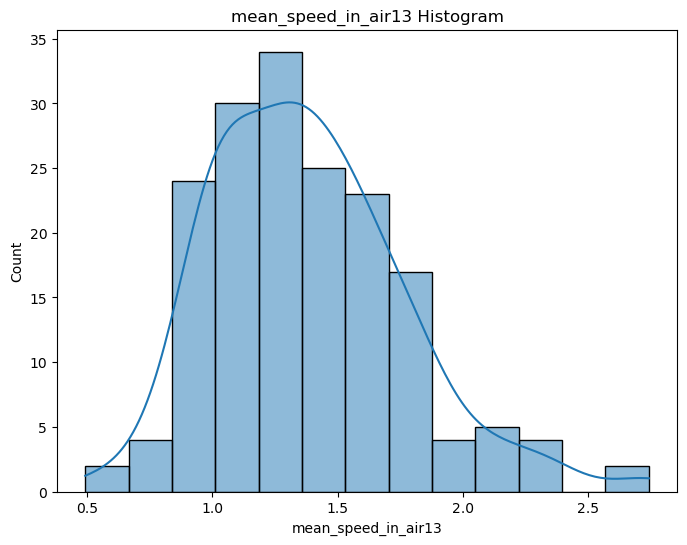

num_of_pendown13: Not normally distributed (p-value: 1.3246466323835193e-06)


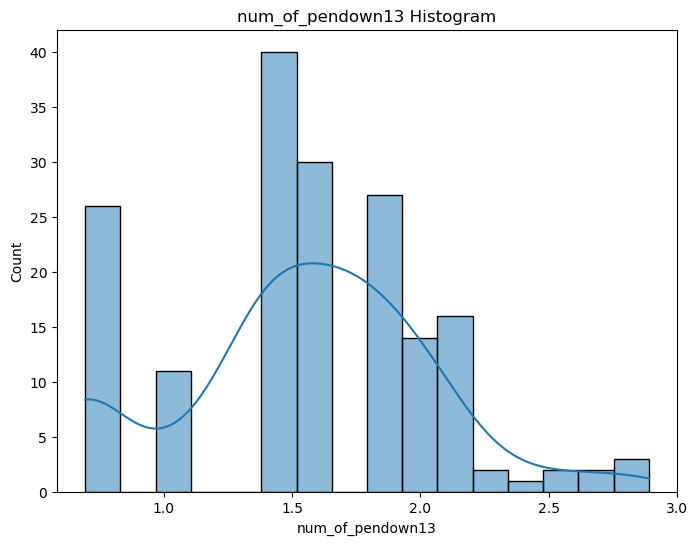

paper_time13: Not normally distributed (p-value: 0.004344233311712742)


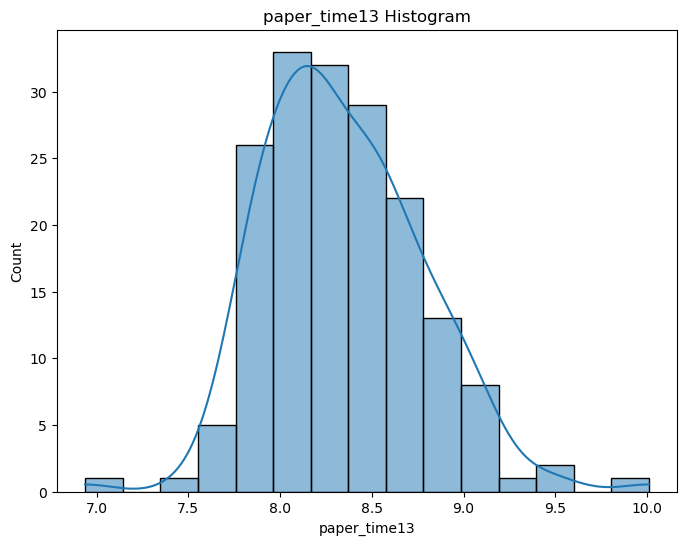

pressure_mean13: Not normally distributed (p-value: 3.494584143588488e-18)


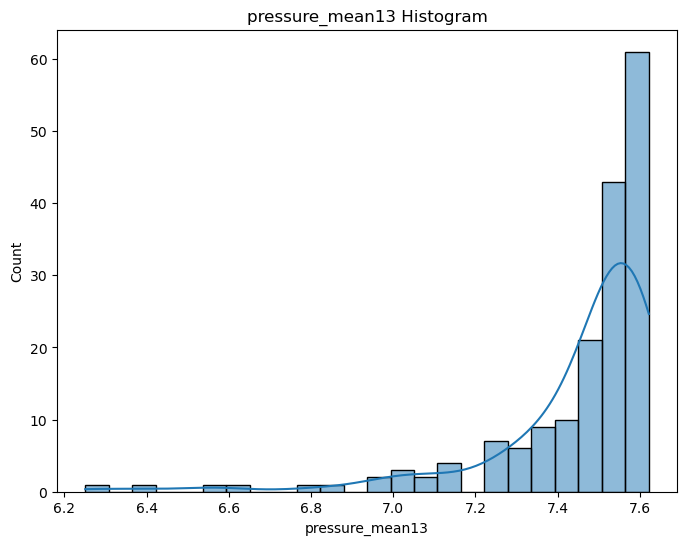

pressure_var13: Not normally distributed (p-value: 2.785990545817185e-06)


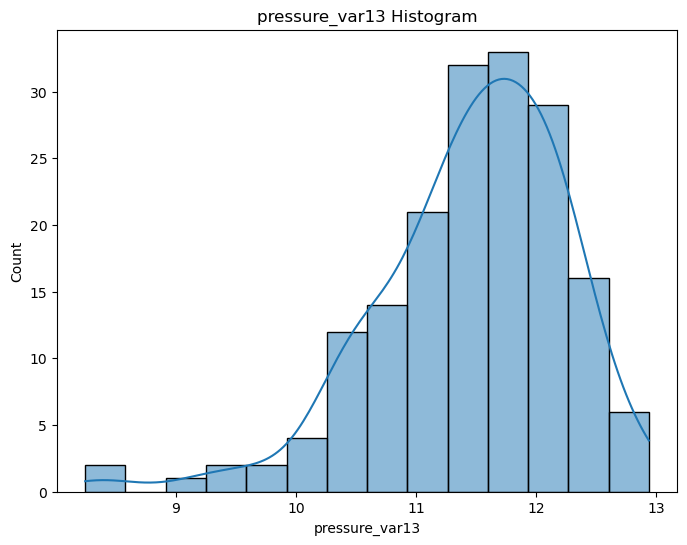

total_time13: Not normally distributed (p-value: 0.00011249927774770185)


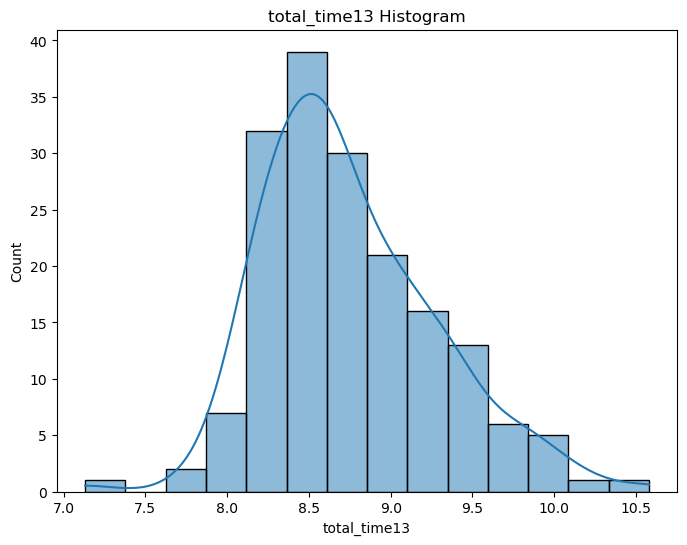

air_time14: Not normally distributed (p-value: 1.7580928934890494e-09)


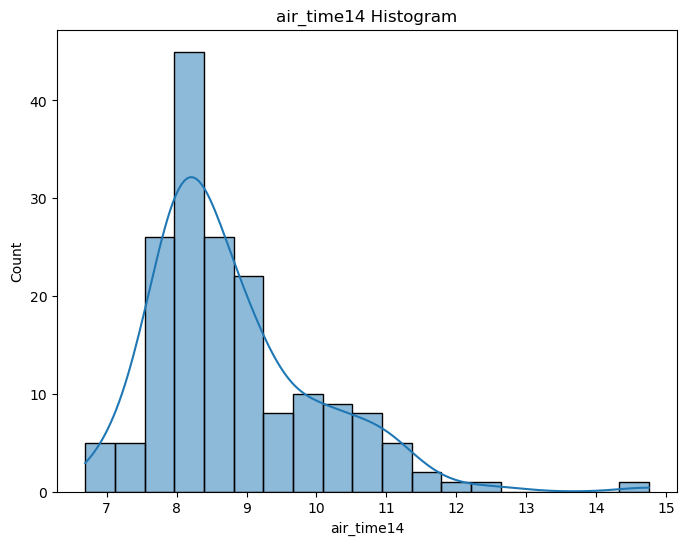

gmrt_in_air14: Not normally distributed (p-value: 0.001542397541925311)


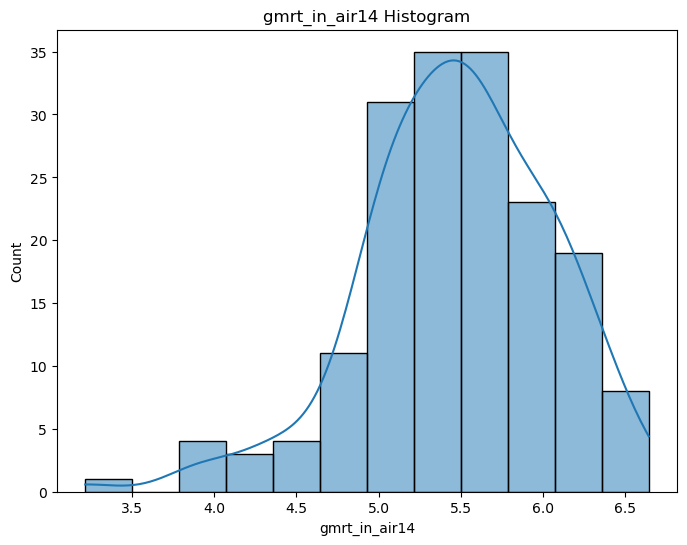

gmrt_on_paper14: Not normally distributed (p-value: 9.461624703860022e-17)


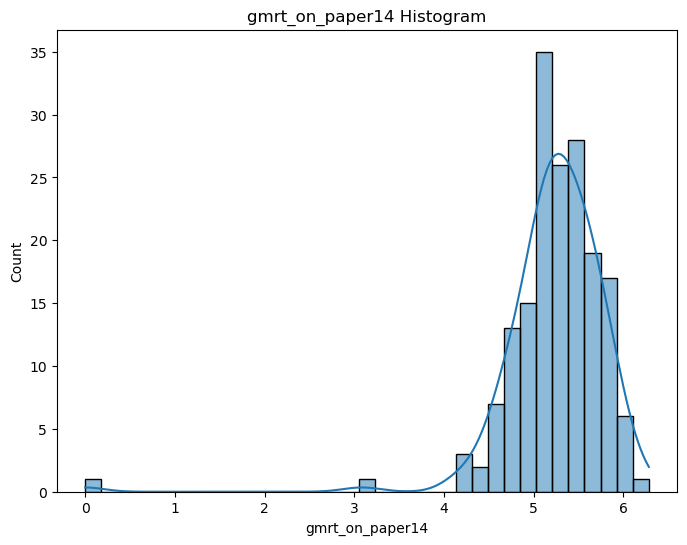

max_x_extension14: Not normally distributed (p-value: 1.299306189440734e-17)


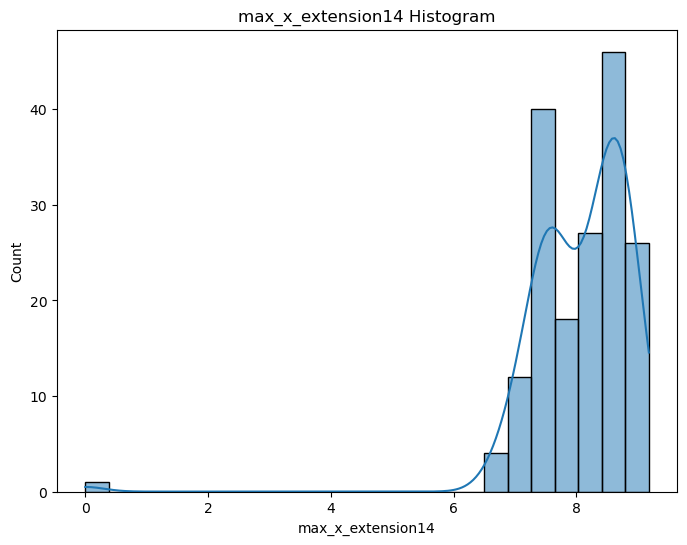

max_y_extension14: Not normally distributed (p-value: 8.034914199674734e-21)


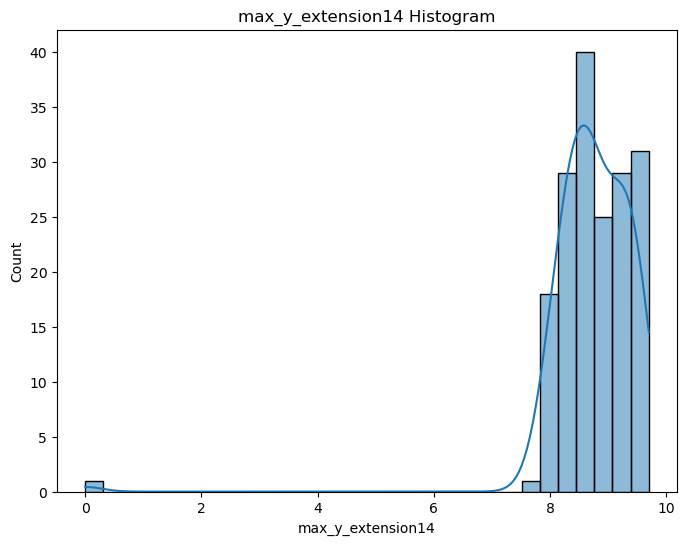

num_of_pendown14: Not normally distributed (p-value: 2.1500497950910358e-06)


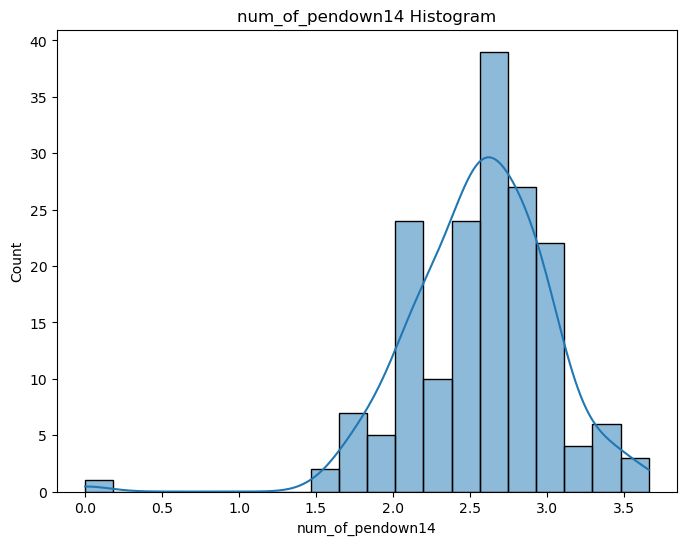

paper_time14: Not normally distributed (p-value: 1.789504773311812e-23)


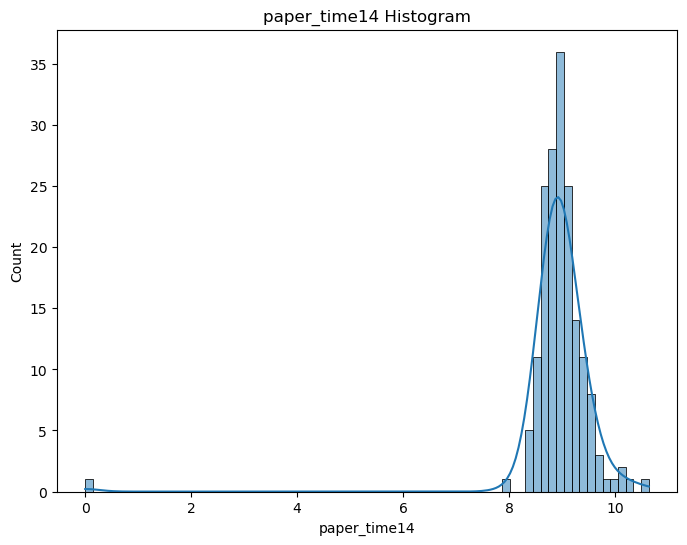

pressure_mean14: Not normally distributed (p-value: 7.71619918729099e-26)


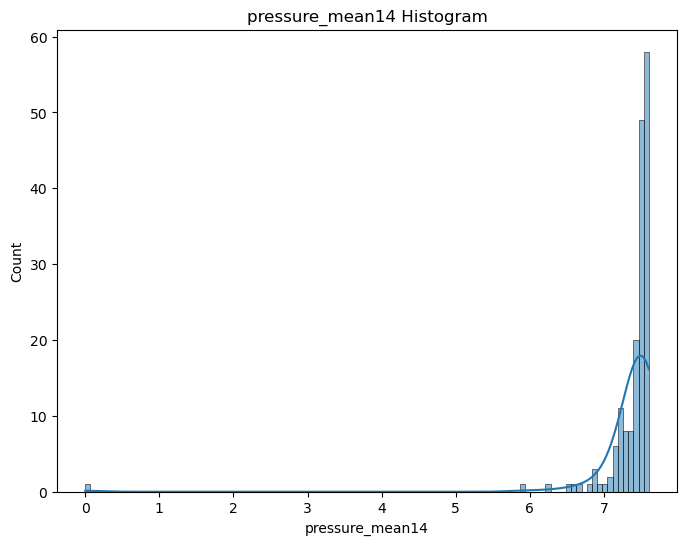

pressure_var14: Not normally distributed (p-value: 2.6553343321842585e-22)


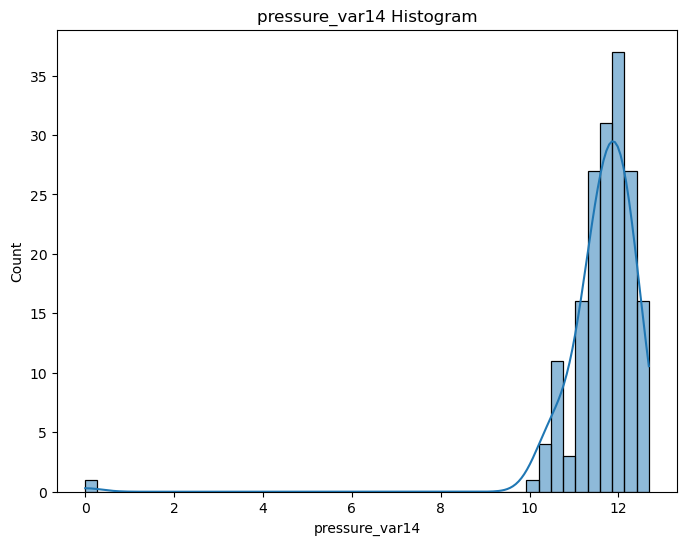

air_time15: Not normally distributed (p-value: 0.0005103567382320762)


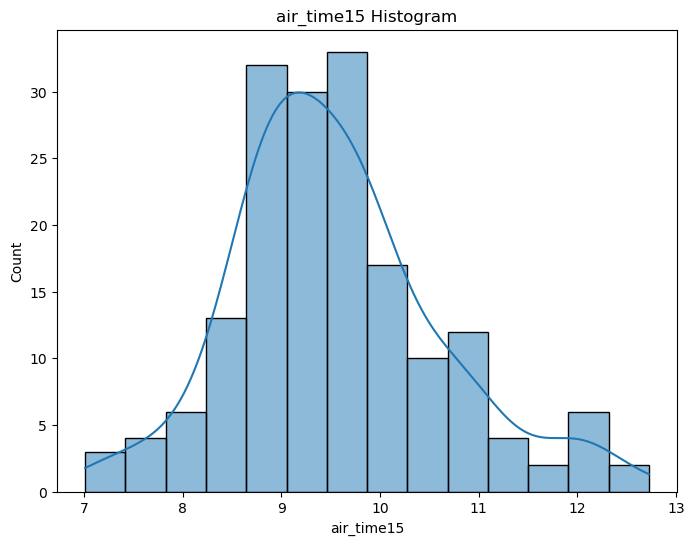

gmrt_in_air15: Normally distributed (p-value: 0.7159608006477356)


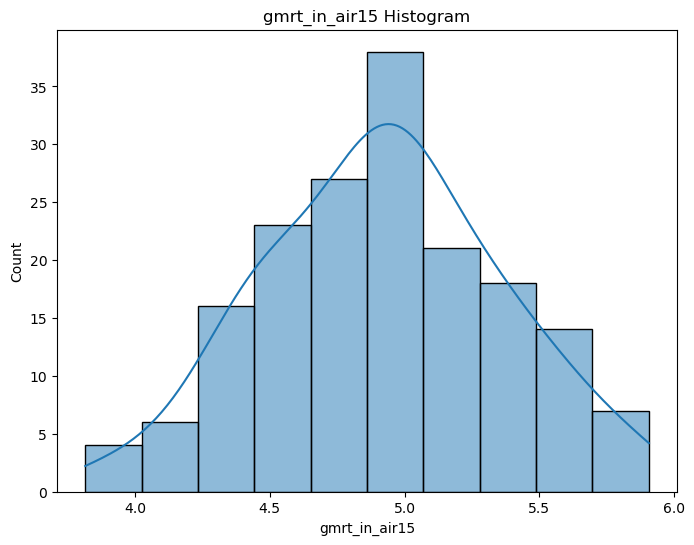

gmrt_on_paper15: Normally distributed (p-value: 0.16811050474643707)


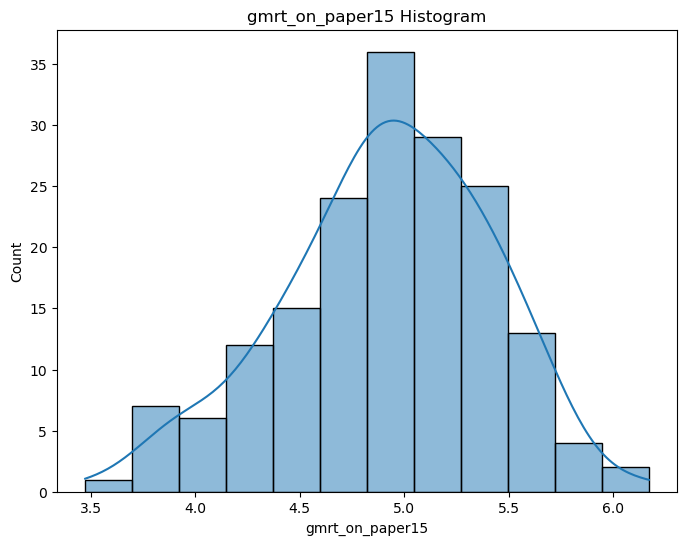

max_x_extension15: Normally distributed (p-value: 0.10474496334791183)


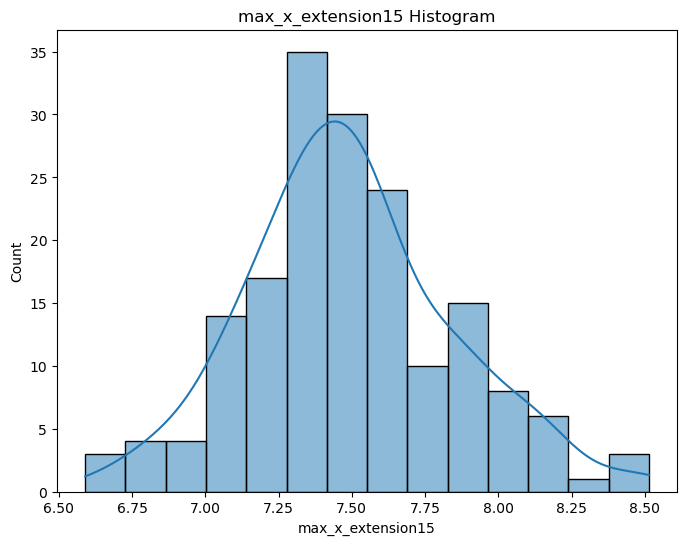

max_y_extension15: Not normally distributed (p-value: 0.0003043112519662827)


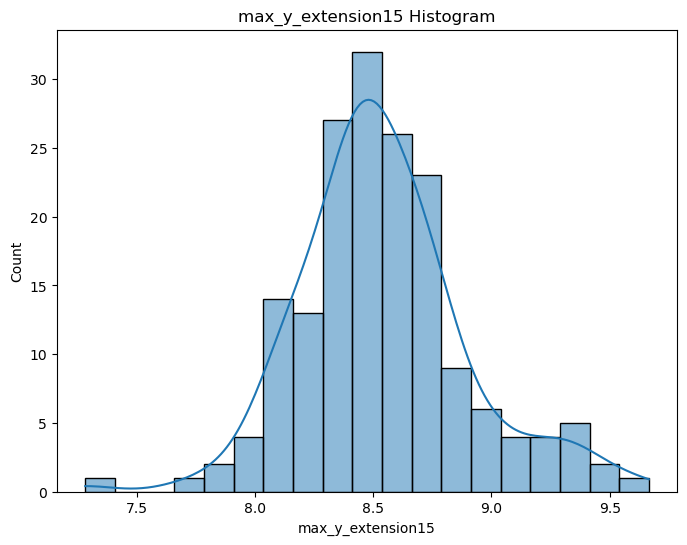

mean_gmrt15: Normally distributed (p-value: 0.6767081022262573)


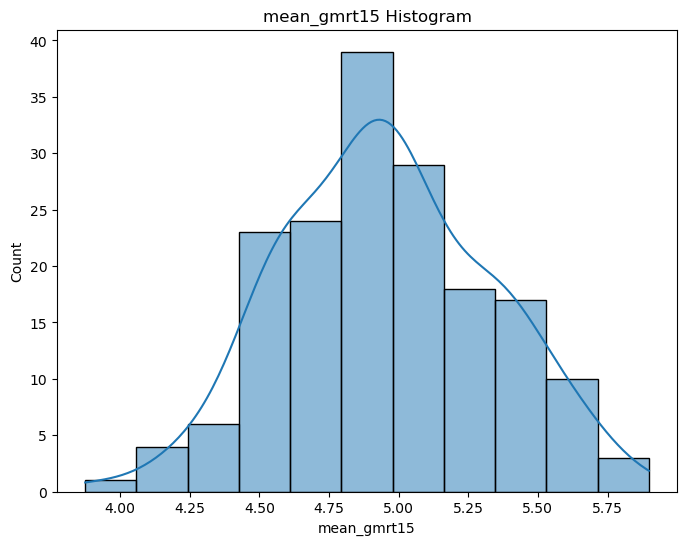

num_of_pendown15: Not normally distributed (p-value: 0.008873236365616322)


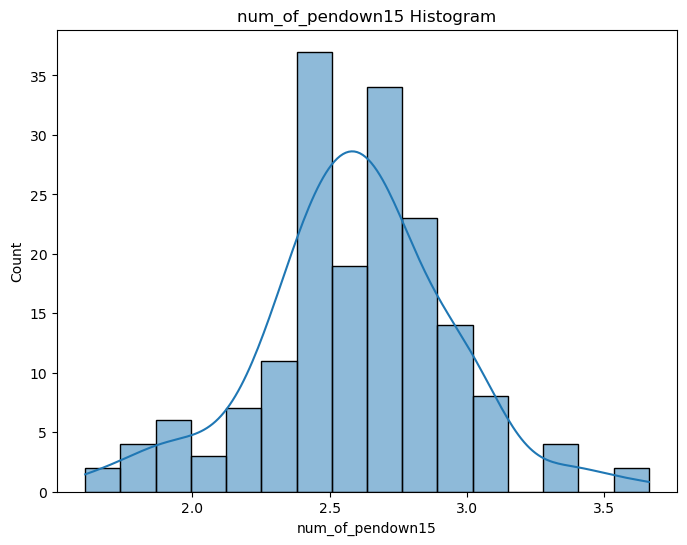

paper_time15: Not normally distributed (p-value: 2.9597333195852116e-05)


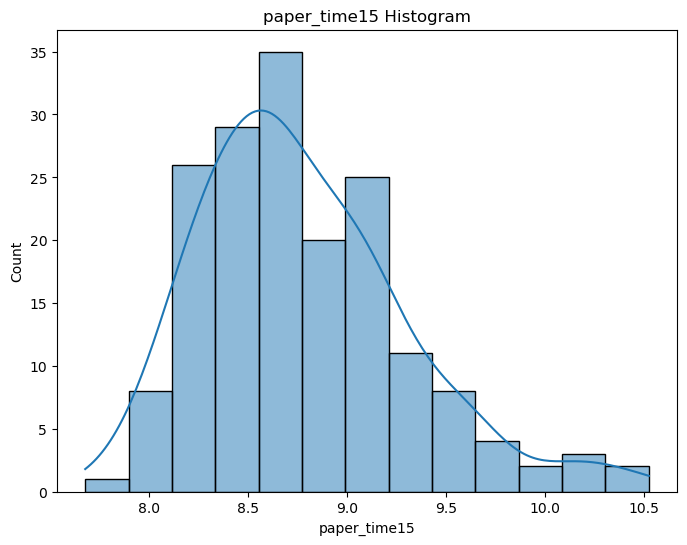

pressure_mean15: Not normally distributed (p-value: 2.425162901173363e-15)


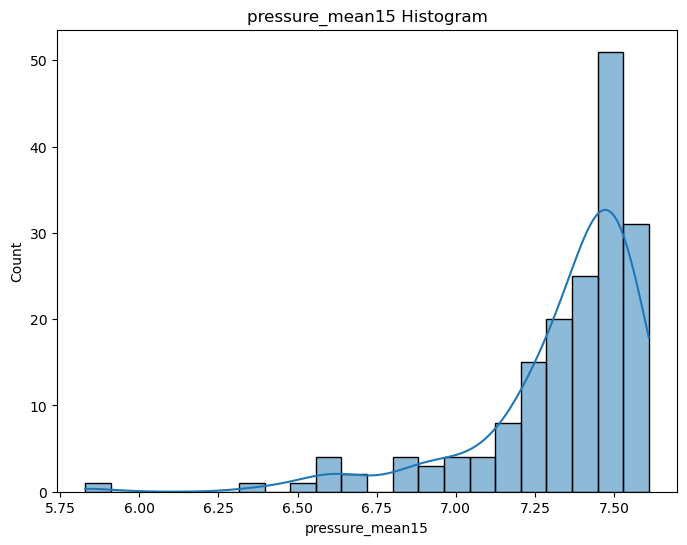

pressure_var15: Normally distributed (p-value: 0.10215678066015244)


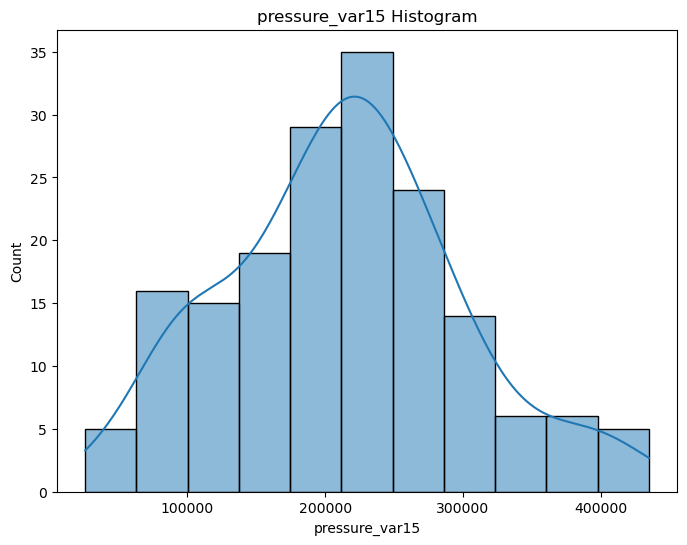

air_time16: Normally distributed (p-value: 0.27988553047180176)


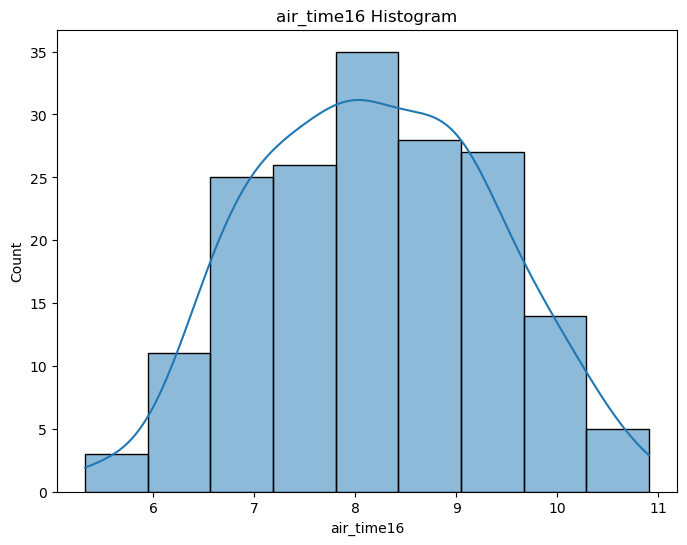

gmrt_in_air16: Normally distributed (p-value: 0.6374914646148682)


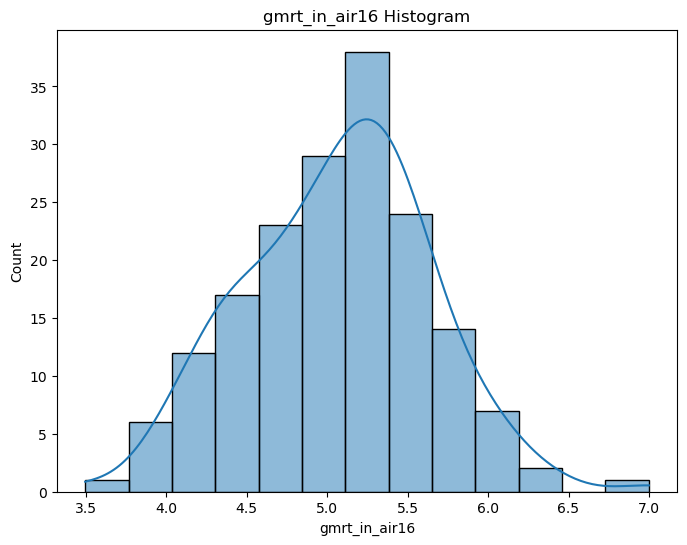

gmrt_on_paper16: Not normally distributed (p-value: 7.767011860060347e-13)


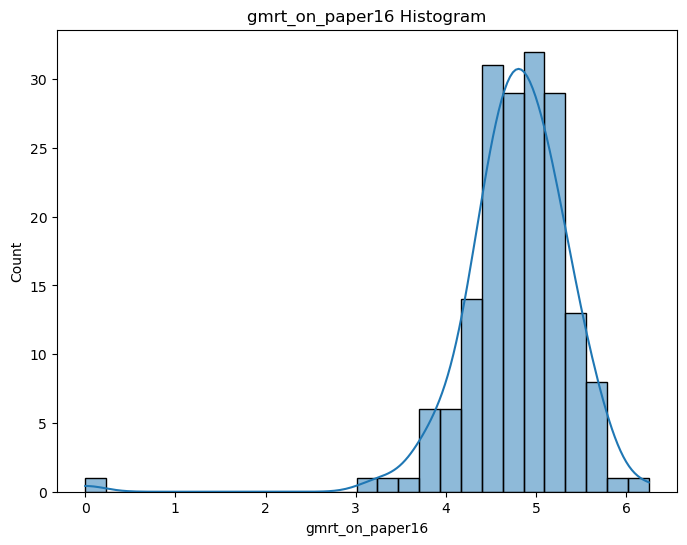

max_x_extension16: Not normally distributed (p-value: 1.903154793636073e-19)


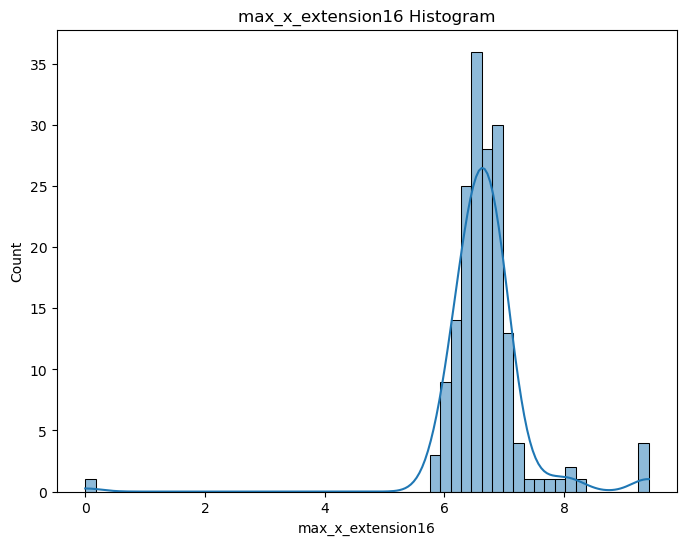

max_y_extension16: Not normally distributed (p-value: 1.7936575516870616e-21)


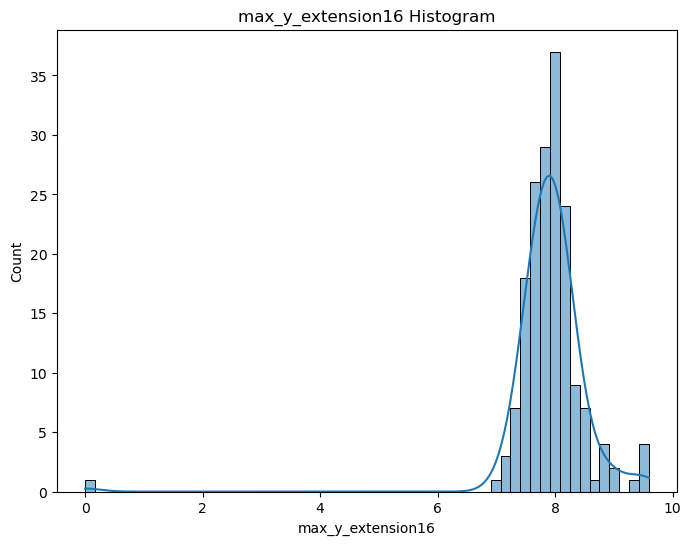

mean_gmrt16: Normally distributed (p-value: 0.710594654083252)


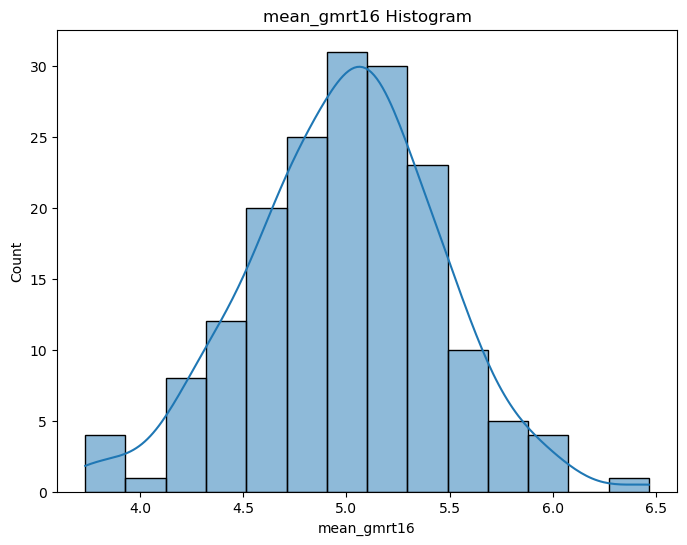

mean_speed_in_air16: Normally distributed (p-value: 0.08623342961072922)


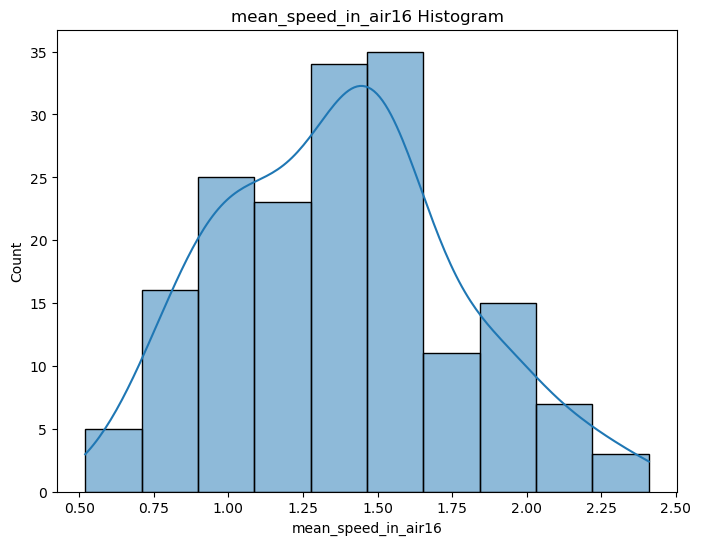

mean_speed_on_paper16: Normally distributed (p-value: 0.9590127468109131)


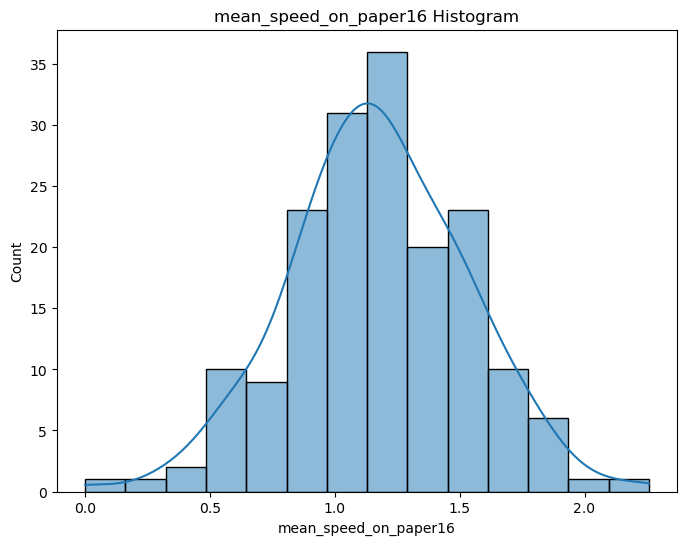

num_of_pendown16: Not normally distributed (p-value: 1.0285243661201093e-06)


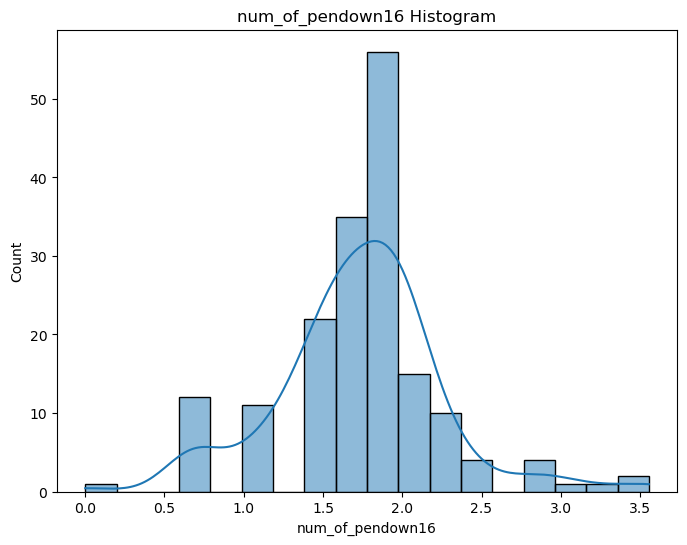

paper_time16: Not normally distributed (p-value: 1.3308762199428257e-18)


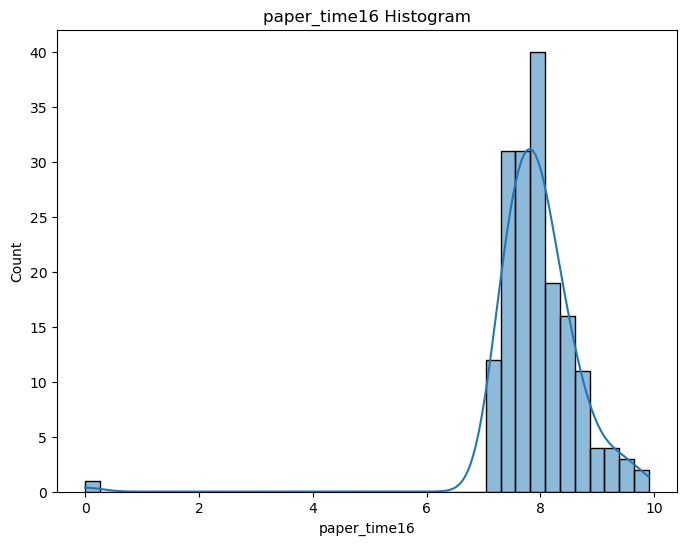

pressure_mean16: Not normally distributed (p-value: 1.0124244801910992e-24)


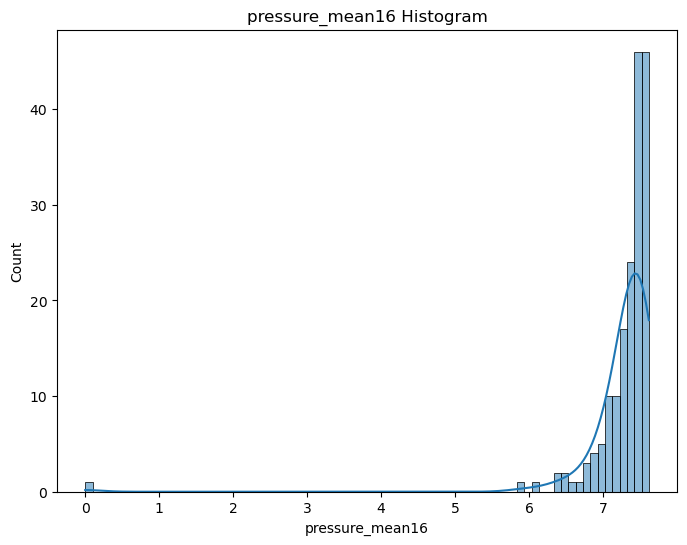

pressure_var16: Not normally distributed (p-value: 1.0048963079973718e-21)


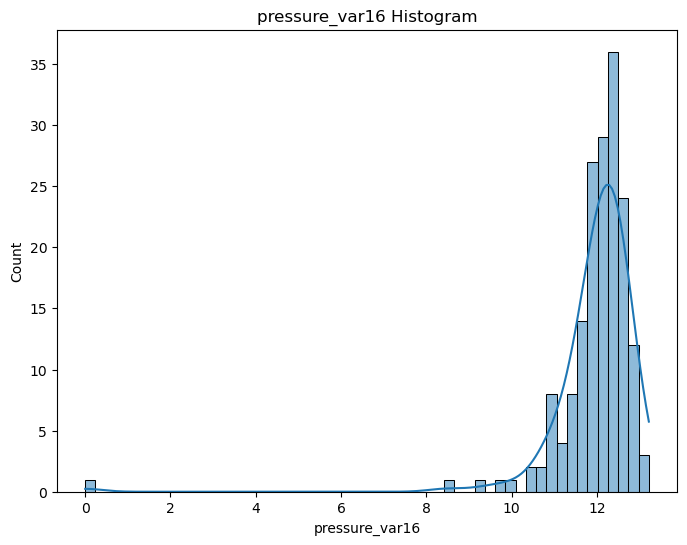

air_time17: Not normally distributed (p-value: 1.0813475455506705e-05)


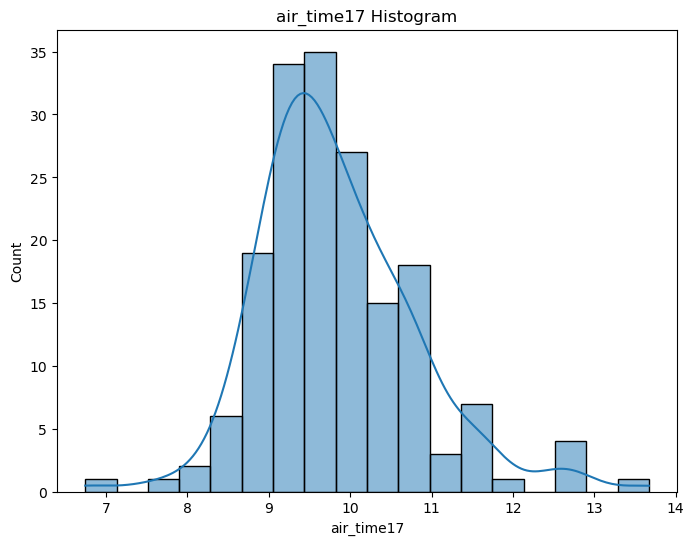

gmrt_in_air17: Normally distributed (p-value: 0.10904110968112946)


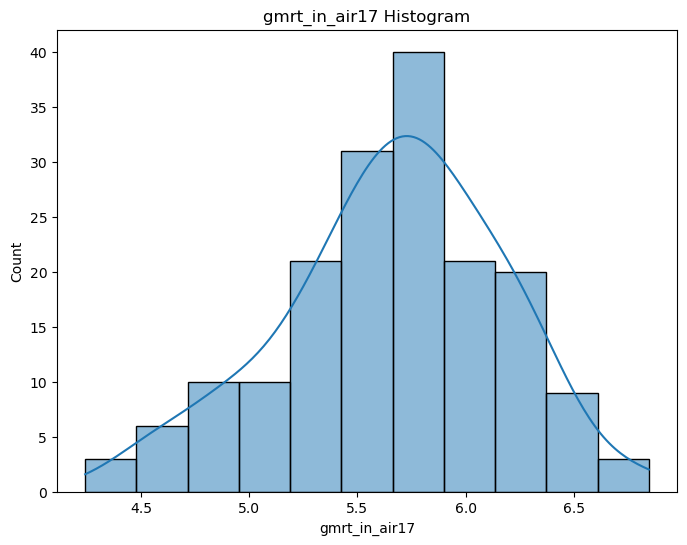

gmrt_on_paper17: Normally distributed (p-value: 0.721794843673706)


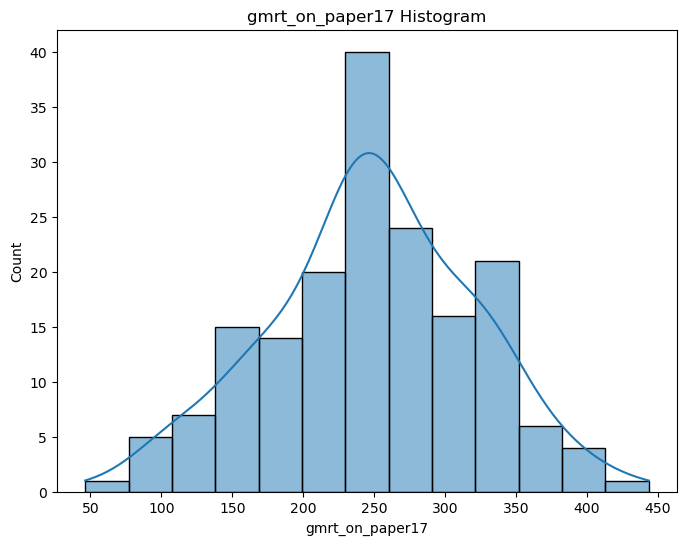

max_x_extension17: Not normally distributed (p-value: 2.3954666574109885e-27)


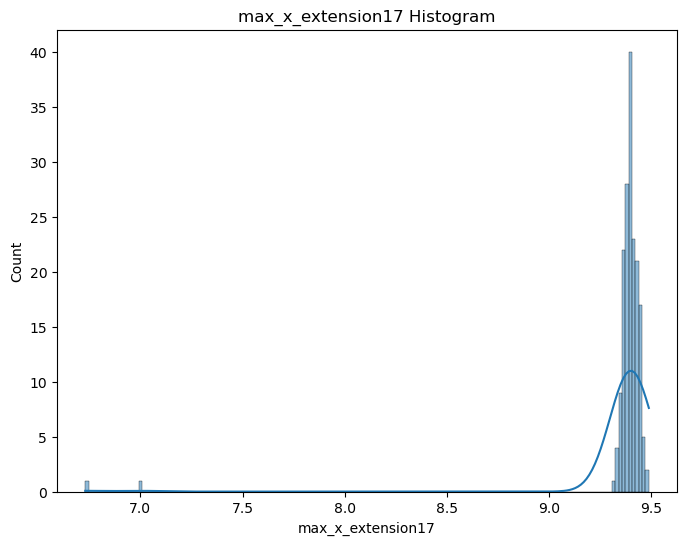

max_y_extension17: Not normally distributed (p-value: 1.290211198342458e-24)


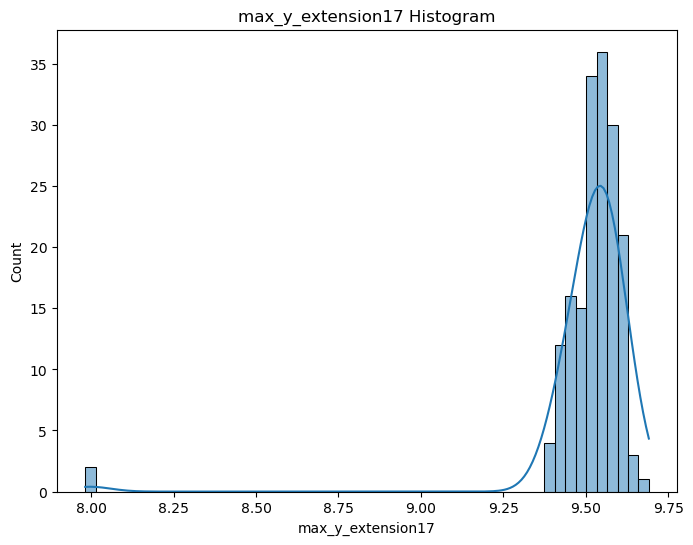

mean_acc_in_air17: Normally distributed (p-value: 0.42931458353996277)


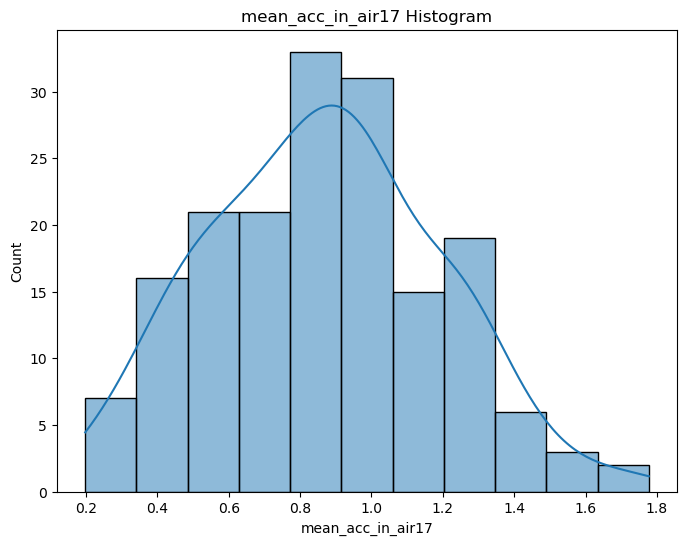

mean_speed_on_paper17: Normally distributed (p-value: 0.4475163221359253)


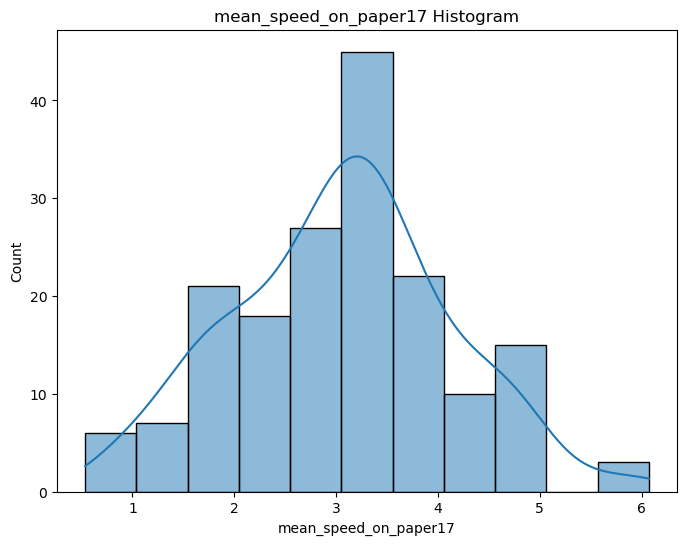

num_of_pendown17: Not normally distributed (p-value: 4.420437562657753e-07)


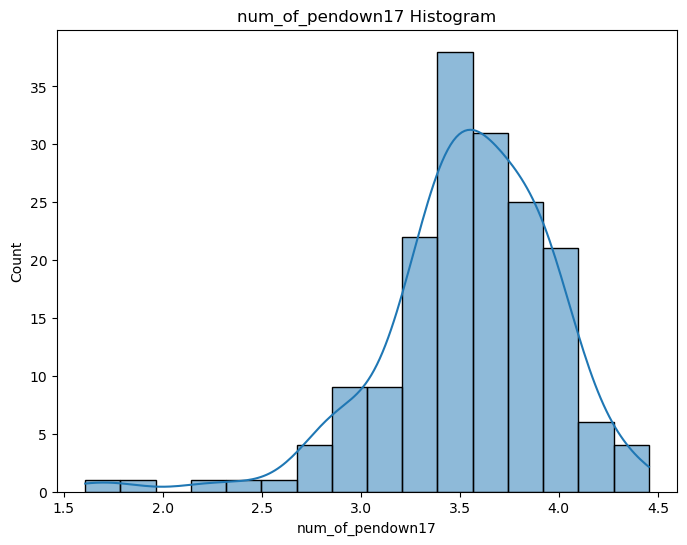

paper_time17: Not normally distributed (p-value: 5.397403444323823e-13)


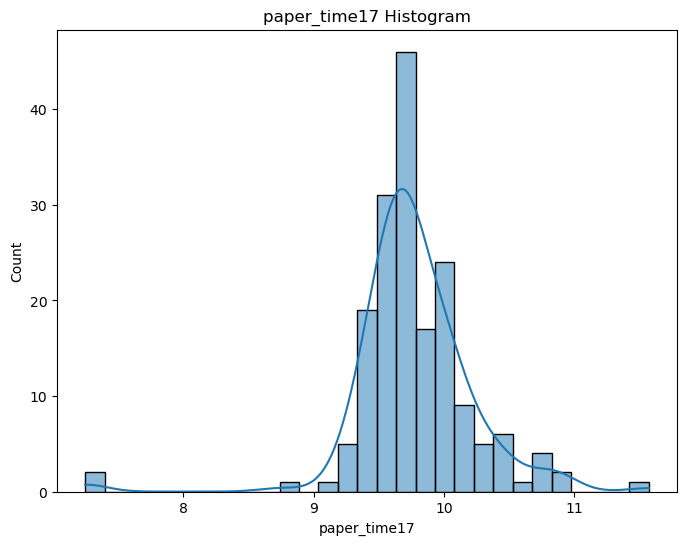

pressure_mean17: Not normally distributed (p-value: 1.31649922119071e-17)


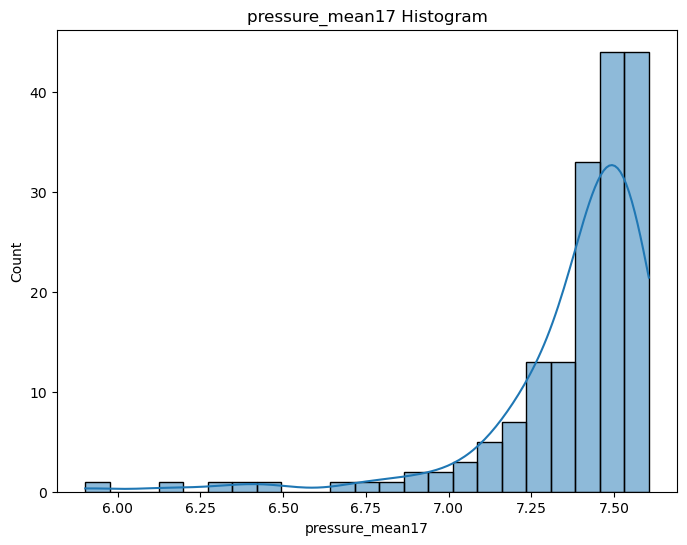

pressure_var17: Not normally distributed (p-value: 3.147342386711216e-09)


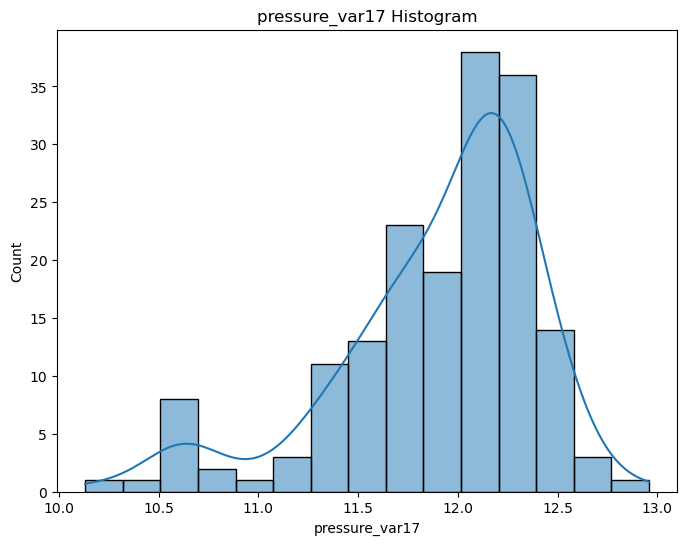

air_time18: Not normally distributed (p-value: 0.0002847369760274887)


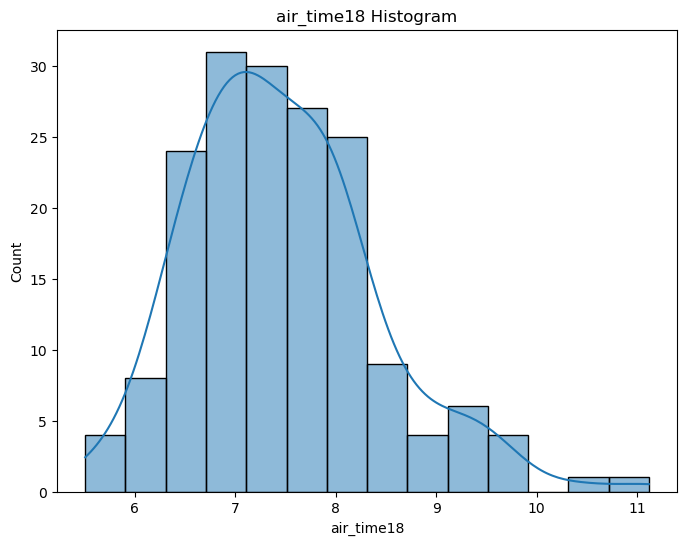

gmrt_in_air18: Normally distributed (p-value: 0.3685950040817261)


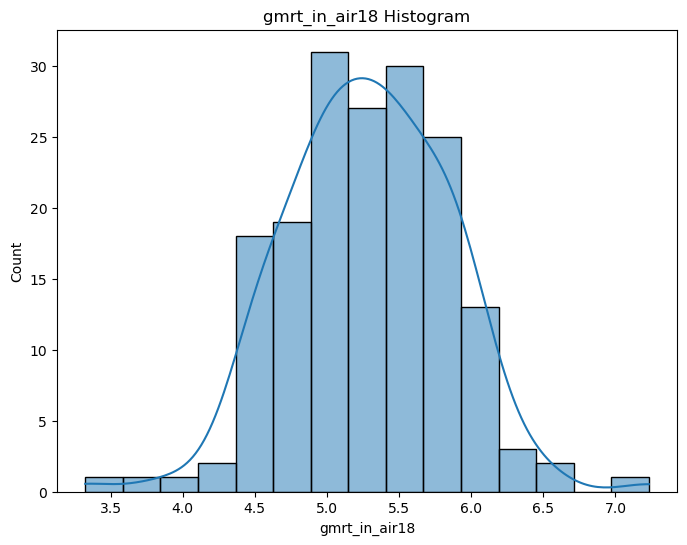

gmrt_on_paper18: Not normally distributed (p-value: 1.6015856131000696e-17)


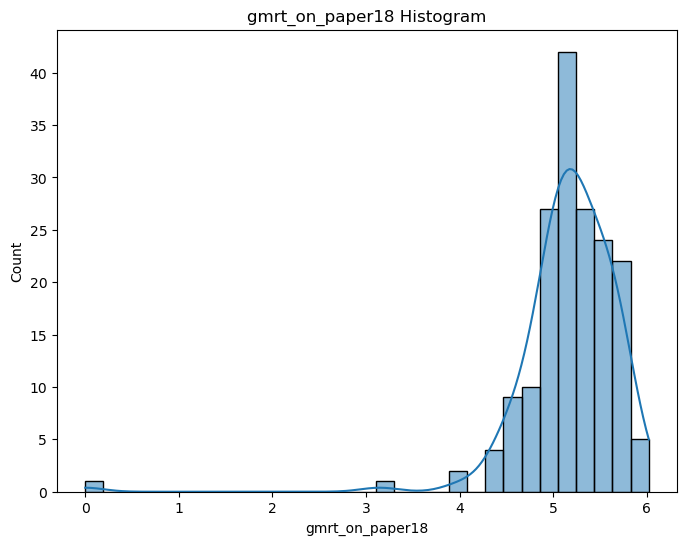

max_x_extension18: Not normally distributed (p-value: 2.935852613748577e-21)


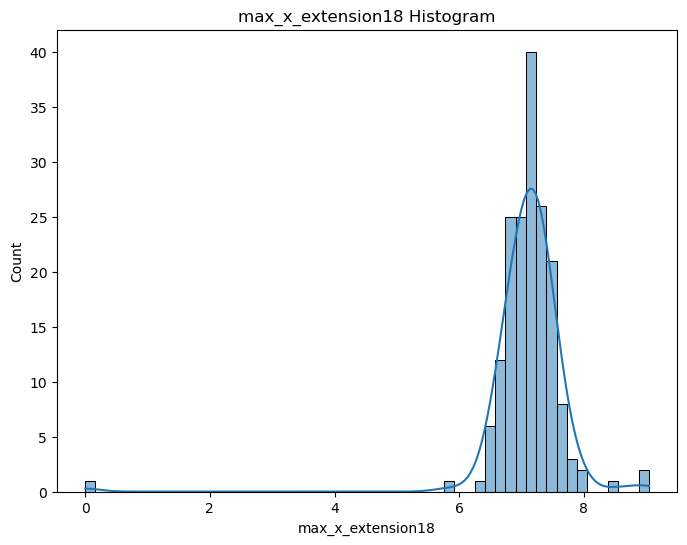

max_y_extension18: Not normally distributed (p-value: 9.276007914075805e-24)


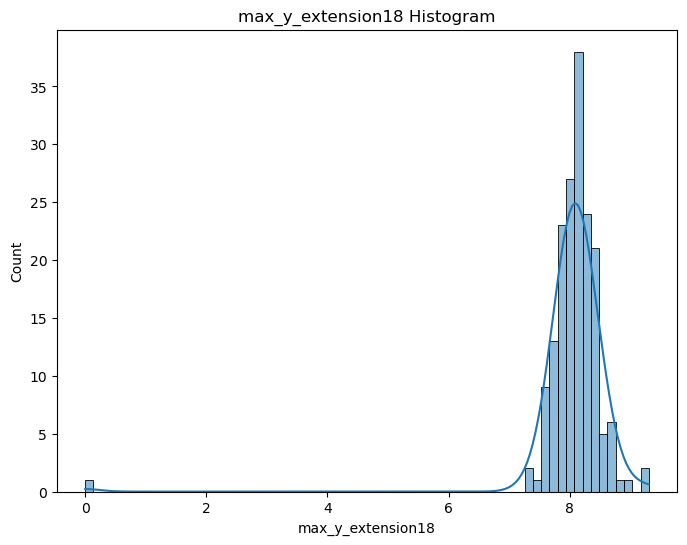

mean_gmrt18: Normally distributed (p-value: 0.06996230781078339)


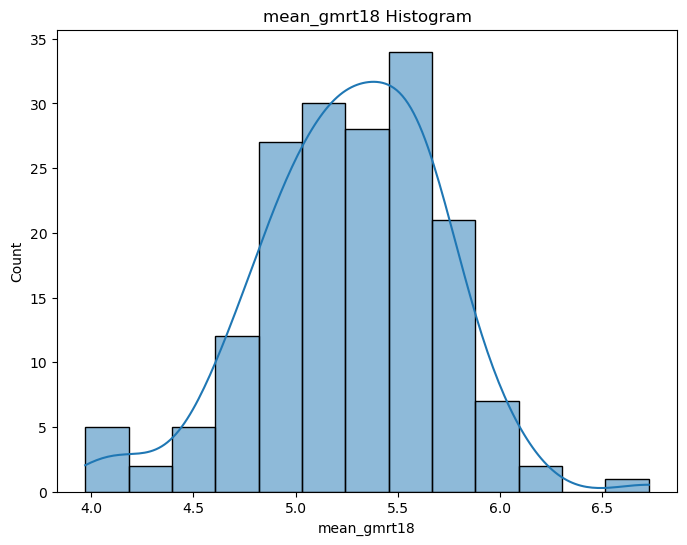

mean_speed_in_air18: Not normally distributed (p-value: 0.02558237314224243)


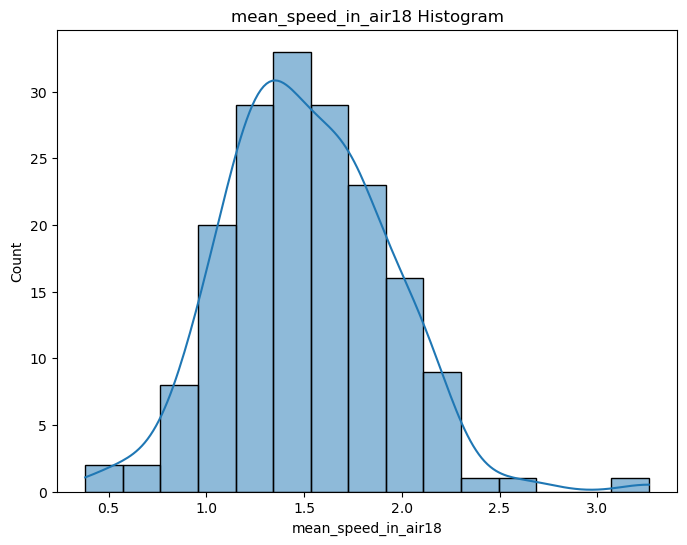

num_of_pendown18: Not normally distributed (p-value: 5.768662214578058e-10)


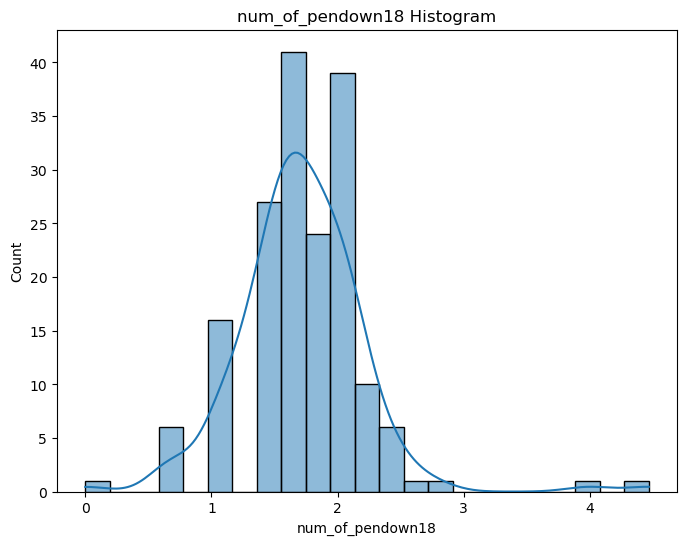

paper_time18: Not normally distributed (p-value: 3.7543904914675524e-22)


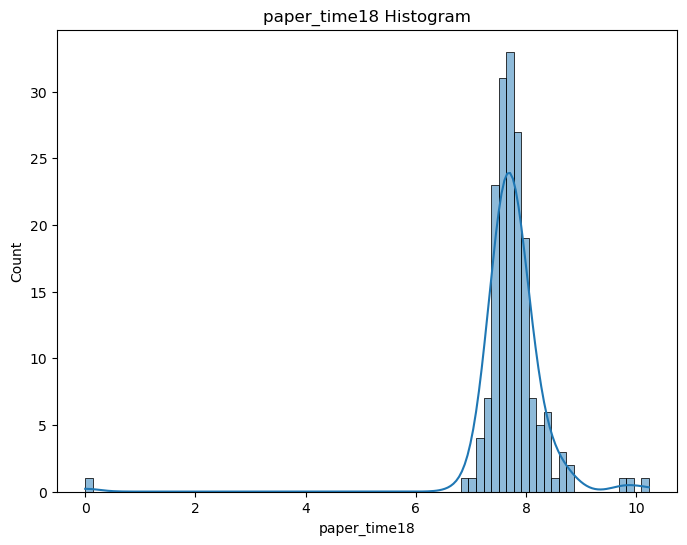

pressure_mean18: Not normally distributed (p-value: 1.1132959762302902e-25)


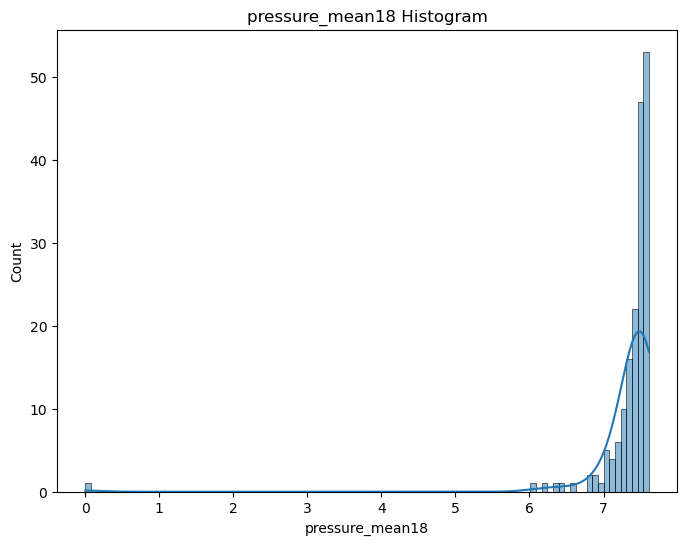

pressure_var18: Not normally distributed (p-value: 9.515064240752446e-21)


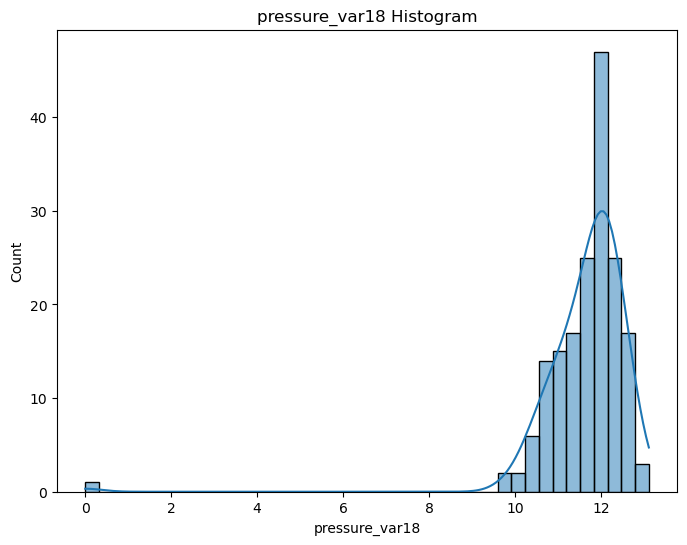

air_time19: Not normally distributed (p-value: 4.759299046019296e-18)


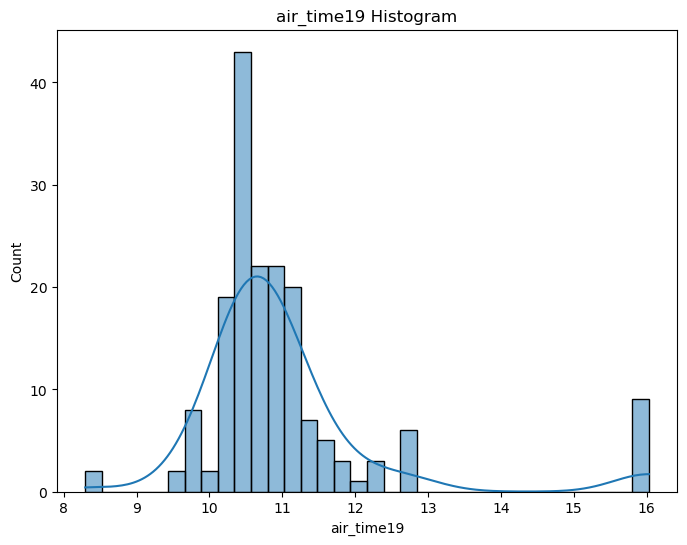

gmrt_in_air19: Not normally distributed (p-value: 0.01459877286106348)


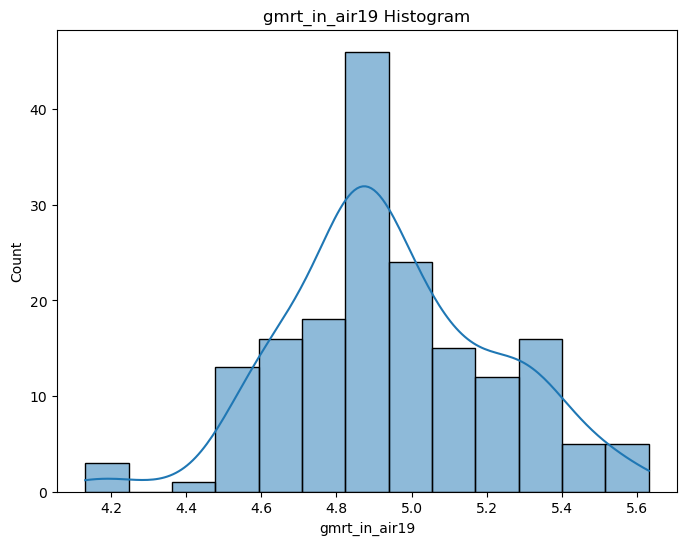

gmrt_on_paper19: Not normally distributed (p-value: 1.219594980561567e-09)


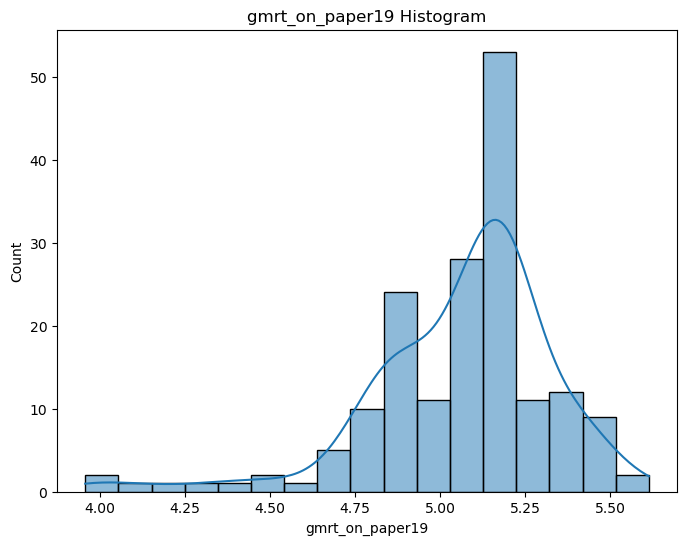

max_x_extension19: Not normally distributed (p-value: 6.122802607124232e-23)


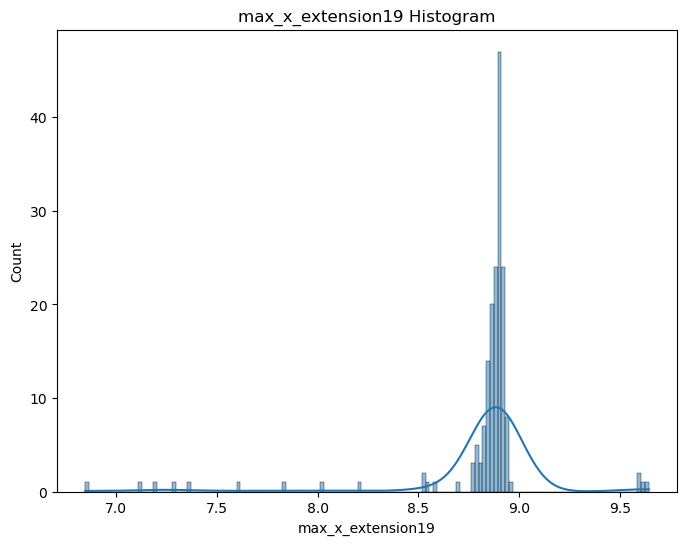

max_y_extension19: Not normally distributed (p-value: 1.0190776289360937e-20)


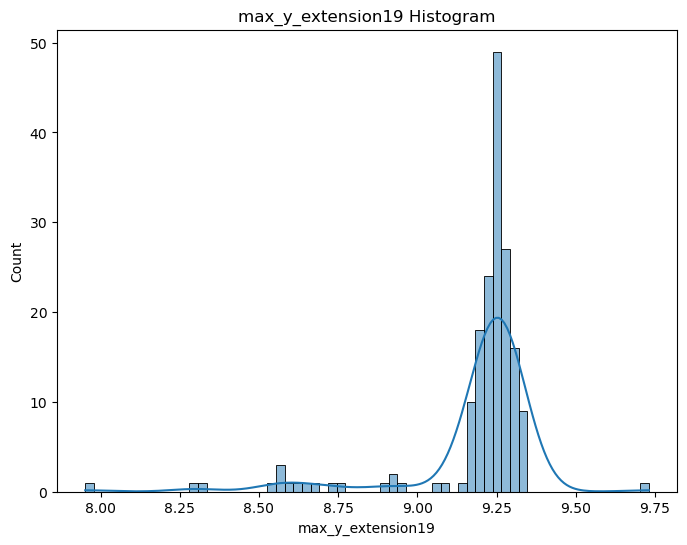

mean_gmrt19: Not normally distributed (p-value: 0.00041402195347473025)


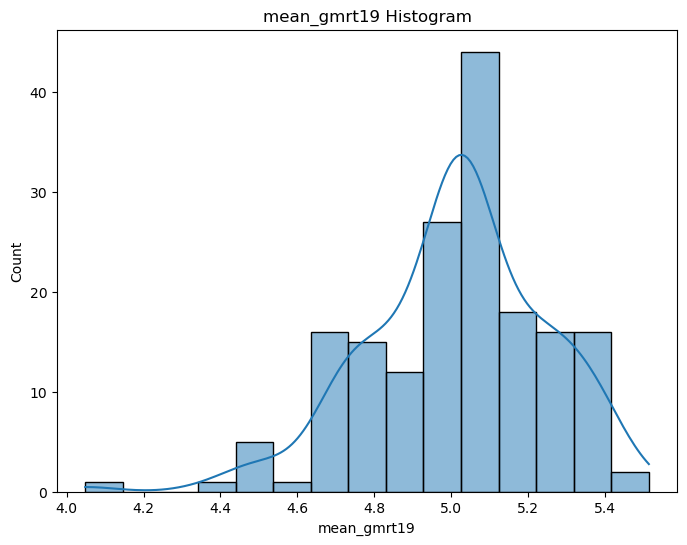

num_of_pendown19: Not normally distributed (p-value: 1.67150716379183e-07)


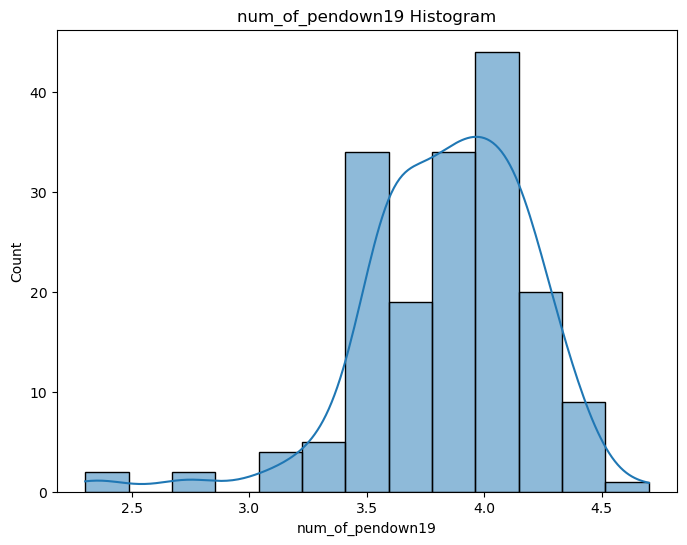

paper_time19: Not normally distributed (p-value: 1.2670863490382711e-11)


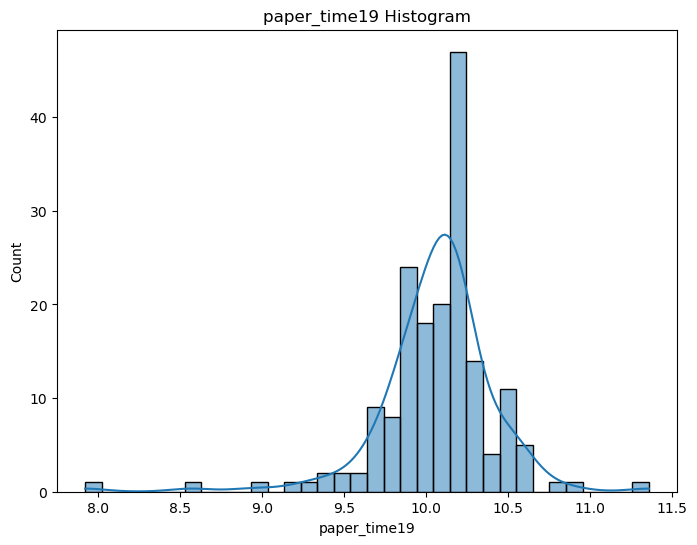

pressure_mean19: Not normally distributed (p-value: 3.2151742786327737e-17)


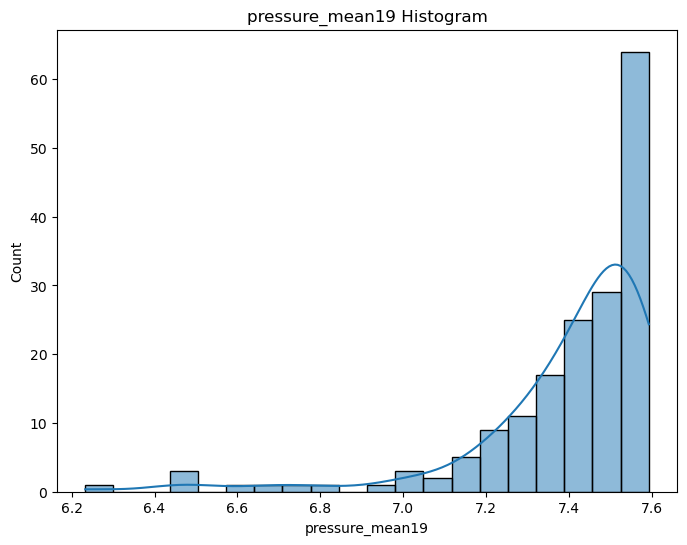

pressure_var19: Not normally distributed (p-value: 3.850528446491808e-05)


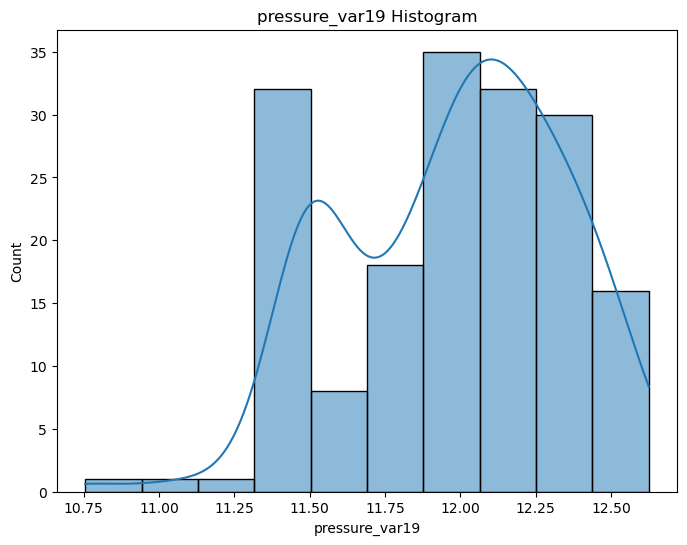

air_time20: Not normally distributed (p-value: 1.144831895949494e-09)


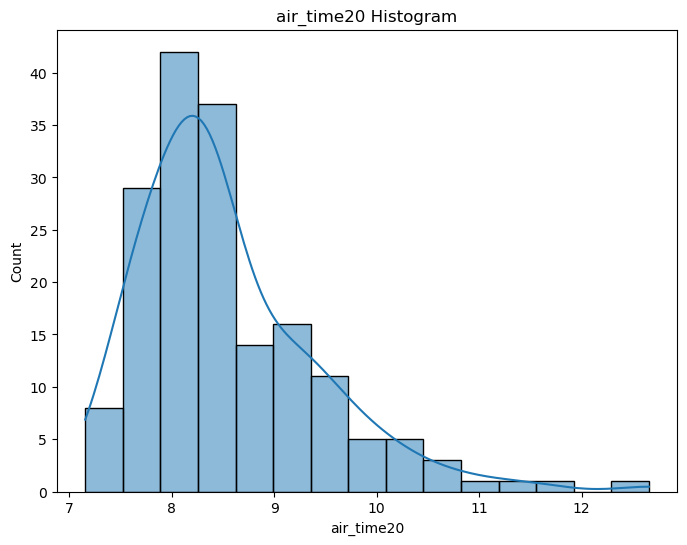

gmrt_in_air20: Normally distributed (p-value: 0.09526519477367401)


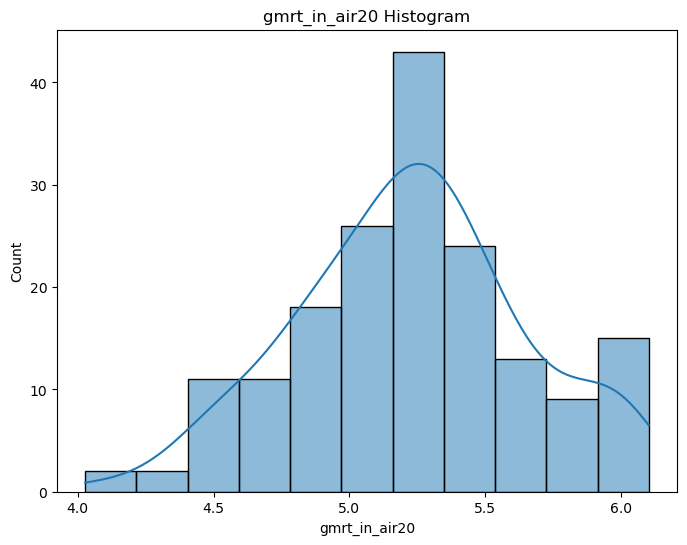

gmrt_on_paper20: Normally distributed (p-value: 0.7233409285545349)


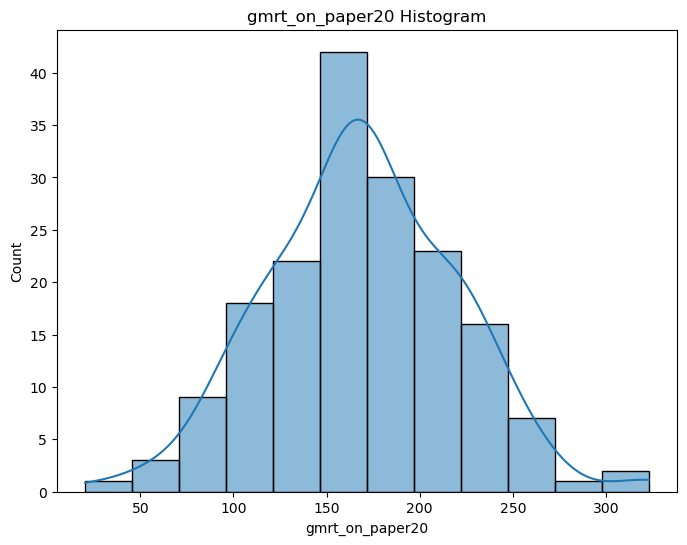

max_x_extension20: Not normally distributed (p-value: 1.0550508383611046e-10)


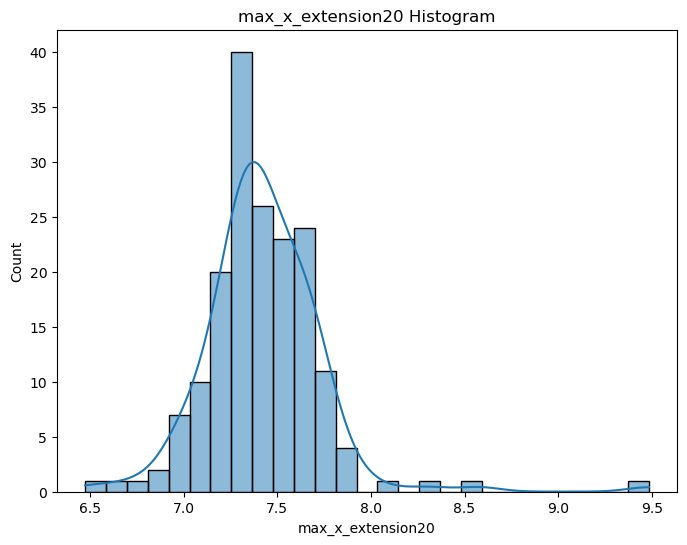

max_y_extension20: Normally distributed (p-value: 0.10347852110862732)


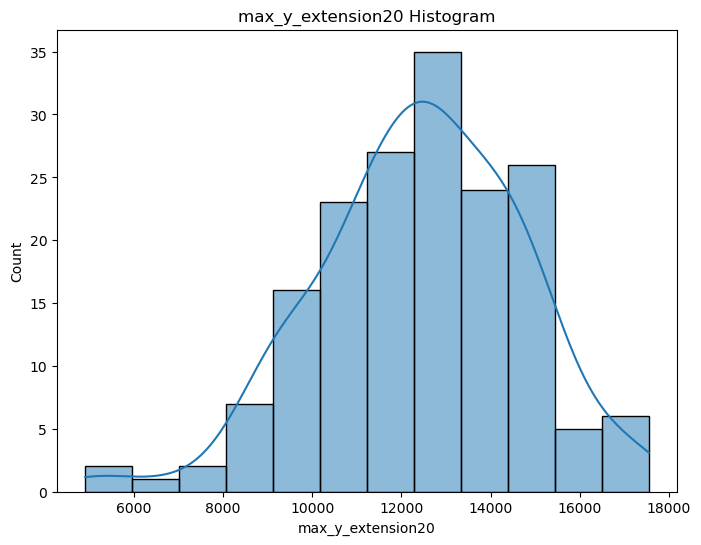

mean_gmrt20: Not normally distributed (p-value: 0.00044637691462412477)


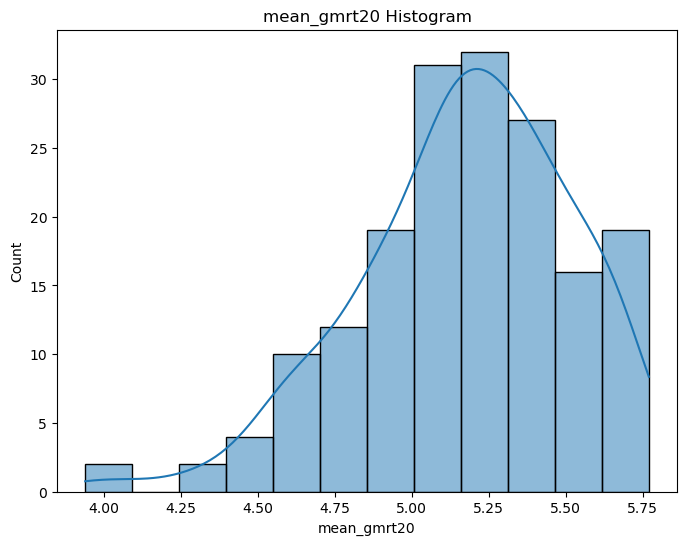

mean_speed_in_air20: Normally distributed (p-value: 0.5436367988586426)


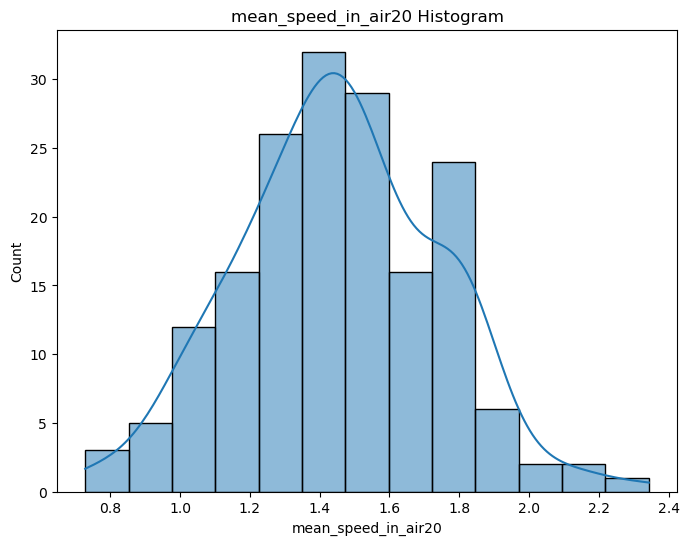

num_of_pendown20: Normally distributed (p-value: 0.057738736271858215)


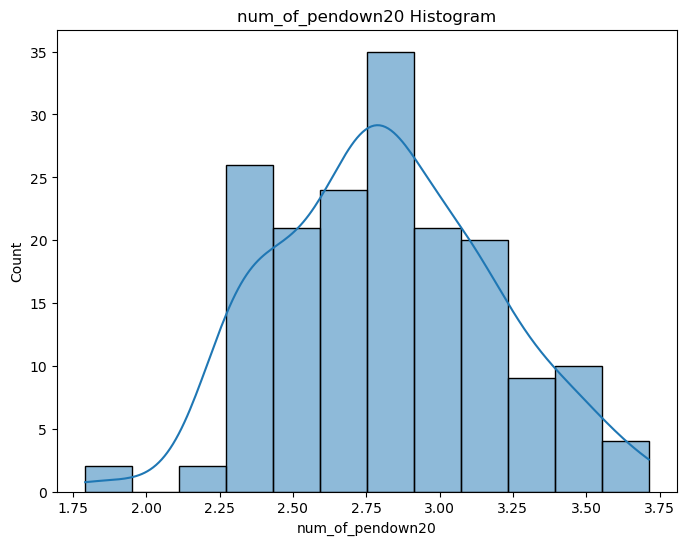

paper_time20: Not normally distributed (p-value: 1.2396608045639468e-11)


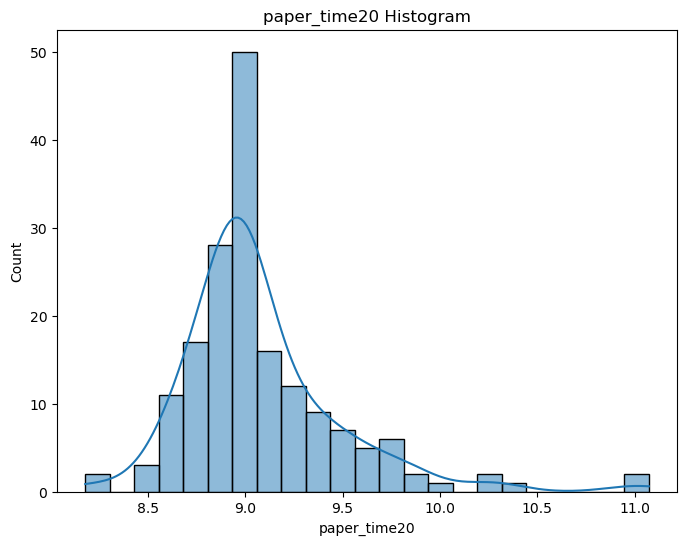

pressure_mean20: Not normally distributed (p-value: 5.150908466811479e-16)


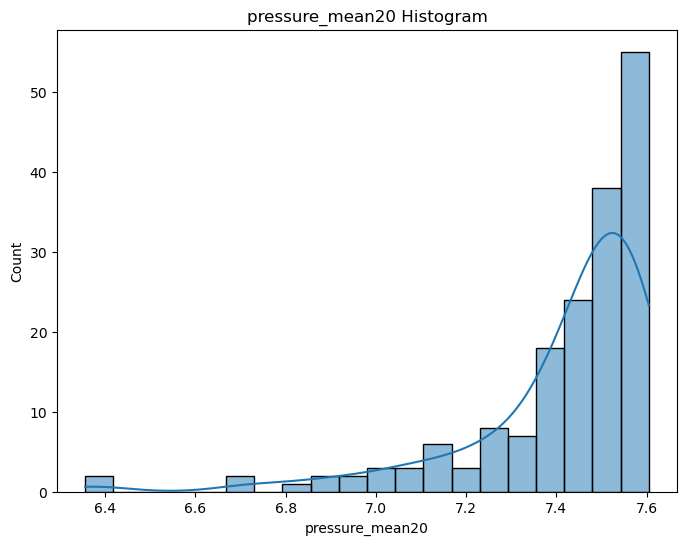

pressure_var20: Not normally distributed (p-value: 0.0007825459470041096)


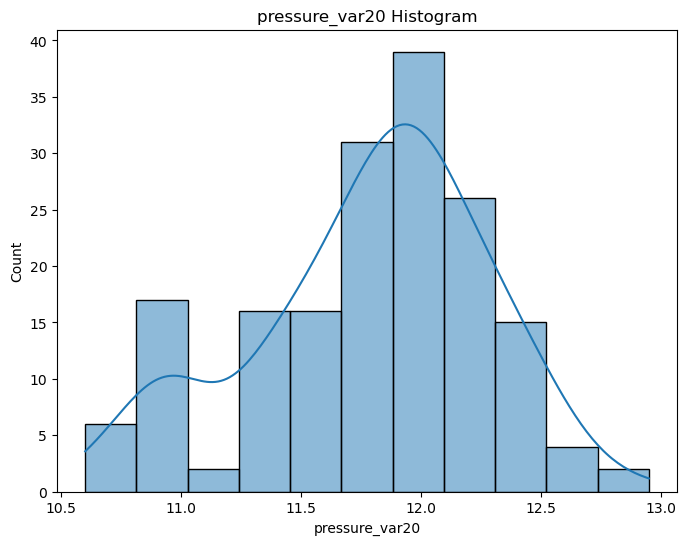

air_time21: Not normally distributed (p-value: 0.019654881209135056)


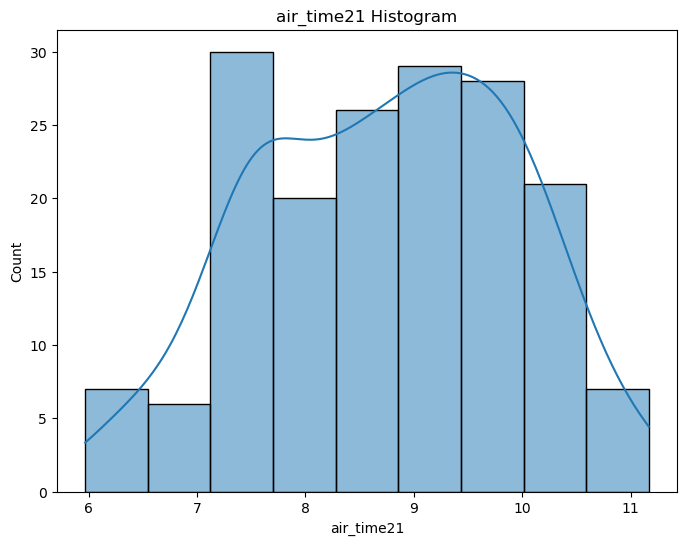

gmrt_in_air21: Not normally distributed (p-value: 0.005122125148773193)


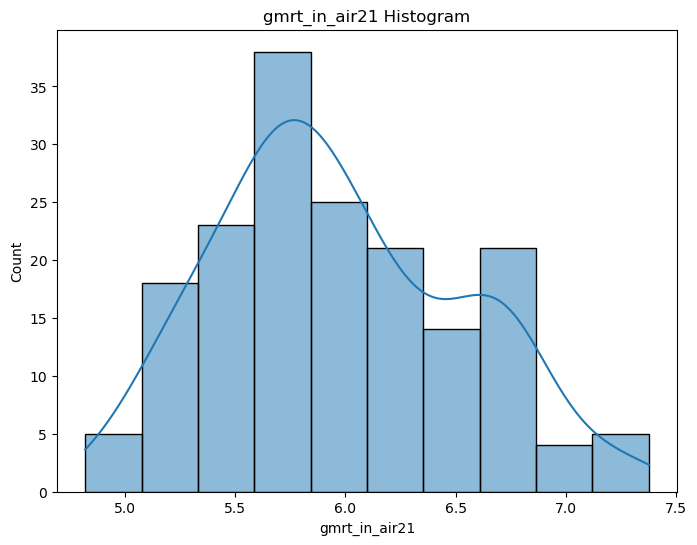

gmrt_on_paper21: Not normally distributed (p-value: 0.0268178042024374)


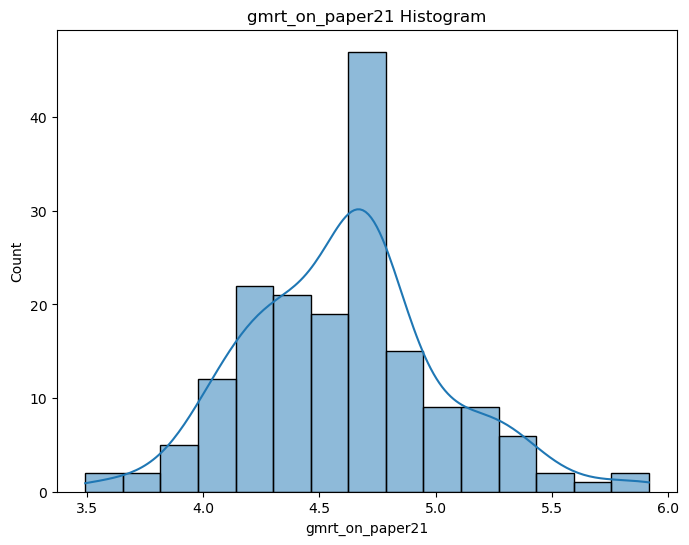

max_x_extension21: Not normally distributed (p-value: 2.560676734910691e-23)


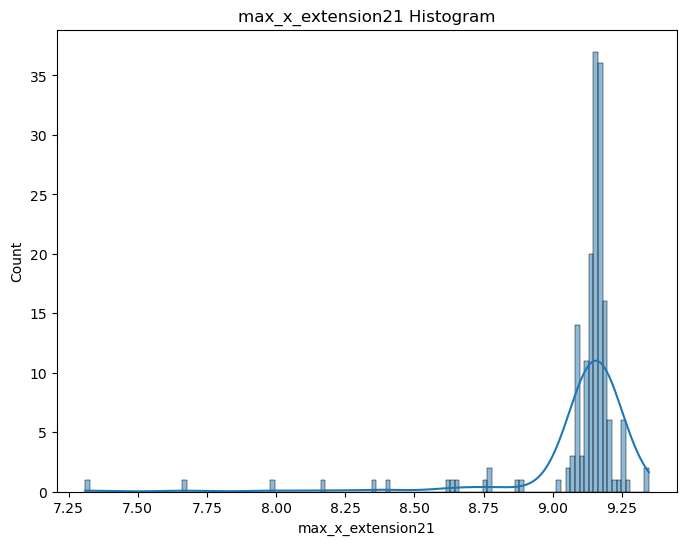

max_y_extension21: Not normally distributed (p-value: 1.3439782221483307e-23)


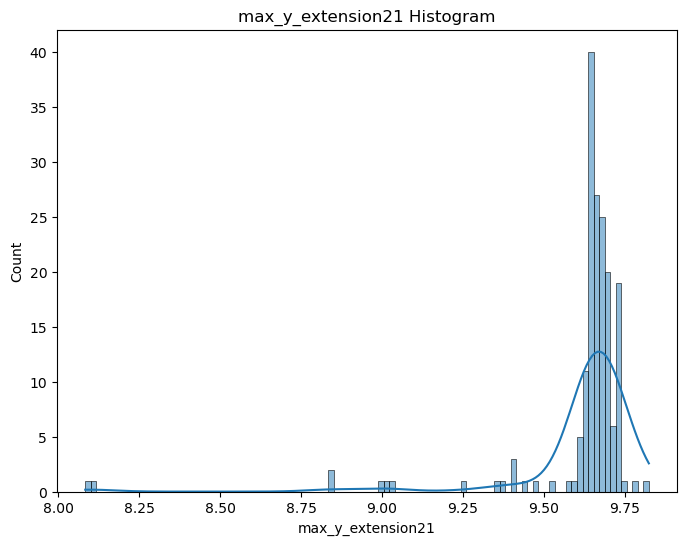

mean_acc_in_air21: Not normally distributed (p-value: 2.84711626019965e-14)


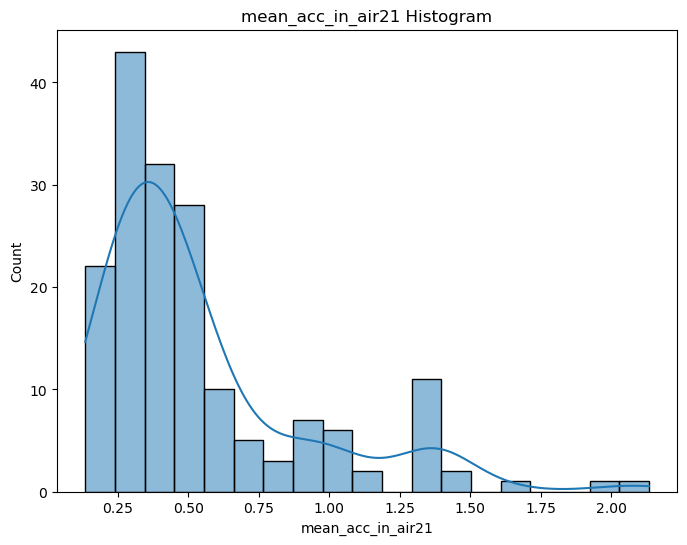

mean_speed_in_air21: Not normally distributed (p-value: 2.4912122171372175e-05)


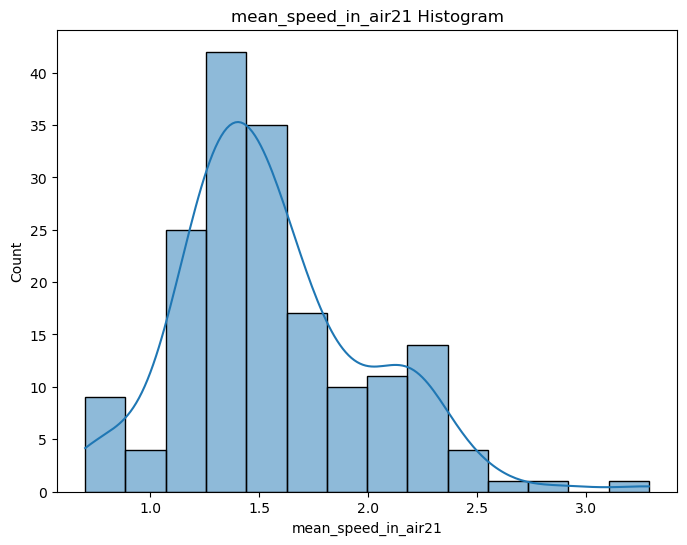

num_of_pendown21: Not normally distributed (p-value: 1.9965485989814624e-05)


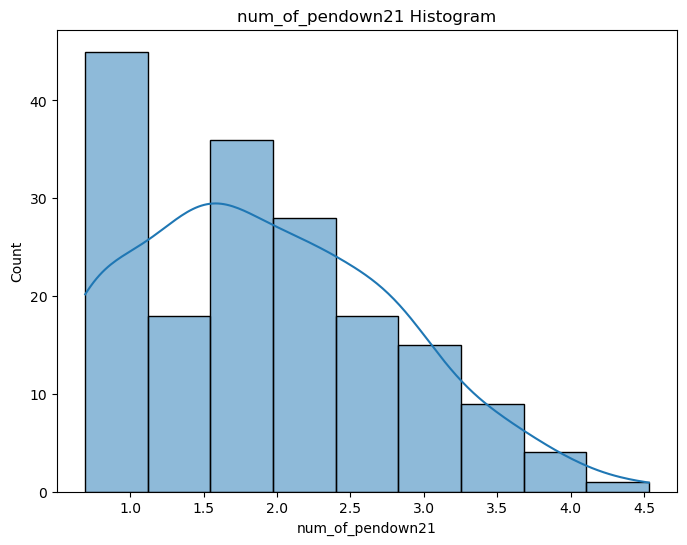

paper_time21: Normally distributed (p-value: 0.16457046568393707)


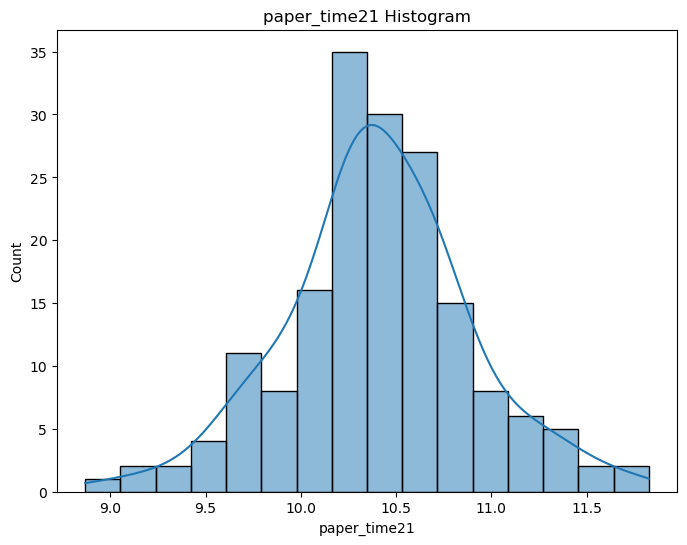

pressure_mean21: Not normally distributed (p-value: 5.194122328987616e-20)


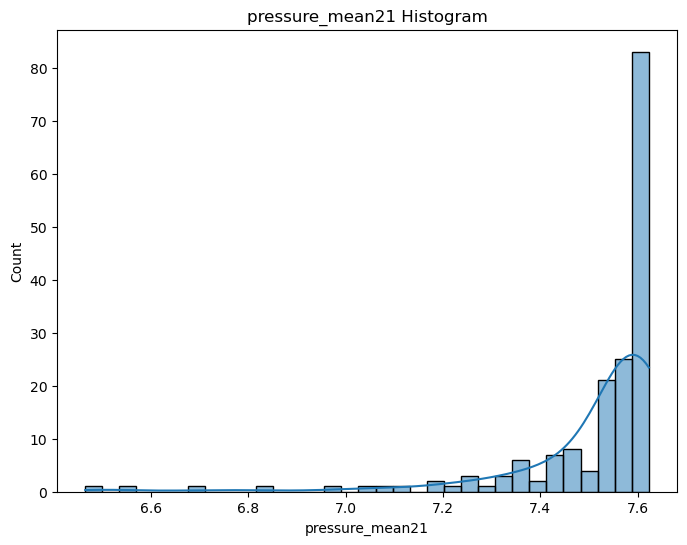

pressure_var21: Not normally distributed (p-value: 2.003181361942552e-05)


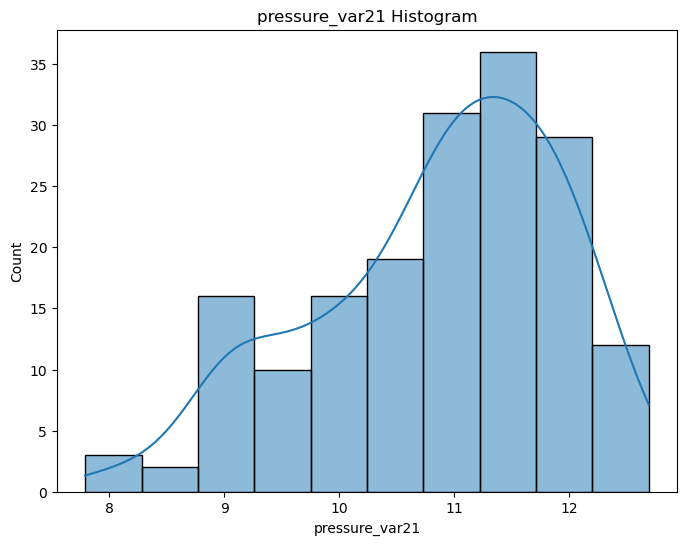

total_time21: Not normally distributed (p-value: 0.03016779012978077)


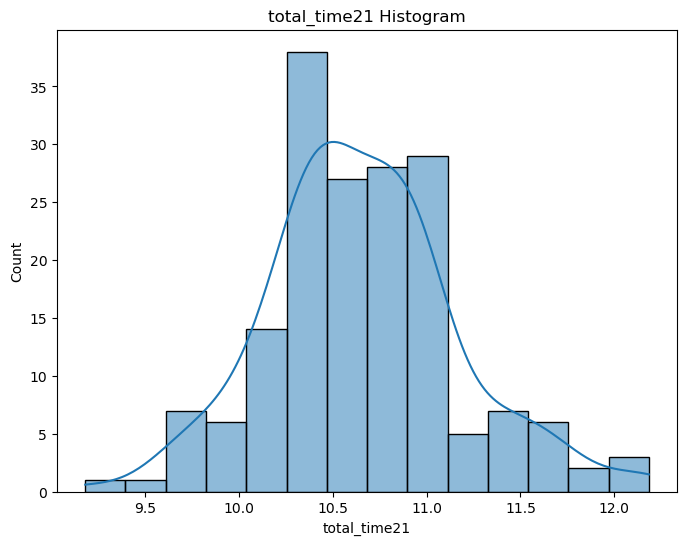

air_time22: Not normally distributed (p-value: 1.840820940124388e-09)


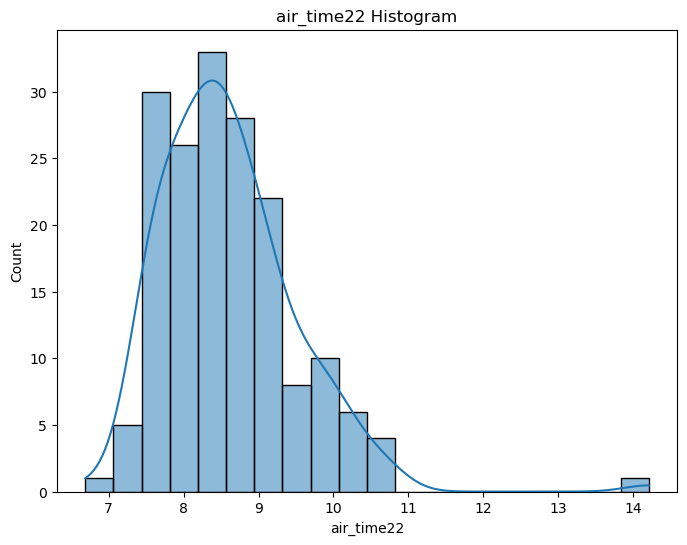

gmrt_in_air22: Normally distributed (p-value: 0.06383130699396133)


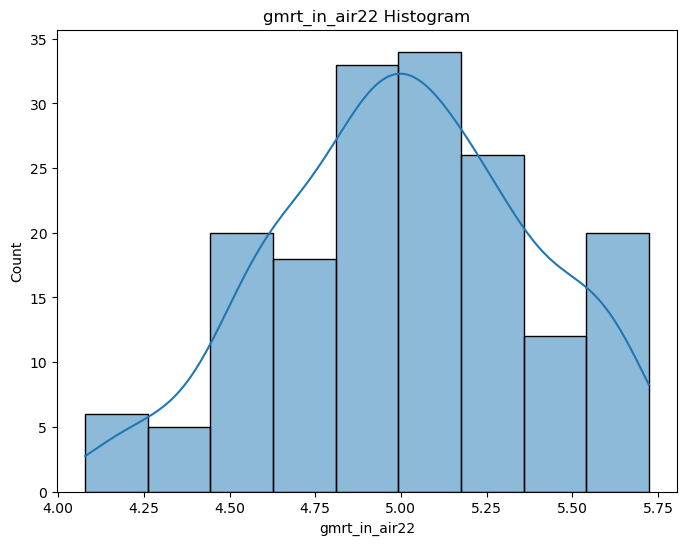

gmrt_on_paper22: Normally distributed (p-value: 0.21385954320430756)


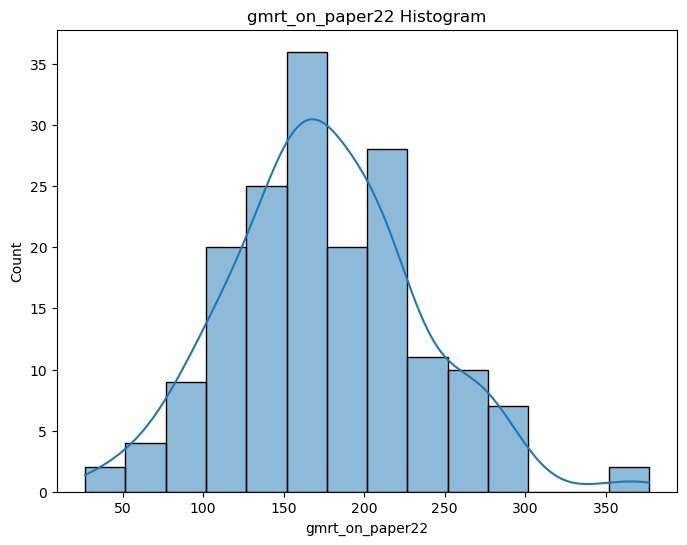

max_x_extension22: Not normally distributed (p-value: 6.409021011677396e-07)


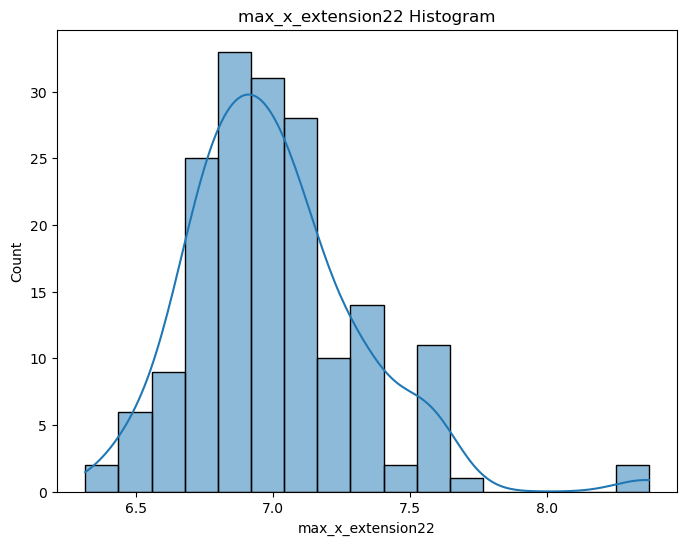

max_y_extension22: Normally distributed (p-value: 0.12974785268306732)


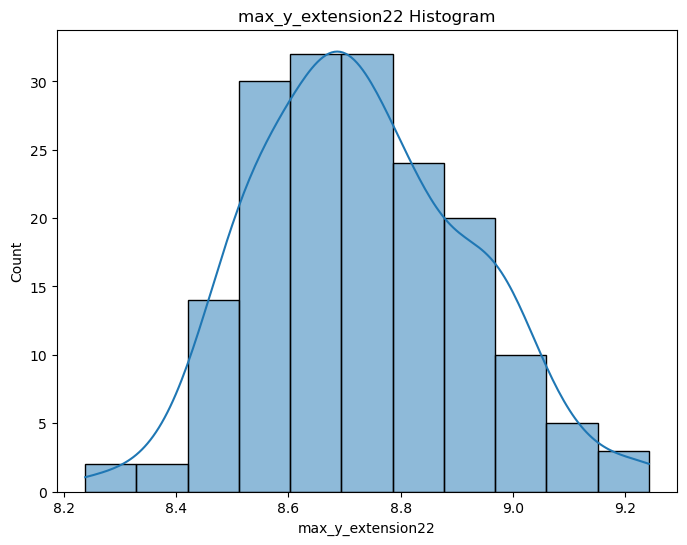

mean_gmrt22: Normally distributed (p-value: 0.08634176850318909)


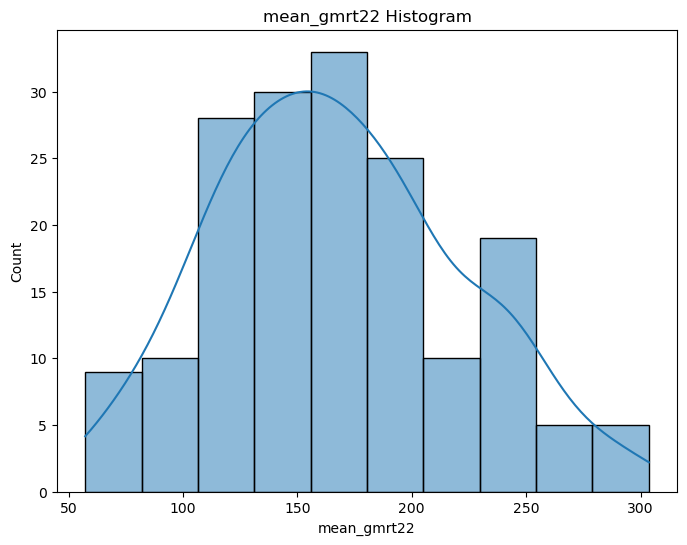

num_of_pendown22: Not normally distributed (p-value: 2.5820750051974706e-11)


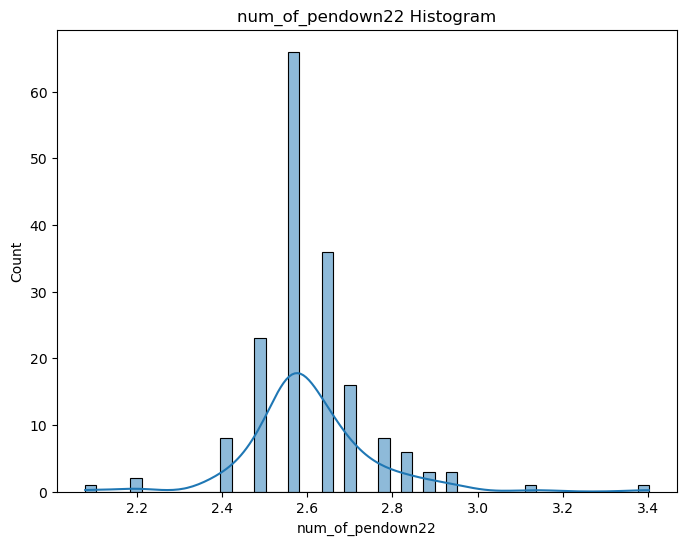

paper_time22: Not normally distributed (p-value: 1.1242840969316603e-07)


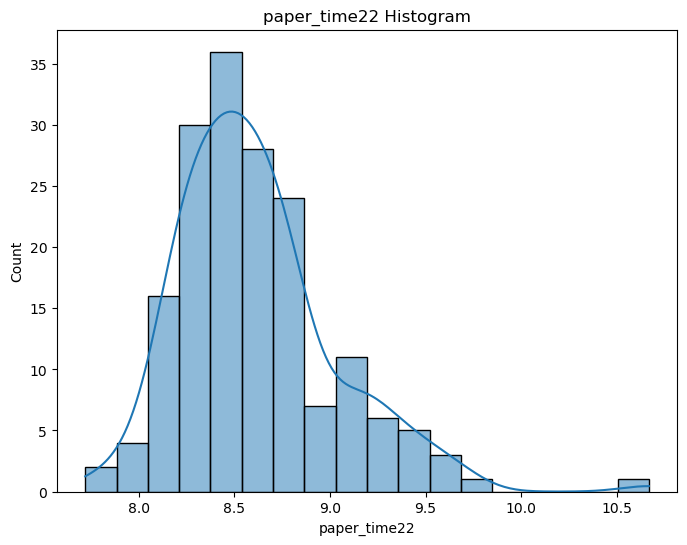

pressure_mean22: Not normally distributed (p-value: 2.7610804979448945e-15)


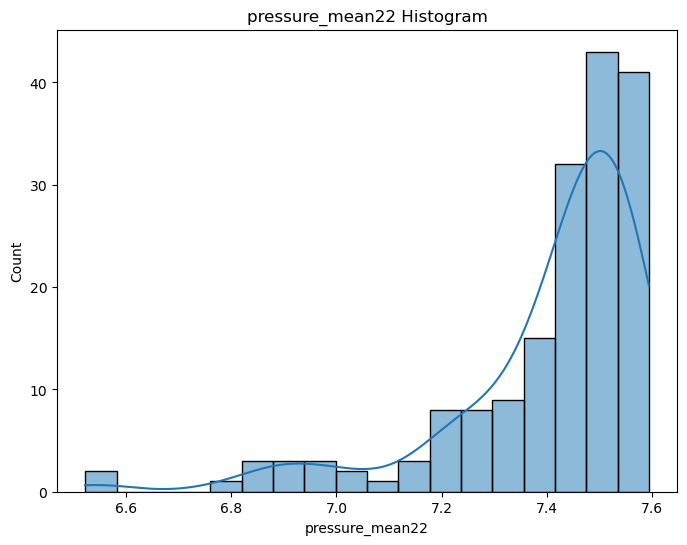

pressure_var22: Normally distributed (p-value: 0.400381863117218)


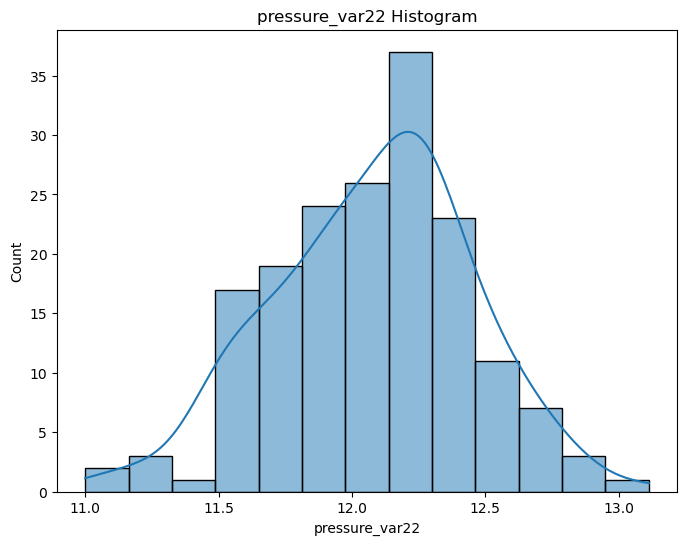

air_time23: Not normally distributed (p-value: 2.2382847575386222e-08)


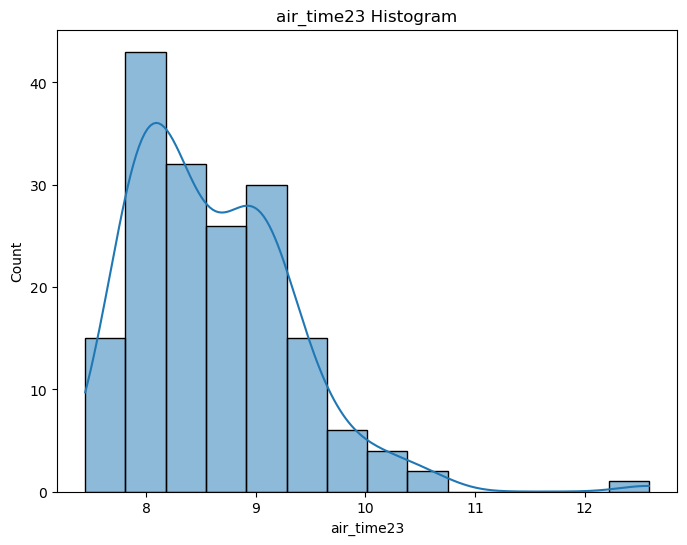

gmrt_in_air23: Not normally distributed (p-value: 0.0066553871147334576)


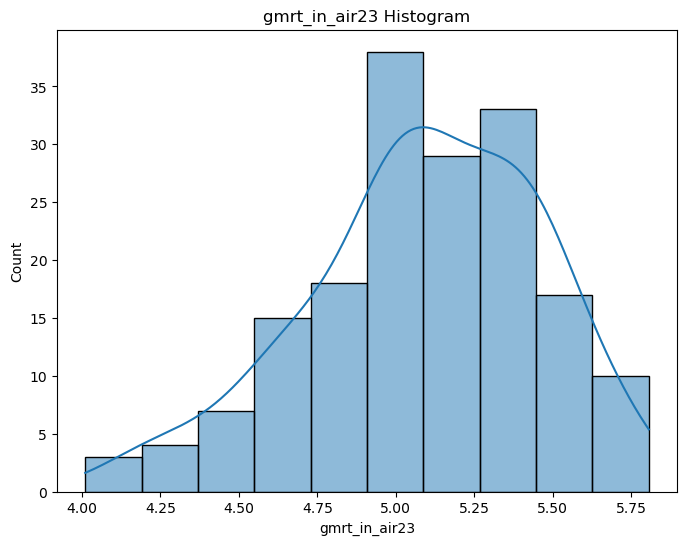

gmrt_on_paper23: Normally distributed (p-value: 0.1497705727815628)


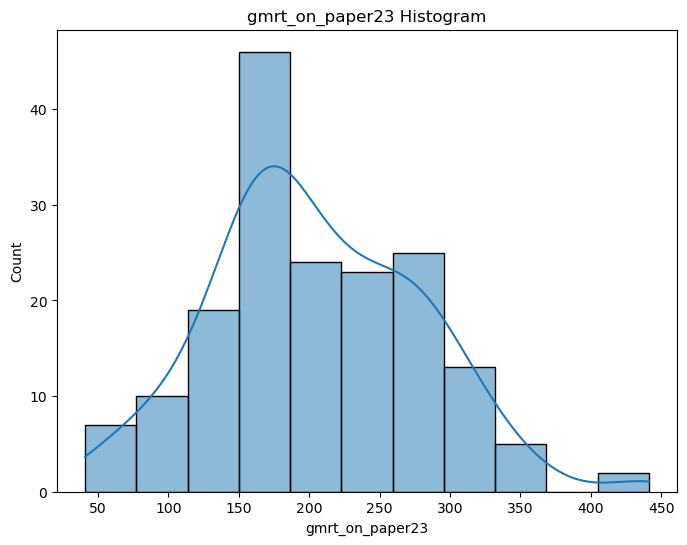

max_x_extension23: Not normally distributed (p-value: 1.7320309683016566e-12)


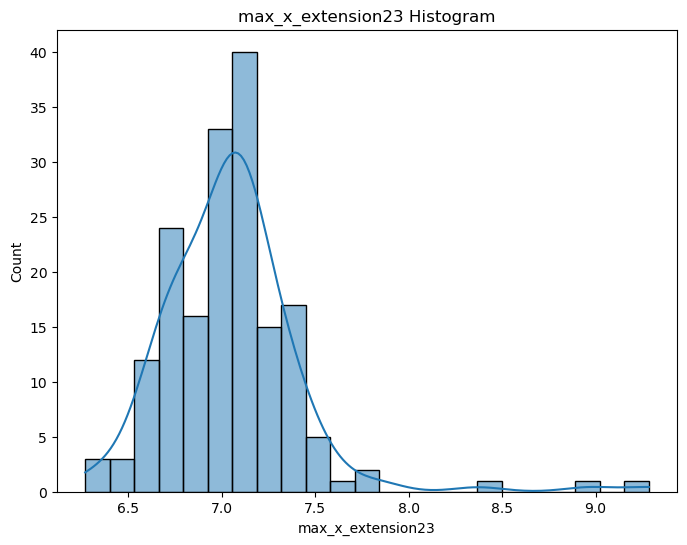

max_y_extension23: Normally distributed (p-value: 0.3110130727291107)


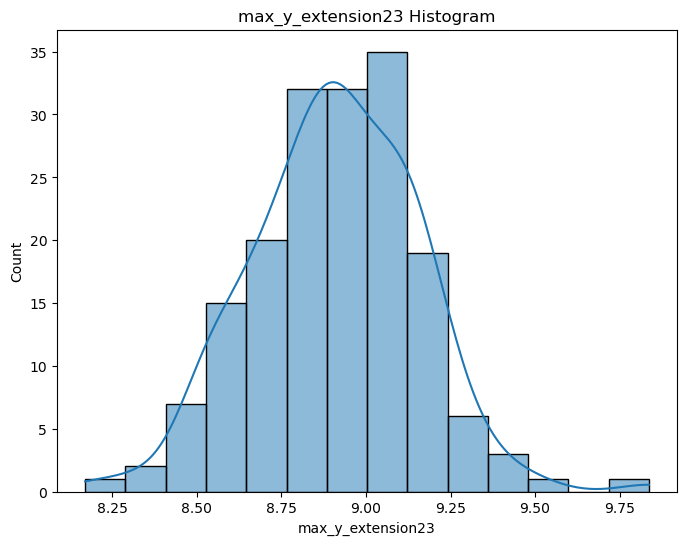

mean_gmrt23: Normally distributed (p-value: 0.17320284247398376)


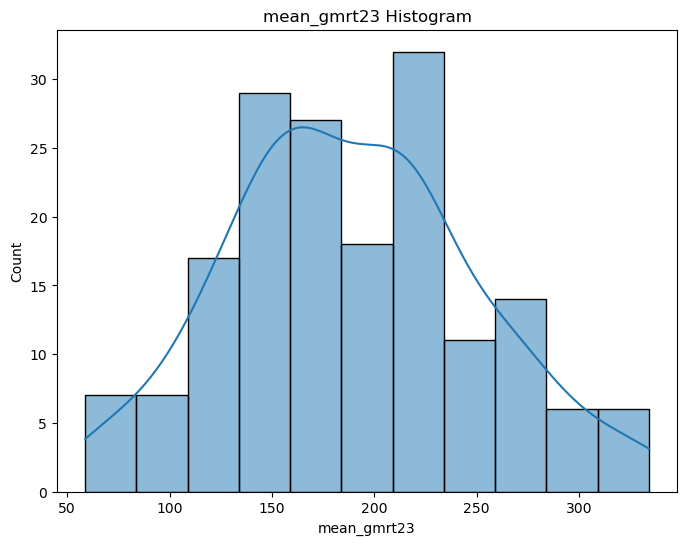

num_of_pendown23: Not normally distributed (p-value: 7.926066747376836e-11)


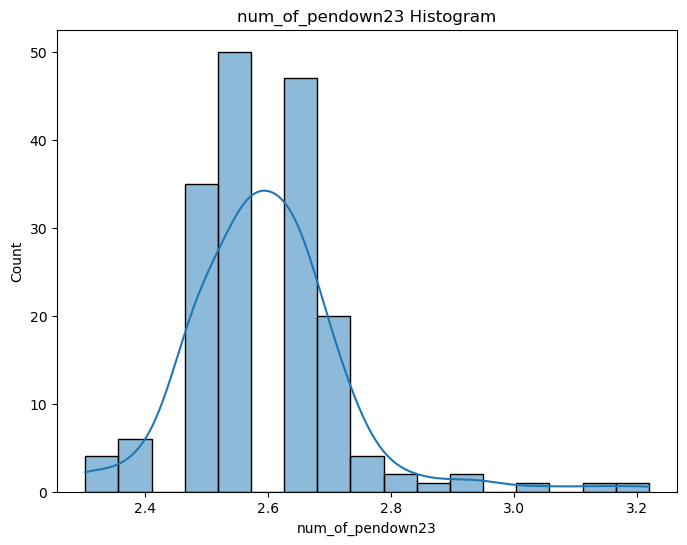

paper_time23: Not normally distributed (p-value: 3.193130482248563e-10)


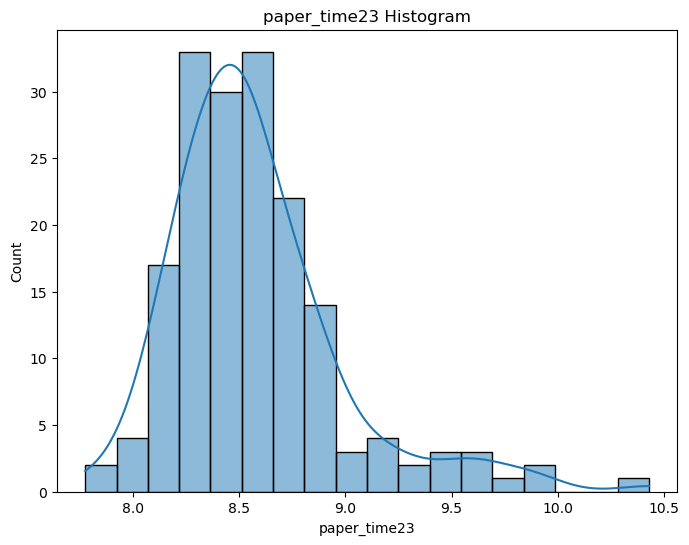

pressure_mean23: Not normally distributed (p-value: 1.278641973659518e-15)


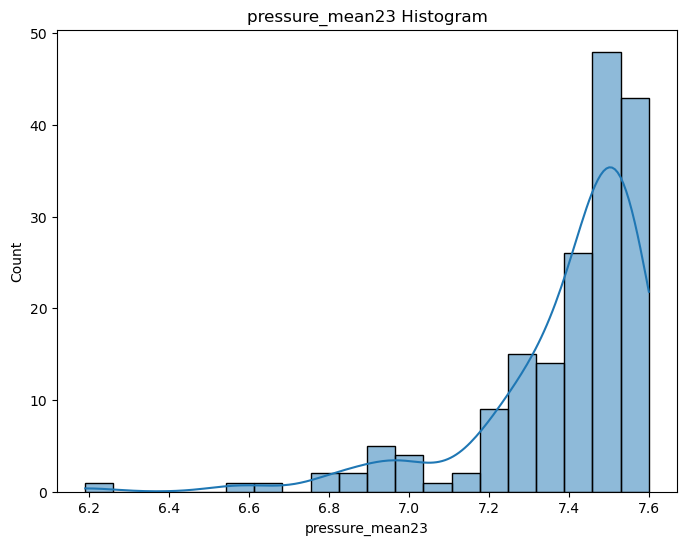

pressure_var23: Not normally distributed (p-value: 0.00022610924497712404)


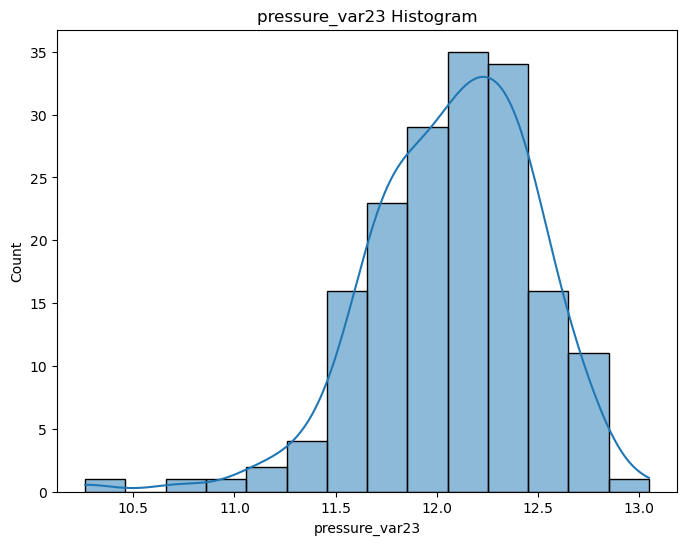

air_time24: Not normally distributed (p-value: 0.001259656623005867)


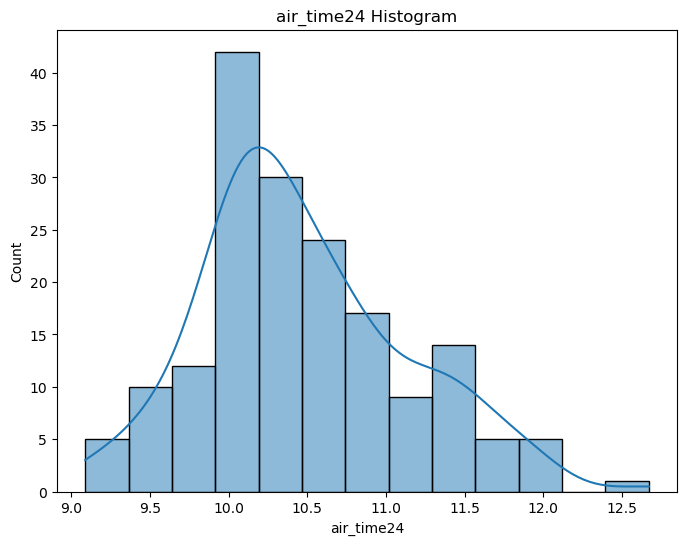

gmrt_in_air24: Normally distributed (p-value: 0.711179256439209)


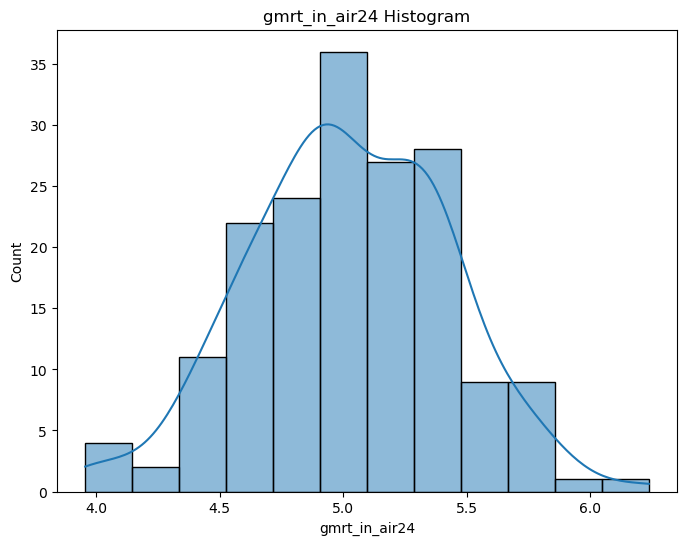

gmrt_on_paper24: Normally distributed (p-value: 0.3921167254447937)


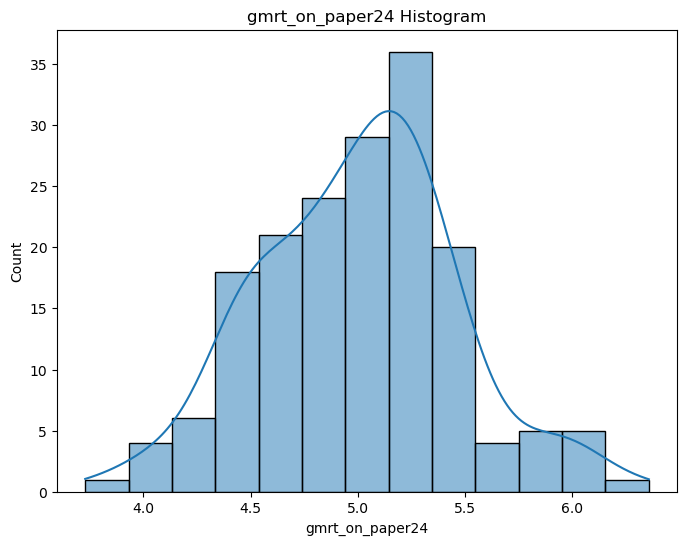

max_x_extension24: Not normally distributed (p-value: 0.015031039714813232)


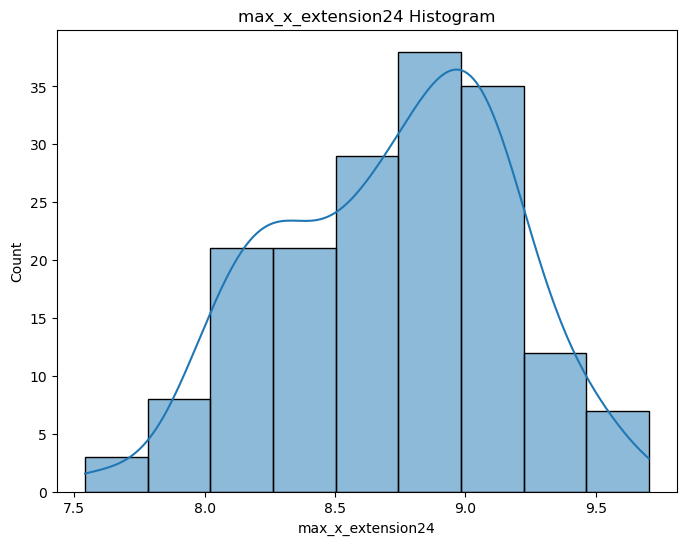

max_y_extension24: Not normally distributed (p-value: 0.0018899893620982766)


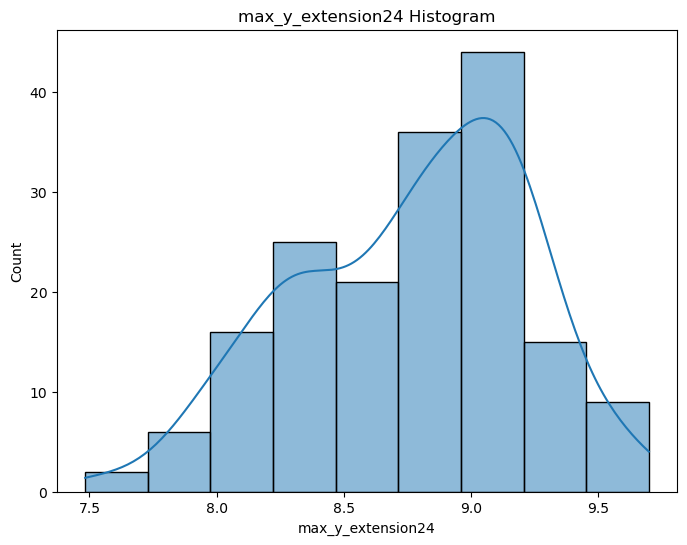

mean_speed_on_paper24: Normally distributed (p-value: 0.0903850570321083)


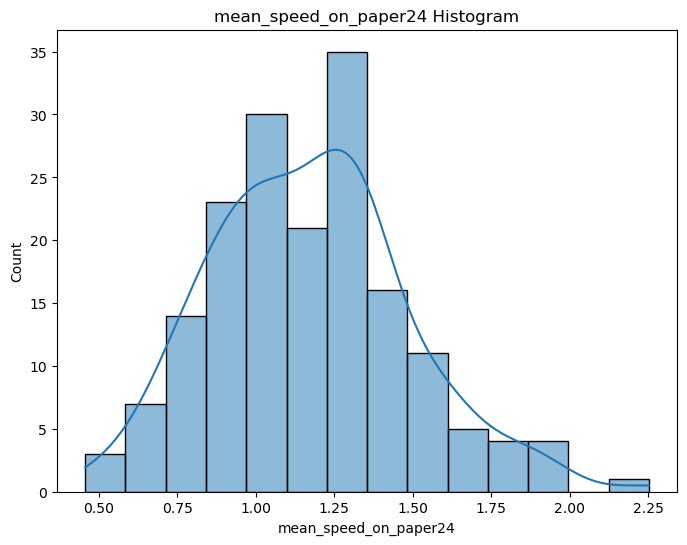

num_of_pendown24: Not normally distributed (p-value: 2.5705819851201683e-12)


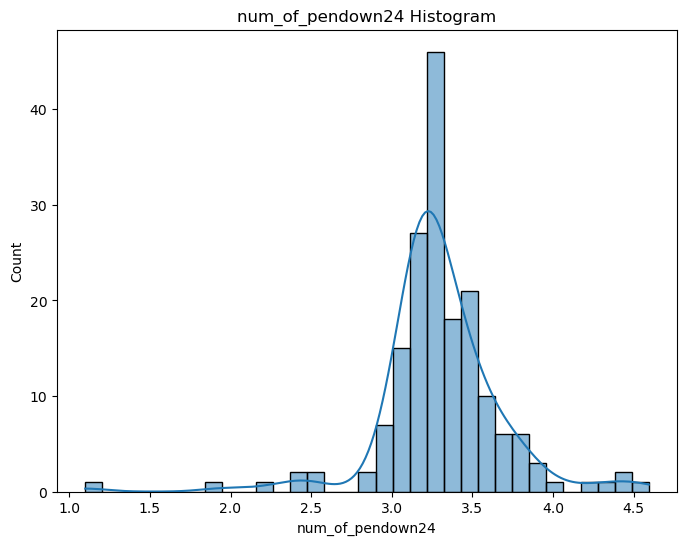

paper_time24: Normally distributed (p-value: 0.3440977931022644)


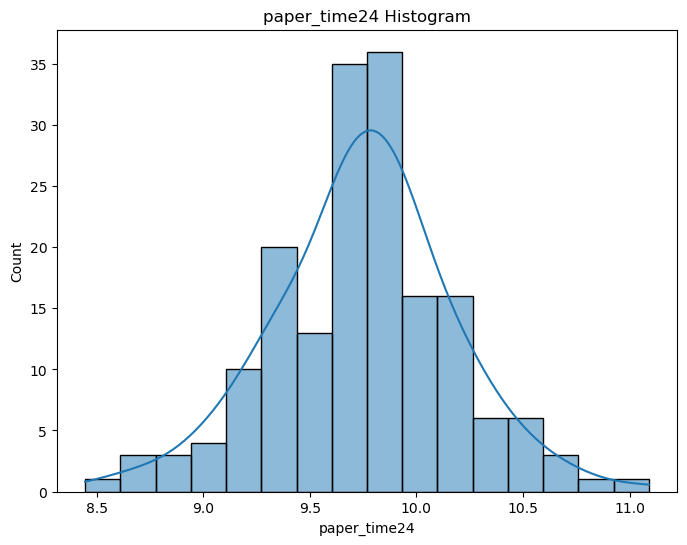

pressure_mean24: Not normally distributed (p-value: 4.2147745356487226e-15)


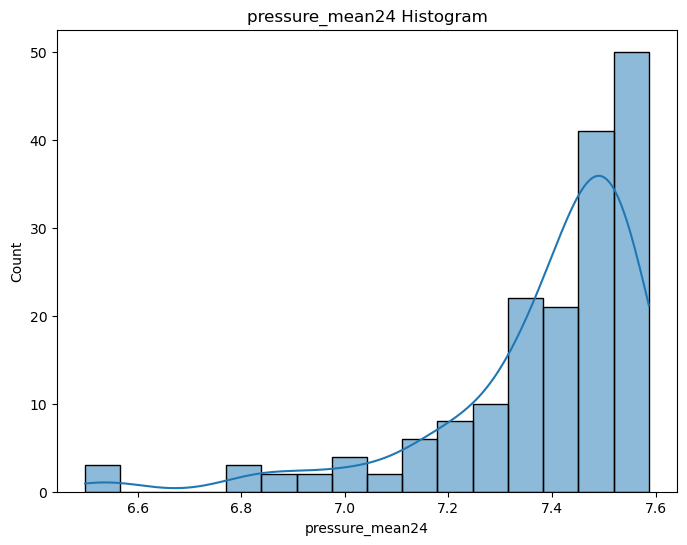

pressure_var24: Normally distributed (p-value: 0.2989948093891144)


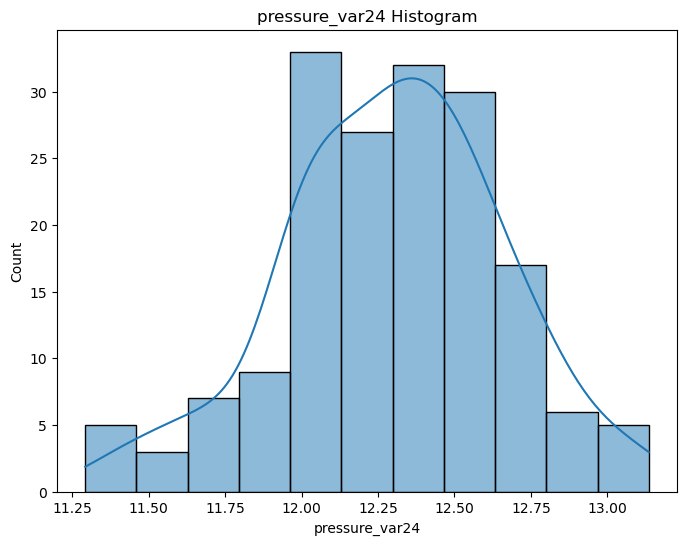

air_time25: Not normally distributed (p-value: 5.746380038473831e-10)


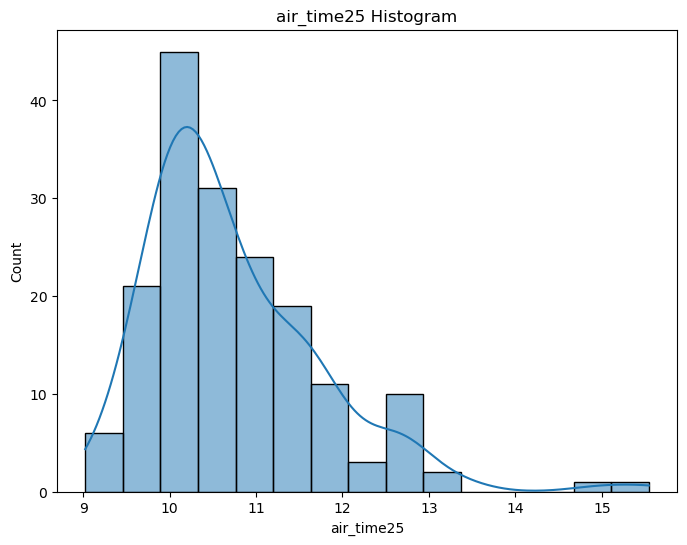

gmrt_in_air25: Not normally distributed (p-value: 0.014860849827528)


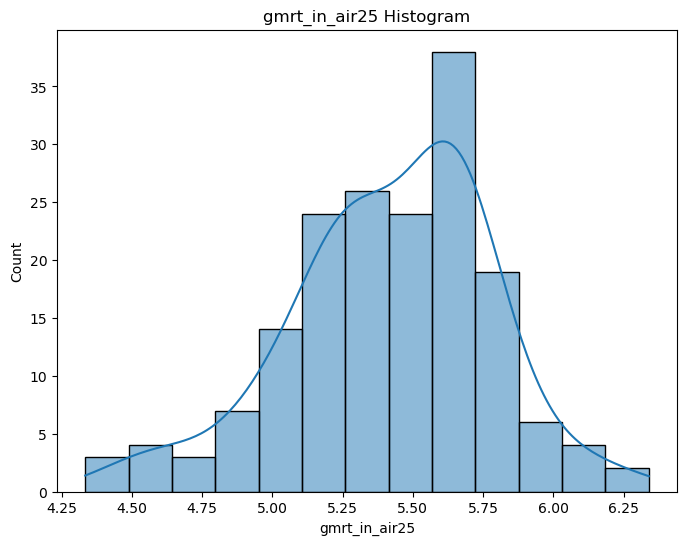

gmrt_on_paper25: Normally distributed (p-value: 0.44225162267684937)


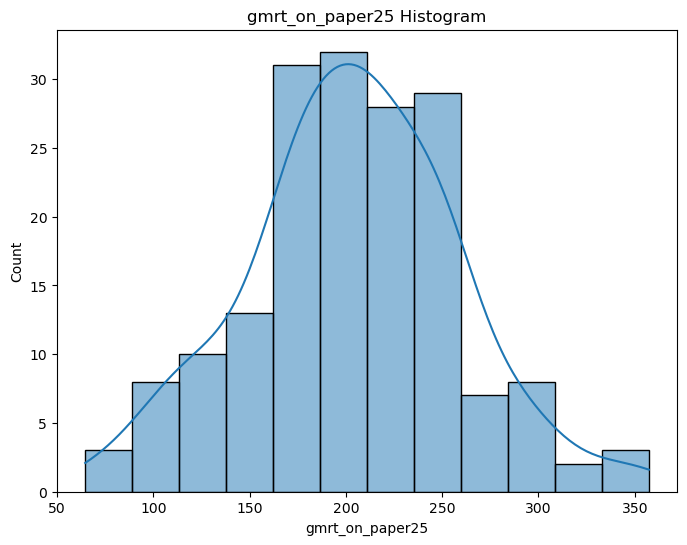

max_x_extension25: Not normally distributed (p-value: 0.0005910273757763207)


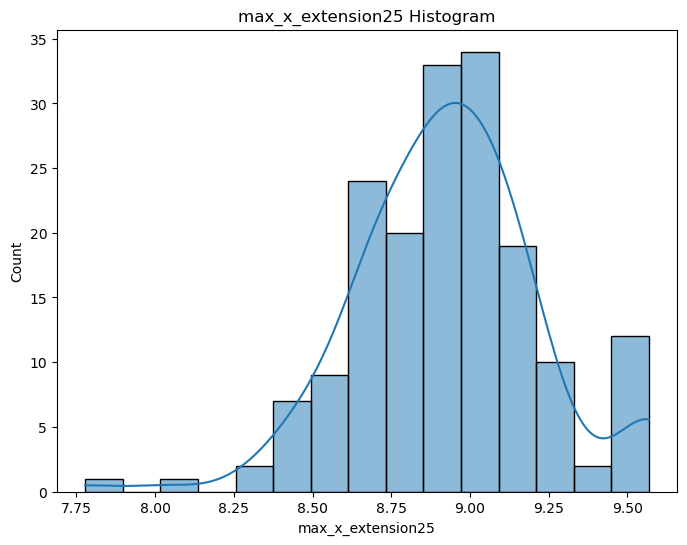

max_y_extension25: Not normally distributed (p-value: 0.00023294304264709353)


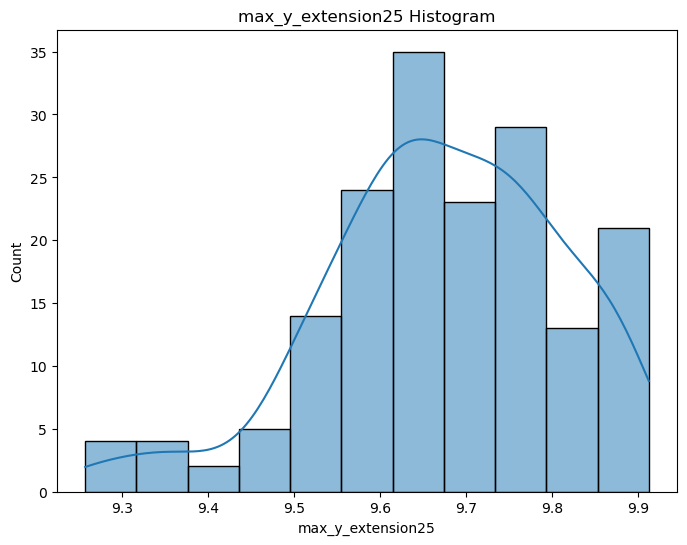

mean_gmrt25: Not normally distributed (p-value: 0.000282899709418416)


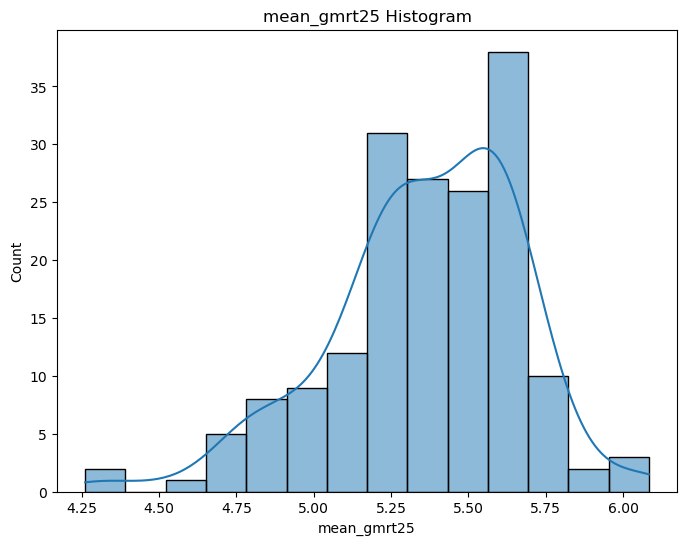

num_of_pendown25: Normally distributed (p-value: 0.4818323850631714)


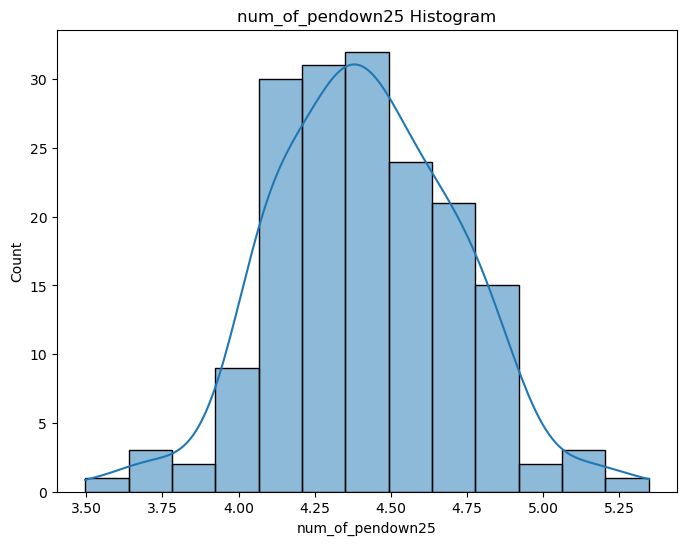

paper_time25: Not normally distributed (p-value: 9.483613894190057e-08)


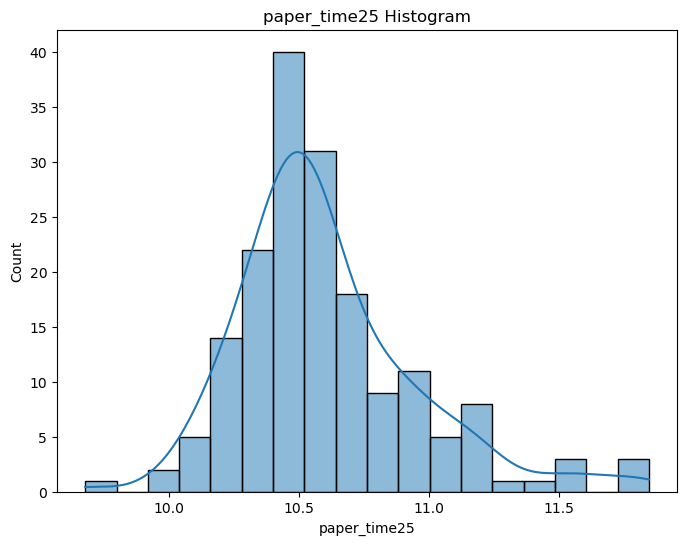

pressure_mean25: Not normally distributed (p-value: 7.626888474380653e-17)


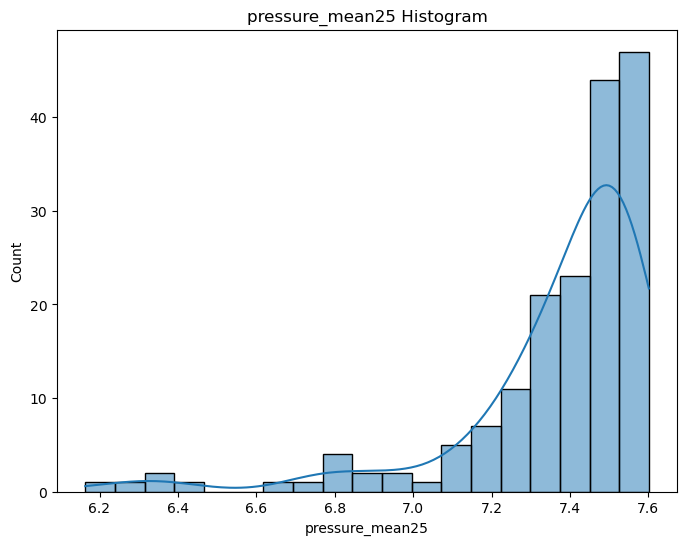

pressure_var25: Not normally distributed (p-value: 5.066341327619739e-05)


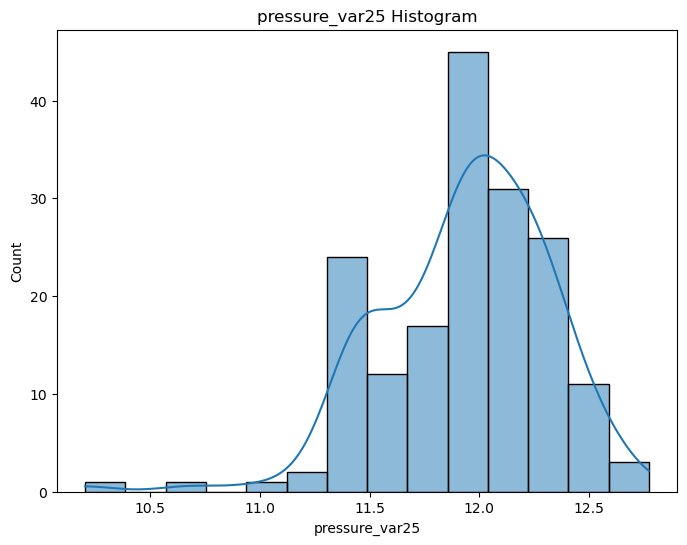

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import shapiro

# Load your dataset into a pandas DataFrame
#df = pd.read_csv('your_dataset.csv')

# Exclude the 'class' column from the analysis
columns_to_check = [col for col in new_data.columns if col != 'class']

for column in columns_to_check:
    df = new_data[column]
    
    # Check for normality using Shapiro-Wilk test
    stat, p = shapiro(df)
    
    # Set a significance level (e.g., 0.05) for the test
    alpha = 0.05
    
    if p > alpha:
        print(f'{column}: Normally distributed (p-value: {p})')
    else:
        print(f'{column}: Not normally distributed (p-value: {p})')
    
    # Create a histogram for visualization
    plt.figure(figsize=(8, 6))
    sns.histplot(df, kde=True)
    plt.title(f'{column} Histogram')
    plt.show()


In [34]:
new_data.head()

,air_time1,gmrt_in_air1,gmrt_on_paper1,max_x_extension1,max_y_extension1,mean_gmrt1,mean_speed_in_air1,num_of_pendown1,paper_time1,pressure_mean1,...,gmrt_in_air25,gmrt_on_paper25,max_x_extension25,max_y_extension25,mean_gmrt25,num_of_pendown25,paper_time25,pressure_mean25,pressure_var25,class
0,8.548886,4.802415,4.475669,6.864848,8.795128,4.652328,1.039597,3.135494,9.280892,7.426687,...,5.637031,219.829989,9.217018,9.490696,5.524373,4.276666,10.599655,7.467530,12.598465,1
1,10.858634,4.756330,4.436144,7.435438,8.853523,4.608997,1.035937,2.484907,9.430359,7.452502,...,4.467262,68.398886,8.904630,9.634496,4.360016,4.867534,11.749585,7.317059,12.538054,1
2,7.863651,5.442132,5.157686,7.755339,8.666130,5.309989,1.476670,2.397895,8.712924,7.327290,...,5.377034,171.954494,8.947546,9.555914,5.271290,4.317488,10.725050,7.267137,11.880430,1
3,7.664347,5.914593,5.215985,7.471363,9.006999,5.625094,1.805416,2.397895,8.629807,7.557471,...,5.340216,118.573956,8.763741,9.610056,5.100268,4.820282,11.126469,7.290868,12.346642,1
4,7.745436,5.556817,4.720959,6.895683,8.462315,5.223791,1.569585,2.197225,8.314097,7.506658,...,5.126998,126.678802,8.439232,9.650722,4.997852,4.532599,10.526373,7.518989,11.972191,1


In [17]:
# Define features and target variable
X = new_data.drop(columns=['class'])
y = new_data[['class']]

In [18]:
type(y)

pandas.core.frame.DataFrame

In [19]:
from sklearn.preprocessing import StandardScaler

# Initialize the StandardScaler
scaler = StandardScaler()

# Convert the scaled data back to a DataFrame with column names and data types
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns, index=X.index)

In [20]:
# Split the dataset into a training set (70%) and a test set (30%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [21]:
print(type(X_train))  # Output: <class 'pandas.core.frame.DataFrame'>
print(type(X_test))   # Output: <class 'pandas.core.frame.DataFrame'>
print(type(y_train))  # Output: <class 'pandas.core.series.Series'>
print(type(y_test))   # Output: <class 'pandas.core.series.Series'>

<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>
<class 'pandas.core.frame.DataFrame'>


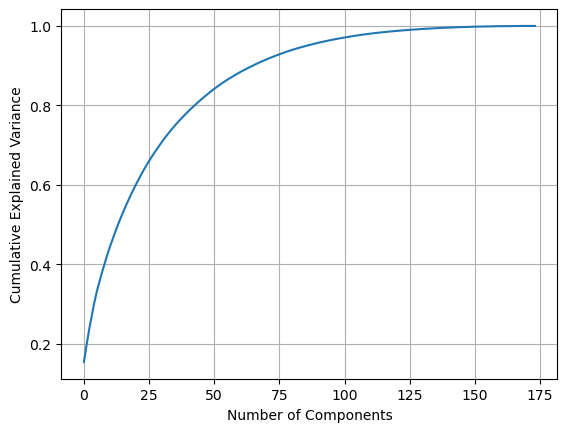

In [43]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Fit the PCA transformer to your data
pca = PCA()
pca.fit(X)

# Calculate the cumulative explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# Plot the cumulative explained variance
plt.plot(cumulative_variance)
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Explained Variance")
plt.grid()
plt.show()


In [44]:
from sklearn.decomposition import PCA

# Fit the PCA transformer to your data
pca = PCA()
pca.fit(X)

# Set the desired explained variance threshold (e.g., 95%)
desired_variance = 0.95

# Calculate the cumulative explained variance
explained_variance = pca.explained_variance_ratio_
cumulative_variance = explained_variance.cumsum()

# Find the number of components that exceed the desired variance
n_components = (cumulative_variance >= desired_variance).argmax() + 1

print(f"Number of components to explain {desired_variance * 100}% of variance: {n_components}")


Number of components to explain 95.0% of variance: 87


In [45]:
from sklearn.decomposition import PCA

# Create a PCA transformer with a reduced number of components (e.g., 9)
pca = PCA(n_components=0.95)

# Fit PCA on the training data and transform both the training and test data
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)


In [49]:
print("Number of samples in X_train_pca:", X_train_pca.shape[0])
print("Number of samples in X_test_pca:", X_test_pca.shape[0])

Number of samples in X_train_pca: 139
Number of samples in X_test_pca: 35


In [40]:
from sklearn.metrics import  accuracy_score, confusion_matrix, ConfusionMatrixDisplay ,recall_score, precision_score, f1_score, classification_report 

import xgboost as xgb
from lightgbm import LGBMClassifier
import lazypredict
from lazypredict.Supervised import LazyClassifier

import time
import warnings
warnings.filterwarnings('ignore')

In [41]:
from IPython.display import clear_output

clf = LazyClassifier(verbose=0,
                     ignore_warnings=True,
                     custom_metric=None,
                     predictions=False,
                     random_state=3,
                     classifiers='all')

models, predictions = clf.fit(X_train, X_test, y_train, y_test)

# Clear the output
clear_output()

In [42]:
models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
XGBClassifier,0.91,0.93,0.93,0.91,0.45
AdaBoostClassifier,0.89,0.89,0.89,0.89,1.46
ExtraTreesClassifier,0.89,0.89,0.89,0.89,0.39
RandomForestClassifier,0.89,0.89,0.89,0.89,0.71
LGBMClassifier,0.89,0.89,0.89,0.89,0.25
NuSVC,0.86,0.86,0.86,0.86,0.08
LogisticRegression,0.86,0.86,0.86,0.86,0.09
SVC,0.86,0.86,0.86,0.86,0.07
CalibratedClassifierCV,0.86,0.86,0.86,0.86,0.17


**Classifiers after PCA**

In [50]:
from IPython.display import clear_output

pca_clf = LazyClassifier(verbose=0,
                     ignore_warnings=True,
                     custom_metric=None,
                     predictions=False,
                     random_state=3,
                     classifiers='all')

pca_models, predictions = pca_clf.fit(X_train_pca, X_test_pca, y_train, y_test)

# Clear the output
clear_output()

In [51]:
pca_models

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.91,0.93,0.93,0.91,0.16
SGDClassifier,0.91,0.93,0.93,0.91,0.05
Perceptron,0.89,0.90,0.90,0.89,0.06
RandomForestClassifier,0.89,0.90,0.90,0.89,0.64
AdaBoostClassifier,0.89,0.90,0.90,0.89,0.68
RidgeClassifierCV,0.89,0.89,0.89,0.89,0.07
RidgeClassifier,0.89,0.89,0.89,0.89,0.05
LinearDiscriminantAnalysis,0.89,0.89,0.89,0.89,0.07
LogisticRegression,0.89,0.89,0.89,0.89,0.07


In [52]:
from sklearn.ensemble import RandomForestClassifier

# Create a Random Forest classifier
clf = RandomForestClassifier(random_state=42)

# Train the classifier on the training data
clf.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [53]:
y_pred = clf.predict(X_test)

In [54]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Model Metrics:")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")


Model Metrics:
Accuracy: 88.57%
Precision: 89.26%
Recall: 88.57%
F1-Score: 88.63%


In [55]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for Random Forest
param_grid = {
    'n_estimators': [100, 200, 500],
    'max_depth': [3, 5, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create a RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=42)

# Use GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=rf_classifier, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the best parameters and best model
best_params = grid_search.best_params_
best_rf_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred_best = best_rf_model.predict(X_test)

# Calculate metrics
accuracy_best = accuracy_score(y_test, y_pred_best)
precision_best = precision_score(y_test, y_pred_best)
recall_best = recall_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)

# Print metrics
print("Best Model Metrics:")
print("Accuracy:", accuracy_best)
print("Precision:", precision_best)
print("Recall:", recall_best)
print("F1-Score:", f1_best)


Best Model Metrics:
Accuracy: 0.8857142857142857
Precision: 0.9444444444444444
Recall: 0.85
F1-Score: 0.8947368421052632


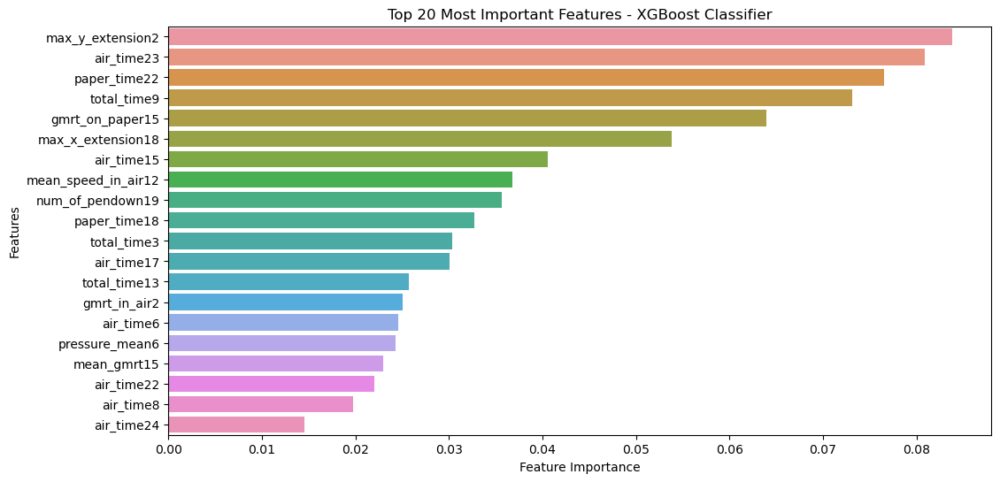

Model Metrics:
Accuracy: 91.43%
Precision: 92.86%
Recall: 91.43%
F1-Score: 91.47%


In [22]:
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# Create an XGBoost classifier
xgb_clf = XGBClassifier(random_state=42)

# Train the classifier on the training data
xgb_clf.fit(X_train, y_train)
y_pred = xgb_clf.predict(X_test)

# Get feature importances
feature_importances = xgb_clf.feature_importances_

# Get indices of the top 20 features
top_20_indices = feature_importances.argsort()[-20:][::-1]

# Get the names of the top 20 features
top_20_features = X_train.columns[top_20_indices]

# Plot feature importances
plt.figure(figsize=(12, 6))
sns.barplot(x=feature_importances[top_20_indices], y=top_20_features)
plt.title("Top 20 Most Important Features - XGBoost Classifier")
plt.xlabel("Feature Importance")
plt.ylabel("Features")
plt.show()

# Evaluate the model metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Model Metrics:")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")

In [23]:
import pandas as pd

# Create a DataFrame of top 20 features and scores
top_20_features_df = pd.DataFrame({
    'Feature': top_20_features,
    'Importance Score': feature_importances[top_20_indices]
})

# Print the DataFrame in a table format
print(top_20_features_df.to_string())


                Feature  Importance Score
0      max_y_extension2          0.083790
1            air_time23          0.080852
2          paper_time22          0.076472
3           total_time9          0.073116
4       gmrt_on_paper15          0.063937
5     max_x_extension18          0.053813
6            air_time15          0.040530
7   mean_speed_in_air12          0.036798
8      num_of_pendown19          0.035610
9          paper_time18          0.032679
10          total_time3          0.030341
11           air_time17          0.030035
12         total_time13          0.025723
13         gmrt_in_air2          0.025026
14            air_time6          0.024599
15       pressure_mean6          0.024340
16          mean_gmrt15          0.022927
17           air_time22          0.022053
18            air_time8          0.019750
19           air_time24          0.014558


In [25]:
from sklearn.metrics import confusion_matrix

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Print the confusion matrix
print(conf_matrix)

[[15  0]
 [ 3 17]]


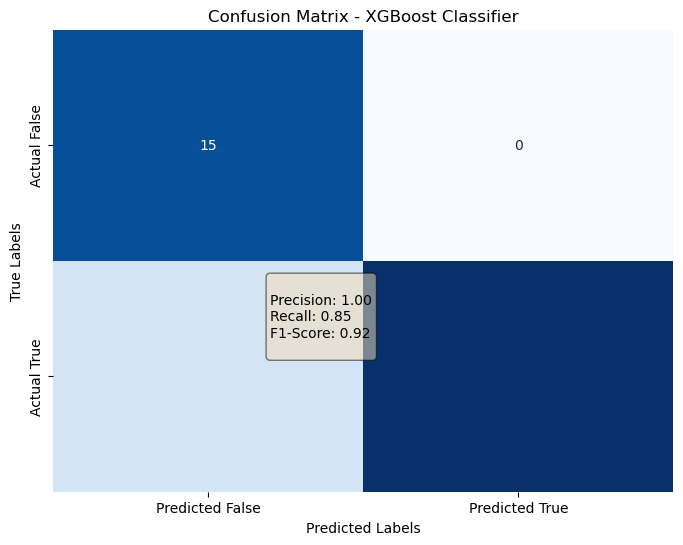

In [26]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
import seaborn as sns

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)

# Calculate precision, recall, and F1-score
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Create a text box to display metrics
metrics_text = f"""
Precision: {precision:.2f}
Recall: {recall:.2f}
F1-Score: {f1:.2f}
"""

# Plot confusion matrix with labels and metrics
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix - XGBoost Classifier")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.xticks(ticks=[0.5, 1.5], labels=['Predicted False', 'Predicted True'])
plt.yticks(ticks=[0.5, 1.5], labels=['Actual False', 'Actual True'])
plt.text(x=0.7, y=1.4, s=metrics_text, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
plt.show()


In [27]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score

# Generate confusion matrix and metrics
conf_matrix = confusion_matrix(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Extract TP, TN, FP, FN from the confusion matrix
tn, fp, fn, tp = conf_matrix.ravel()

# Create a table-like output with clear labels
print("Confusion Matrix Metrics:")
print("-" * 30)
print(f"True Positives (TP): {tp}")
print(f"True Negatives (TN): {tn}")
print(f"False Positives (FP): {fp}")
print(f"False Negatives (FN): {fn}")
print("-" * 30)
print(f"Precision: {precision:.2f}")
print(f"Recall: {recall:.2f}")
print(f"F1-Score: {f1:.2f}")

Confusion Matrix Metrics:
------------------------------
True Positives (TP): 17
True Negatives (TN): 15
False Positives (FP): 0
False Negatives (FN): 3
------------------------------
Precision: 1.00
Recall: 0.85
F1-Score: 0.92


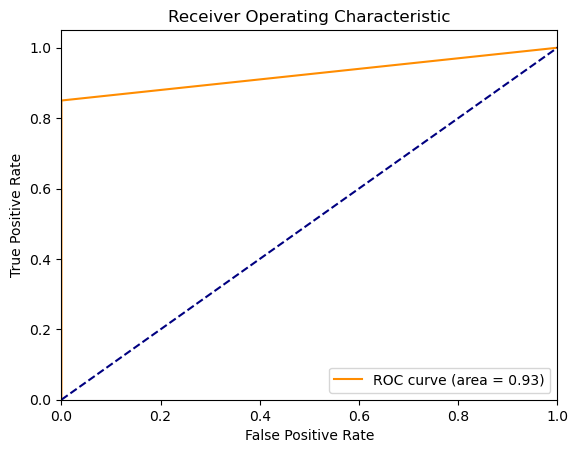

In [28]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
fpr, tpr, thresholds = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

In [60]:
print("X_train shape:",X_train.shape)
print("X_test shape:",X_test.shape)
print("y_train shape:",y_train.shape)
print("y_test shape:",y_test.shape)

X_train shape: (139, 277)
X_test shape: (35, 277)
y_train shape: (139, 1)
y_test shape: (35, 1)


In [61]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Create an XGBoost classifier
clf = XGBClassifier(random_state=42)

# Define the parameter grid
param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'n_estimators': [50, 100, 200],
}

# Use GridSearchCV to find the best parameters
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_
print("Best Parameters:", best_params)

# Use the best parameters to train the model
best_clf = XGBClassifier(**best_params, random_state=42)
best_clf.fit(X_train, y_train)

# Make predictions and evaluate the model
y_pred = best_clf.predict(X_test)
# Add your evaluation metrics here
# Evaluate the model metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("Model Metrics:")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")

Best Parameters: {'learning_rate': 0.2, 'max_depth': 4, 'n_estimators': 50}
Model Metrics:
Accuracy: 91.43%
Precision: 92.86%
Recall: 91.43%
F1-Score: 91.47%


In [62]:
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Create a CatBoost classifier
catboost_clf = CatBoostClassifier(random_state=42)

# Train the classifier on the training data
catboost_clf.fit(X_train, y_train)

# Make predictions
y_pred_catboost = catboost_clf.predict(X_test)

# Evaluate the model metrics
accuracy_catboost = accuracy_score(y_test, y_pred_catboost)
precision_catboost = precision_score(y_test, y_pred_catboost, average='weighted')
recall_catboost = recall_score(y_test, y_pred_catboost, average='weighted')
f1_catboost = f1_score(y_test, y_pred_catboost, average='weighted')

print("CatBoost Model Metrics:")
print(f"Accuracy: {accuracy_catboost * 100:.2f}%")
print(f"Precision: {precision_catboost * 100:.2f}%")
print(f"Recall: {recall_catboost * 100:.2f}%")
print(f"F1-Score: {f1_catboost * 100:.2f}%")


Learning rate set to 0.004436
0:	learn: 0.6894644	total: 198ms	remaining: 3m 18s
1:	learn: 0.6867461	total: 278ms	remaining: 2m 18s
2:	learn: 0.6829446	total: 333ms	remaining: 1m 50s
3:	learn: 0.6794472	total: 386ms	remaining: 1m 36s
4:	learn: 0.6762974	total: 563ms	remaining: 1m 52s
5:	learn: 0.6726543	total: 630ms	remaining: 1m 44s
6:	learn: 0.6695090	total: 681ms	remaining: 1m 36s
7:	learn: 0.6662067	total: 729ms	remaining: 1m 30s
8:	learn: 0.6633887	total: 783ms	remaining: 1m 26s
9:	learn: 0.6599078	total: 860ms	remaining: 1m 25s
10:	learn: 0.6569309	total: 908ms	remaining: 1m 21s
11:	learn: 0.6541215	total: 956ms	remaining: 1m 18s
12:	learn: 0.6509068	total: 1.01s	remaining: 1m 16s
13:	learn: 0.6478766	total: 1.09s	remaining: 1m 16s
14:	learn: 0.6448897	total: 1.14s	remaining: 1m 15s
15:	learn: 0.6425043	total: 1.21s	remaining: 1m 14s
16:	learn: 0.6394284	total: 1.3s	remaining: 1m 14s
17:	learn: 0.6360812	total: 1.35s	remaining: 1m 13s
18:	learn: 0.6323953	total: 1.39s	remaining: 

161:	learn: 0.3329651	total: 11s	remaining: 56.8s
162:	learn: 0.3315802	total: 11s	remaining: 56.7s
163:	learn: 0.3298862	total: 11.1s	remaining: 56.7s
164:	learn: 0.3287564	total: 11.2s	remaining: 56.5s
165:	learn: 0.3278413	total: 11.2s	remaining: 56.4s
166:	learn: 0.3265713	total: 11.3s	remaining: 56.2s
167:	learn: 0.3255592	total: 11.4s	remaining: 56.4s
168:	learn: 0.3242811	total: 11.5s	remaining: 56.5s
169:	learn: 0.3231491	total: 11.6s	remaining: 56.5s
170:	learn: 0.3222436	total: 11.6s	remaining: 56.3s
171:	learn: 0.3213181	total: 11.7s	remaining: 56.1s
172:	learn: 0.3202401	total: 11.7s	remaining: 56s
173:	learn: 0.3187518	total: 11.8s	remaining: 55.9s
174:	learn: 0.3175480	total: 11.9s	remaining: 56s
175:	learn: 0.3159100	total: 12s	remaining: 56.1s
176:	learn: 0.3146700	total: 12.1s	remaining: 56.1s
177:	learn: 0.3132853	total: 12.1s	remaining: 56s
178:	learn: 0.3122951	total: 12.2s	remaining: 55.8s
179:	learn: 0.3111944	total: 12.2s	remaining: 55.7s
180:	learn: 0.3096854	to

320:	learn: 0.1906100	total: 21.7s	remaining: 45.9s
321:	learn: 0.1899316	total: 21.8s	remaining: 45.8s
322:	learn: 0.1893380	total: 21.8s	remaining: 45.7s
323:	learn: 0.1886085	total: 21.9s	remaining: 45.6s
324:	learn: 0.1880493	total: 21.9s	remaining: 45.6s
325:	learn: 0.1874211	total: 22s	remaining: 45.5s
326:	learn: 0.1867372	total: 22.1s	remaining: 45.4s
327:	learn: 0.1863377	total: 22.1s	remaining: 45.3s
328:	learn: 0.1857417	total: 22.2s	remaining: 45.2s
329:	learn: 0.1852492	total: 22.2s	remaining: 45.1s
330:	learn: 0.1845872	total: 22.3s	remaining: 45s
331:	learn: 0.1840515	total: 22.3s	remaining: 44.9s
332:	learn: 0.1835243	total: 22.4s	remaining: 44.8s
333:	learn: 0.1828728	total: 22.4s	remaining: 44.8s
334:	learn: 0.1823180	total: 22.5s	remaining: 44.7s
335:	learn: 0.1817440	total: 22.6s	remaining: 44.6s
336:	learn: 0.1811788	total: 22.6s	remaining: 44.5s
337:	learn: 0.1806538	total: 22.7s	remaining: 44.4s
338:	learn: 0.1802190	total: 22.7s	remaining: 44.4s
339:	learn: 0.17

481:	learn: 0.1213777	total: 32s	remaining: 34.4s
482:	learn: 0.1210234	total: 32.1s	remaining: 34.3s
483:	learn: 0.1207769	total: 32.1s	remaining: 34.2s
484:	learn: 0.1204896	total: 32.2s	remaining: 34.2s
485:	learn: 0.1201862	total: 32.2s	remaining: 34.1s
486:	learn: 0.1198992	total: 32.3s	remaining: 34s
487:	learn: 0.1196072	total: 32.4s	remaining: 34s
488:	learn: 0.1192985	total: 32.5s	remaining: 34s
489:	learn: 0.1189269	total: 32.6s	remaining: 33.9s
490:	learn: 0.1186349	total: 32.7s	remaining: 33.9s
491:	learn: 0.1182959	total: 32.7s	remaining: 33.8s
492:	learn: 0.1179549	total: 32.8s	remaining: 33.7s
493:	learn: 0.1177033	total: 32.8s	remaining: 33.6s
494:	learn: 0.1173555	total: 32.9s	remaining: 33.6s
495:	learn: 0.1171473	total: 33.1s	remaining: 33.6s
496:	learn: 0.1168317	total: 33.1s	remaining: 33.5s
497:	learn: 0.1164820	total: 33.2s	remaining: 33.4s
498:	learn: 0.1162231	total: 33.2s	remaining: 33.4s
499:	learn: 0.1159623	total: 33.3s	remaining: 33.3s
500:	learn: 0.115579

642:	learn: 0.0834871	total: 42.6s	remaining: 23.6s
643:	learn: 0.0833529	total: 42.7s	remaining: 23.6s
644:	learn: 0.0831655	total: 42.7s	remaining: 23.5s
645:	learn: 0.0829987	total: 42.8s	remaining: 23.5s
646:	learn: 0.0827926	total: 42.9s	remaining: 23.4s
647:	learn: 0.0826607	total: 43s	remaining: 23.4s
648:	learn: 0.0823988	total: 43s	remaining: 23.3s
649:	learn: 0.0822453	total: 43.1s	remaining: 23.2s
650:	learn: 0.0820835	total: 43.2s	remaining: 23.1s
651:	learn: 0.0818793	total: 43.2s	remaining: 23.1s
652:	learn: 0.0816741	total: 43.3s	remaining: 23s
653:	learn: 0.0815192	total: 43.3s	remaining: 22.9s
654:	learn: 0.0812652	total: 43.4s	remaining: 22.8s
655:	learn: 0.0811156	total: 43.4s	remaining: 22.8s
656:	learn: 0.0809136	total: 43.5s	remaining: 22.7s
657:	learn: 0.0807673	total: 43.5s	remaining: 22.6s
658:	learn: 0.0805531	total: 43.6s	remaining: 22.6s
659:	learn: 0.0803992	total: 43.6s	remaining: 22.5s
660:	learn: 0.0802592	total: 43.7s	remaining: 22.4s
661:	learn: 0.0800

803:	learn: 0.0604449	total: 53.2s	remaining: 13s
804:	learn: 0.0603558	total: 53.3s	remaining: 12.9s
805:	learn: 0.0602308	total: 53.4s	remaining: 12.8s
806:	learn: 0.0601173	total: 53.4s	remaining: 12.8s
807:	learn: 0.0600129	total: 53.5s	remaining: 12.7s
808:	learn: 0.0598906	total: 53.5s	remaining: 12.6s
809:	learn: 0.0597873	total: 53.6s	remaining: 12.6s
810:	learn: 0.0596844	total: 53.6s	remaining: 12.5s
811:	learn: 0.0595724	total: 53.7s	remaining: 12.4s
812:	learn: 0.0594795	total: 53.7s	remaining: 12.4s
813:	learn: 0.0593669	total: 53.8s	remaining: 12.3s
814:	learn: 0.0592785	total: 53.9s	remaining: 12.2s
815:	learn: 0.0591613	total: 54s	remaining: 12.2s
816:	learn: 0.0590804	total: 54s	remaining: 12.1s
817:	learn: 0.0589654	total: 54.1s	remaining: 12s
818:	learn: 0.0588629	total: 54.1s	remaining: 12s
819:	learn: 0.0587499	total: 54.2s	remaining: 11.9s
820:	learn: 0.0586455	total: 54.3s	remaining: 11.8s
821:	learn: 0.0585281	total: 54.5s	remaining: 11.8s
822:	learn: 0.0584058	

965:	learn: 0.0454963	total: 1m 4s	remaining: 2.27s
966:	learn: 0.0454357	total: 1m 4s	remaining: 2.21s
967:	learn: 0.0453642	total: 1m 4s	remaining: 2.14s
968:	learn: 0.0453037	total: 1m 4s	remaining: 2.07s
969:	learn: 0.0452285	total: 1m 4s	remaining: 2.01s
970:	learn: 0.0451581	total: 1m 4s	remaining: 1.94s
971:	learn: 0.0450893	total: 1m 4s	remaining: 1.87s
972:	learn: 0.0450245	total: 1m 5s	remaining: 1.8s
973:	learn: 0.0449531	total: 1m 5s	remaining: 1.74s
974:	learn: 0.0448867	total: 1m 5s	remaining: 1.67s
975:	learn: 0.0447934	total: 1m 5s	remaining: 1.6s
976:	learn: 0.0447221	total: 1m 5s	remaining: 1.53s
977:	learn: 0.0446406	total: 1m 5s	remaining: 1.47s
978:	learn: 0.0445584	total: 1m 5s	remaining: 1.4s
979:	learn: 0.0444881	total: 1m 5s	remaining: 1.33s
980:	learn: 0.0444114	total: 1m 5s	remaining: 1.27s
981:	learn: 0.0443435	total: 1m 5s	remaining: 1.2s
982:	learn: 0.0442890	total: 1m 5s	remaining: 1.13s
983:	learn: 0.0441979	total: 1m 5s	remaining: 1.07s
984:	learn: 0.04

In [63]:
from xgboost import XGBClassifier
from sklearn.feature_selection import RFECV
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import make_scorer, f1_score, accuracy_score, precision_score, recall_score

# Define the XGBoost classifier
xgb_clf = XGBClassifier(random_state=42)

# Define the RFECV selector with cross-validation
rfecv = RFECV(estimator=xgb_clf, step=1, cv=StratifiedKFold(5), scoring=make_scorer(f1_score, average='weighted'))

# Fit the RFECV selector on your data
rfecv.fit(X_train, y_train)

# Get the optimal number of features
optimal_n_features = rfecv.n_features_

# Get the selected features
selected_features = [feature for (feature, support) in zip(X_train.columns, rfecv.support_) if support]

# Transform your data to include only the selected features
X_train_rfecv = X_train[selected_features]
X_test_rfecv = X_test[selected_features]

# Train your model on the data with the selected features
xgb_clf.fit(X_train_rfecv, y_train)

# Make predictions
y_pred = xgb_clf.predict(X_test_rfecv)

# Evaluate your model
f1 = f1_score(y_test, y_pred, average='weighted')
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')

print(f"Optimal number of features: {optimal_n_features}")
print("Model Metrics:")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")


Optimal number of features: 12
Model Metrics:
Accuracy: 88.57%
Precision: 89.26%
Recall: 88.57%
F1-Score: 88.63%


In [64]:
from keras.models import Sequential
from keras.layers import Dense

# Define the number of features in your dataset
input_dim = X_train.shape[1]

# Create a simple neural network
model = Sequential()
model.add(Dense(64, activation='relu', input_dim=input_dim))
model.add(Dense(32, activation='relu'))
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32)

# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(X_test, y_test)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

# Make predictions on the test dataset
predictions = model.predict(X_test)

# If you're working with binary classification, you can round the predictions to get binary class labels (0 or 1)
binary_predictions = (predictions > 0.5).astype(int)

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Assuming you have binary labels (0 or 1) in y_test and binary_predictions
# If you have multiclass labels, adjust the average parameter in the metrics functions

# Calculate accuracy
accuracy = accuracy_score(y_test, binary_predictions)
print("Accuracy:", accuracy)

# Calculate precision
precision = precision_score(y_test, binary_predictions)
print("Precision:", precision)

# Calculate recall
recall = recall_score(y_test, binary_predictions)
print("Recall:", recall)

# Calculate F1-score
f1 = f1_score(y_test, binary_predictions)
print("F1-Score:", f1)

# Generate a classification report
report = classification_report(y_test, binary_predictions)
print("Classification Report:\n", report)



Epoch 1/10
5/5 [==============================] - 2s 6ms/step - loss: 0.8008 - accuracy: 0.5036
Epoch 2/10
5/5 [==============================] - 0s 5ms/step - loss: 0.4704 - accuracy: 0.8129
Epoch 3/10
5/5 [==============================] - 0s 5ms/step - loss: 0.3319 - accuracy: 0.9137
Epoch 4/10
5/5 [==============================] - 0s 6ms/step - loss: 0.2565 - accuracy: 0.9353
Epoch 5/10
5/5 [==============================] - 0s 7ms/step - loss: 0.2044 - accuracy: 0.9424
Epoch 6/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1634 - accuracy: 0.9640
Epoch 7/10
5/5 [==============================] - 0s 6ms/step - loss: 0.1312 - accuracy: 0.9856
Epoch 8/10
5/5 [==============================] - 0s 7ms/step - loss: 0.1068 - accuracy: 0.9856
Epoch 9/10
5/5 [==============================] - 0s 6ms/step - loss: 0.0857 - accuracy: 0.9928
Epoch 10/10
2/2 [==============================] - 0s 8ms/step - loss: 0.2911 - accuracy: 0.8571
Test Loss: 0.2910865247249603
Test Accu

In [65]:
from keras.models import Sequential
from keras.layers import Dense, Dropout
from keras.optimizers import Adam
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define the number of features in your dataset
input_dim = X_train.shape[1]

# Create a neural network model
model = Sequential()
model.add(Dense(128, activation='relu', input_dim=input_dim))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dropout(0.5))  # Add dropout before the output layer
model.add(Dense(1, activation='sigmoid'))

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=20, batch_size=32)

# Evaluate the model on the test dataset
y_pred = model.predict(X_test)
binary_predictions = (y_pred > 0.5).astype(int)

# Calculate metrics
accuracy = accuracy_score(y_test, binary_predictions)
precision = precision_score(y_test, binary_predictions)
recall = recall_score(y_test, binary_predictions)
f1 = f1_score(y_test, binary_predictions)

# Print metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1-Score:", f1)

# Generate a classification report
report = classification_report(y_test, binary_predictions)
print("Classification Report:\n", report)



Epoch 1/20
5/5 [==============================] - 1s 6ms/step - loss: 0.6705 - accuracy: 0.5755
Epoch 2/20
5/5 [==============================] - 0s 8ms/step - loss: 0.5160 - accuracy: 0.7554
Epoch 3/20
5/5 [==============================] - 0s 8ms/step - loss: 0.3782 - accuracy: 0.9065
Epoch 4/20
5/5 [==============================] - 0s 9ms/step - loss: 0.3278 - accuracy: 0.9137
Epoch 5/20
5/5 [==============================] - 0s 6ms/step - loss: 0.2688 - accuracy: 0.9281
Epoch 6/20
5/5 [==============================] - 0s 9ms/step - loss: 0.2351 - accuracy: 0.9712
Epoch 7/20
5/5 [==============================] - 0s 9ms/step - loss: 0.1729 - accuracy: 0.9712
Epoch 8/20
5/5 [==============================] - 0s 9ms/step - loss: 0.1517 - accuracy: 0.9856
Epoch 9/20
5/5 [==============================] - 0s 8ms/step - loss: 0.1030 - accuracy: 0.9856
Epoch 10/20
5/5 [==============================] - 0s 9ms/step - loss: 0.0842 - accuracy: 0.9928
Epoch 11/20
5/5 [======================

In [ ]:
#Support Vector Machine

In [66]:
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Create an SVC classifier
clf = SVC()

# Train the classifier
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Store the results in a dictionary
results = {
    'Classifier': 'SVC',
    'Accuracy (%)': accuracy * 100,
    'Precision (%)': precision * 100,
    'Recall (%)': recall * 100,
    'F1-Score (%)': f1 * 100
}

print(results)


{'Classifier': 'SVC', 'Accuracy (%)': 85.71428571428571, 'Precision (%)': 85.94924812030075, 'Recall (%)': 85.71428571428571, 'F1-Score (%)': 85.76155027767932}


In [67]:
import tensorflow as tf
from tensorflow import keras
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define a simple neural network model
model = keras.Sequential([
    keras.layers.Input(shape=(X_train.shape[1],)),  # Input layer
    keras.layers.Dense(128, activation='relu'),     # Hidden layer with 128 units and ReLU activation
    keras.layers.Dense(64, activation='relu'),      # Hidden layer with 64 units and ReLU activation
    keras.layers.Dense(1, activation='sigmoid')     # Output layer with 1 unit and sigmoid activation
])

# Compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, verbose=2)

# Make predictions on the test data
y_pred = model.predict(X_test)
y_pred_binary = (y_pred > 0.5).astype(int)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred_binary)
precision = precision_score(y_test, y_pred_binary, average='weighted')
recall = recall_score(y_test, y_pred_binary, average='weighted')
f1 = f1_score(y_test, y_pred_binary, average='weighted')

# Display the results
print("Neural Network Metrics:")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")


Epoch 1/10
5/5 - 1s - loss: 0.6568 - accuracy: 0.6403 - 1s/epoch - 272ms/step
Epoch 2/10
5/5 - 0s - loss: 0.3286 - accuracy: 0.8993 - 37ms/epoch - 7ms/step
Epoch 3/10
5/5 - 0s - loss: 0.2104 - accuracy: 0.9712 - 46ms/epoch - 9ms/step
Epoch 4/10
5/5 - 0s - loss: 0.1376 - accuracy: 0.9856 - 38ms/epoch - 8ms/step
Epoch 5/10
5/5 - 0s - loss: 0.0916 - accuracy: 0.9928 - 43ms/epoch - 9ms/step
Epoch 6/10
5/5 - 0s - loss: 0.0641 - accuracy: 1.0000 - 42ms/epoch - 8ms/step
Epoch 7/10
5/5 - 0s - loss: 0.0462 - accuracy: 1.0000 - 41ms/epoch - 8ms/step
Epoch 8/10
5/5 - 0s - loss: 0.0329 - accuracy: 1.0000 - 41ms/epoch - 8ms/step
Epoch 9/10
5/5 - 0s - loss: 0.0236 - accuracy: 1.0000 - 42ms/epoch - 8ms/step
Epoch 10/10
5/5 - 0s - loss: 0.0181 - accuracy: 1.0000 - 45ms/epoch - 9ms/step
2/2 [==============================] - 0s 4ms/step
Neural Network Metrics:
Accuracy: 88.57%
Precision: 89.26%
Recall: 88.57%
F1-Score: 88.63%


In [70]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Define the parameter grid for Logistic Regression
param_grid = {
    'C': [0.1, 1.0, 10.0],
    'penalty': ['l1', 'l2'],
    'max_iter': [100, 500, 1000],
}

# Create a Logistic Regression classifier
logreg_classifier = LogisticRegression(random_state=42)

# Use GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(estimator=logreg_classifier, param_grid=param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_pca, y_train)

# Get the best parameters and best model
best_params = grid_search.best_params_
best_logreg_model = grid_search.best_estimator_

# Evaluate the best model on the test set
y_pred_best = best_logreg_model.predict(X_test_pca)

# Calculate metrics
accuracy_best = accuracy_score(y_test, y_pred_best)
precision_best = precision_score(y_test, y_pred_best)
recall_best = recall_score(y_test, y_pred_best)
f1_best = f1_score(y_test, y_pred_best)

# Print metrics
print("Best Logistic Regression Metrics:")
print("Best Parameters:", best_params)
print("Accuracy:", accuracy_best)
print("Precision:", precision_best)
print("Recall:", recall_best)
print("F1-Score:", f1_best)


Best Logistic Regression Metrics:
Best Parameters: {'C': 0.1, 'max_iter': 100, 'penalty': 'l2'}
Accuracy: 0.8857142857142857
Precision: 0.9444444444444444
Recall: 0.85
F1-Score: 0.8947368421052632


In [29]:
# Import necessary libraries
from lightgbm import LGBMClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Create an LGBMClassifier model
clf = LGBMClassifier(random_state=42)

# Train the model on the training data
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Calculate model metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("LGBMClassifier Metrics:")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")


C:\Users\SOMNATH\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_label.py:99: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\SOMNATH\AppData\Roaming\Python\Python39\site-packages\sklearn\preprocessing\_label.py:134: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


LGBMClassifier Metrics:
Accuracy: 91.43%
Precision: 92.86%
Recall: 91.43%
F1-Score: 91.47%


In [30]:
# Import necessary libraries
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Create an ExtraTreesClassifier model
clf = ExtraTreesClassifier(random_state=42)

# Train the model on the training data
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Calculate model metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

print("ExtraTreesClassifier Metrics:")
print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision * 100:.2f}%")
print(f"Recall: {recall * 100:.2f}%")
print(f"F1-Score: {f1 * 100:.2f}%")


C:\Users\SOMNATH\AppData\Local\Temp\ipykernel_13500\4262555106.py:9: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train, y_train)


ExtraTreesClassifier Metrics:
Accuracy: 91.43%
Precision: 91.64%
Recall: 91.43%
F1-Score: 91.46%


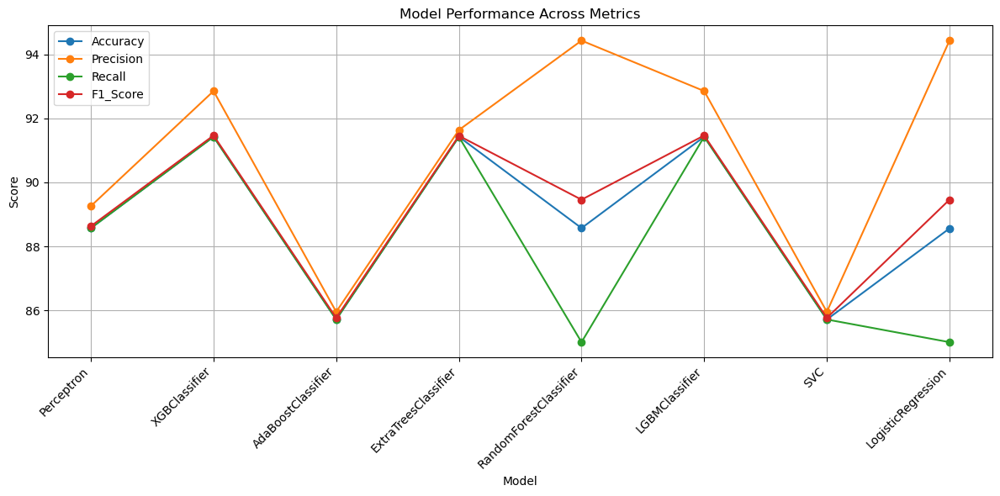

In [27]:
import matplotlib.pyplot as plt

# Model names and corresponding metrics
model_names = ['Perceptron', 'XGBClassifier', 'AdaBoostClassifier', 'ExtraTreesClassifier',
               'RandomForestClassifier', 'LGBMClassifier', 'SVC', 'LogisticRegression']
Accuracy = [88.57, 91.43, 85.71, 91.43, 88.57, 91.43, 85.71, 88.56]  # Replace with actual accuracy values
Precision = [89.26, 92.86, 85.95, 91.64, 94.44, 92.86, 85.95, 94.44]  # Replace with actual precision values
Recall = [88.57, 91.43, 85.71, 91.43, 85.00, 91.43, 85.71, 85]  # Replace with actual recall values
F1_Score = [88.63, 91.47, 85.76, 91.46, 89.46, 91.47, 85.76, 89.46]  # Replace with actual F1-score values
#roc_auc = [0.92, 0.95, 0.88, ... ]  # Replace with actual AUC-ROC scores

# Create a line chart to visualize trends across metrics
metrics = ['Accuracy', 'Precision', 'Recall', 'F1_Score']
plt.figure(figsize=(12, 6))

for i, metric in enumerate(metrics):
    plt.plot(model_names, eval(metric), label=metric, marker='o')

plt.xlabel('Model')
plt.ylabel('Score')
plt.title('Model Performance Across Metrics')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.tight_layout()
plt.show()
